<a href="https://colab.research.google.com/github/steframony/DataMiningProject/blob/main/ProjectDataMiningGulloneMonea.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install scikit-learn-extra
!pip install umap-learn
!pip install imbalanced-learn
!pip install torchviz
!pip install xgboost

#**SPOTIFY & YOUTUBE - PROGETTO DATA MINING**

---
Studenti:
* Gullone Lorena
* Monea Stefano Francesco

---

Task:

*   CLUSTERING
*   CLASSIFICAZIONE
*   REGRESSIONE
*   RETE NEURALE

---


**OBIETTIVO**:

Il seguente progetto ha come obiettivo:
* l'individuazione dei principali generi musicali mediante clustering;
* la classificazione sul sentiment (positivo-negativo) di una canzone;
* la regressione sul numero di ascolti totali delle diverse canzoni.

##OPERAZIONI PRELIMINARI
Nella seguente sezione vengono riportati gli import delle diverse librerie usate e la definizione di diverse funzioni richiamate durante lo sviluppo del progetto.

In [ ]:
import requests
import zipfile
import io
import os
import shutil
import seaborn as sns
from scipy import stats
import numpy as np
import pandas as pd
import umap
import random
import time

from scipy.spatial.distance import cdist

from sklearn.pipeline import Pipeline,FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler, FunctionTransformer, OrdinalEncoder
from sklearn.compose import ColumnTransformer

from sklearn.cluster import KMeans, DBSCAN, MeanShift, estimate_bandwidth, mean_shift
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score, pairwise_distances_argmin_min, silhouette_samples
from sklearn.model_selection import GridSearchCV, train_test_split, train_test_split, cross_val_predict
from sklearn.decomposition import PCA
from matplotlib import patches
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import FixedLocator, FixedFormatter
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.metrics import classification_report, accuracy_score,f1_score, r2_score, mean_absolute_error,mean_squared_error, make_scorer, confusion_matrix, ConfusionMatrixDisplay
from sklearn.naive_bayes import GaussianNB
from sklearn.manifold import TSNE
from sklearn.svm import SVC

import torch
import torch.nn as nn
import torch.optim as optim

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

#Funzione per poter prendere ed estrarre il dataset da github
def get_dataset_from_github(url="https://github.com/steframony/DataMiningProject/archive/main.zip",PATH_SAVE_DS="/content/dataset/"):
  response = requests.get(url)
  main_zip_file = zipfile.ZipFile(io.BytesIO(response.content))
  extract_path = PATH_SAVE_DS
  os.makedirs(extract_path, exist_ok=True)
  main_zip_file.extractall(extract_path)

  internal_zip_file_path = os.path.join(extract_path, 'DataMiningProject-main', 'dataset.zip')
  spotify_youtube_csv_path = os.path.join(extract_path, 'DataMiningProject-main', 'Spotify_Youtube.csv')

  with zipfile.ZipFile(internal_zip_file_path, 'r') as internal_zip_file:
    internal_zip_file.extract('Spotify_Youtube.csv', extract_path)
  shutil.rmtree(os.path.join(extract_path, 'DataMiningProject-main'))

  #print("Successfully scaricato")

def plot_clusters(X, y=None):
  plt.scatter(X[:, 0], X[:, 1], c="green", s=1)
  plt.xlabel("$x_1$", fontsize=14)
  plt.ylabel("$x_2$", fontsize=14, rotation=0)


def plot_pca_k_components(X_features,k_component=2):
  if k_component == 2:
    pca = PCA(n_components=k_component)
    principalComponents = pca.fit_transform(X_features)

    principalDf = pd.DataFrame(data=principalComponents, columns=['PC1', 'PC2'])

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='PC1', y='PC2', data=principalDf)
    plt.title('Data visualization with PCA in 2D')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.show()
  elif k_component == 3:
    pca = PCA(n_components=k_component)
    principalComponents = pca.fit_transform(X_features)

    principalDf = pd.DataFrame(data=principalComponents, columns=['PC1', 'PC2', 'PC3'])

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot( projection='3d')

    ax.scatter(principalDf['PC1'], principalDf['PC2'], principalDf['PC3'])

    ax.set_title('Data visualization with PCA in 3D')
    ax.set_xlabel('$PC_1$')
    ax.set_ylabel('$PC_2$')
    ax.set_zlabel('$PC_3$')

    plt.show()
  else:
    raise Exception("Number of K errato")

def dbscan_grid_search(X, eps_values, min_samples_values):

    best_eps = None
    best_min_samples = None
    best_score = -1
    num_clust = 0

    for eps in eps_values:
      for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
        labels = dbscan.fit_predict(X)

        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        if n_clusters < 2:
          print(f"Skipping iteration (eps: {eps}, min_samples: {min_samples}) - too few clusters ({n_clusters})")
          continue

        score = silhouette_score(X, labels)
        print(f"Iteration (eps: {eps}, min_samples: {min_samples}) - n_clusters: {n_clusters}, score: {score}")

        if score > best_score:
          best_eps = eps
          best_min_samples = min_samples
          best_score = score
          num_clust = n_clusters

    return best_eps, best_min_samples, best_score, num_clust


def meanshift_grid_search(data, quantile_array):

    best_quantile = None
    best_score = -1
    num_clust = 0

    for quantile in quantile_array:
      bandwidth = estimate_bandwidth(data, quantile=quantile)
      ms = MeanShift(bandwidth=bandwidth,bin_seeding=True)
      ms.fit(data)

      labelsms = ms.labels_
      n_clusters = len(set(labelsms))

      if n_clusters < 2:
        print(f"Skipping iteration (quantile: {quantile}) - too few clusters ({n_clusters})")
        continue

      score = silhouette_score(data, labelsms)
      print(f"Iteration (quantile: {quantile}) - n_clusters: {n_clusters}, score: {score}")

      if score > best_score:
        best_quantile = quantile
        best_score = score
        num_clust = n_clusters

    return best_quantile, best_score, num_clust

def plot_elbow_graph(x,y,type_graph):
  """
    X = Il valore del numero dei k_means+1
    Y = Il vettore dell'inerzia
    type_graph = (I) Inertia, (S) Silocoso
  """
  if type_graph=="I":
    plt.figure(figsize=(10, 6))
    plt.plot(range(1,x), inertias, marker='o', linestyle='-', color='g', label='Inertia')

    plt.title('Grafico del Gomito per determinare il numero ottimale di cluster', fontsize=16)
    plt.xlabel('Cluster', fontsize=14)
    plt.ylabel('Inertia', fontsize=14)

    plt.xticks(range(1, x), fontsize=12)
    plt.yticks(fontsize=12)

    plt.annotate('Elbow',
             xy=(3, inertias[2]),
             xytext=(0.55, 0.55),
             textcoords='figure fraction',
             fontsize=22,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )

    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.legend(fontsize=12)
    plt.tight_layout()

  elif type_graph=="S":

    plt.figure(figsize=(10, 6))

    plt.plot(range(2,x), y, marker='o', linestyle='-', color='g', label='Silhouette Score')

    plt.title('Grafico con indice di Silhouette determinare il numero ottimale di cluster', fontsize=16)
    plt.xlabel('Numero di cluster, k', fontsize=14)
    plt.ylabel('Silhouette score', fontsize=14)

    plt.xticks(range(1, x), fontsize=12)
    plt.yticks(fontsize=12)

    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.legend(fontsize=12)
    plt.tight_layout()

def plot_umap_k_component(data, model, k_component=2, with_centroid=False):

  kmeans_labels = model.labels_
  kmeans_centroids = model.cluster_centers_

  if with_centroid:
    if k_component == 2:
      reducer = umap.UMAP(n_components=k_component, random_state=42,n_jobs=1)
      embedding = reducer.fit_transform(data)
      centroids_embedding = reducer.transform(kmeans_centroids)
      plt.figure(figsize=(10, 8))
      plt.scatter(embedding[:, 0], embedding[:, 1], c=kmeans_labels, cmap='viridis', s=50, alpha=0.6, edgecolor='k')
      plt.scatter(centroids_embedding[:, 0], centroids_embedding[:, 1], c='red', s=200, marker='X', label='Centroids')
      plt.legend()
      plt.title('K-means Clustering con UMAP in 2D')
      plt.xlabel('UMAP1')
      plt.ylabel('UMAP2')
      plt.show()
    else:
      raise Exception("Still not written")
  else:
    if k_component == 2:
      reducer = umap.UMAP(n_components=2, random_state=42,n_jobs=1)
      embedding = reducer.fit_transform(data)
      plt.figure(figsize=(10, 8))
      plt.scatter(embedding[:, 0], embedding[:, 1], c=kmeans_labels, cmap='viridis', s=50, alpha=0.6, edgecolor='k')
      plt.legend()
      plt.title('K-means Clustering con UMAP in 2D')
      plt.xlabel('UMAP1')
      plt.ylabel('UMAP2')
      plt.show()
    elif k_component == 3:
      reducer = umap.UMAP(n_components=3, random_state=42,n_jobs=1)
      embedding = reducer.fit_transform(data)

      fig = plt.figure(figsize=(10, 8))
      ax = fig.add_subplot(111, projection='3d')

      scatter = ax.scatter(embedding[:, 0], embedding[:, 1], embedding[:, 2], c=kmeans_labels, cmap='viridis', s=50, alpha=0.6, edgecolor='k')

      legend = ax.legend(*scatter.legend_elements(), title="Clusters")
      ax.add_artist(legend)
      ax.legend()

      ax.set_xlabel('UMAP1')
      ax.set_ylabel('UMAP2')
      ax.set_zlabel('UMAP3')

      plt.title('K-means Clustering con UMAP in 3D')
      plt.show()

def plot_umap_data_2d(data):
  reducer = umap.UMAP(n_components=2,random_state=42,init="spectral",n_jobs=1)
  embedding = reducer.fit_transform(data)

  plt.figure(figsize=(10, 7))
  plt.scatter(embedding[:, 0], embedding[:, 1], s=10, c='green')
  plt.title('Dataset visualization with UMAP in 2D')
  plt.xlabel('UMAP1')
  plt.ylabel('UMAP2')
  plt.show()

def plot_umap_data_3d(data):

  umap_model = umap.UMAP(n_components=3,random_state=42,init="spectral",n_jobs=1)
  umap_data = umap_model.fit_transform(data)

  fig = plt.figure(figsize=(8, 6))
  ax = fig.add_subplot(111, projection='3d')

  ax.scatter(umap_data[:, 0], umap_data[:, 1], umap_data[:, 2], c='green', s=10)

  ax.set_xlabel('UMAP 1')
  ax.set_ylabel('UMAP 2')
  ax.set_zlabel('UMAP 3')

  ax.set_title('Dataset visualization with UMAP in 3D')

  plt.show()

def plot_dbscan_with_umap(data, labels):

  umap_reducer = umap.UMAP(random_state=42,n_jobs=1)
  embedding = umap_reducer.fit_transform(data)

  plt.figure(figsize=(10, 8))
  unique_labels = np.unique(labels)

  colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
  labels_with_names = ["Cluster {}".format(i) for i in unique_labels]

  legend_elements = []
  for k, col, label_name in zip(unique_labels, colors,labels_with_names):

    if k == -1:
      col = [0, 0, 0, 1] #Colore nero  per il rumore
      legend_elements.append(patches.Patch(facecolor=col, label="Noise"))
    else:
      legend_elements.append(patches.Patch(facecolor=col, label=label_name))

    class_member_mask = (labels == k)
    xy = embedding[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),markeredgecolor='k', markersize=6)

  plt.legend(handles=legend_elements, title="Clusters")
  plt.title('DBSCAN clustering results with UMAP reduction')
  plt.xlabel('UMAP 1')
  plt.ylabel('UMAP 2')
  plt.show()

def plot_dbscan_with_umap_3d(data, labels):
    umap_reducer = umap.UMAP(n_components=3, random_state=42,n_jobs=1)
    embedding = umap_reducer.fit_transform(data)

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    unique_labels = np.unique(labels)
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
    labels_with_names = ["Cluster {}".format(i) for i in unique_labels]

    legend_elements = []
    for k, col, label_name in zip(unique_labels, colors, labels_with_names):
        if k == -1:
            col = [0, 0, 0, 1] #Colore nero per il rumore
            legend_elements.append(patches.Patch(facecolor=col, label="Noise"))
        else:
            legend_elements.append(patches.Patch(facecolor=col, label=label_name))

        class_member_mask = (labels == k)
        xy = embedding[class_member_mask]
        ax.scatter(xy[:, 0], xy[:, 1], xy[:, 2], 'o', color=tuple(col), edgecolor='k', s=60)

    ax.legend(handles=legend_elements, title="Clusters")
    ax.set_title('DBSCAN clustering results with UMAP reduction (3D)')
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    ax.set_zlabel('UMAP 3')
    plt.show()

def plot_dataset_tsne(X, plot_dim=2):
    if plot_dim == 3:
        tsne = TSNE(n_components=3, random_state=42)
        X_tsne = tsne.fit_transform(X)

        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], s=50, c='green')
        ax.set_title('Dataset Visualization (TSNE in 3D)')
        ax.set_xlabel('TSNE Component 1')
        ax.set_ylabel('TSNE Component 2')
        ax.set_zlabel('TSNE Component 3')
    else:
        tsne = TSNE(n_components=2, random_state=42)
        X_tsne = tsne.fit_transform(X)

        plt.figure(figsize=(10, 8))
        plt.scatter(X_tsne[:, 0], X_tsne[:, 1], s=50, c='green')
        plt.title('Dataset Visualization (TSNE in 2D)')
        plt.xlabel('TSNE Component 1')
        plt.ylabel('TSNE Component 2')

    plt.tight_layout()
    plt.show()

def plot_kmeans_clusters(X, labels_cluster, plot_dim=2):

    cluster_labels = labels_cluster

    if plot_dim == 3:
        tsne = TSNE(n_components=3, random_state=42)
        X_tsne = tsne.fit_transform(X)
    else:
        tsne = TSNE(n_components=2, random_state=42)
        X_tsne = tsne.fit_transform(X)

    if plot_dim == 3:
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], c=cluster_labels, cmap='viridis', s=50)
        ax.set_title('K-means Clustering (TSNE in 3D)')
        ax.set_xlabel('TSNE Component 1')
        ax.set_ylabel('TSNE Component 2')
        ax.set_zlabel('TSNE Component 3')
    else:
        plt.figure(figsize=(10, 8))
        sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=cluster_labels, palette='viridis', s=50)
        plt.title('K-means Clustering (TSNE in 2D)')
        plt.xlabel('TSNE Component 1')
        plt.ylabel('TSNE Component 2')

    plt.legend()
    plt.tight_layout()
    plt.show()

## Task 1 Clustering


Il pre-processing dei dati rappresenta una fase cruciale all'interno del ciclo di vita di un progetto di data mining. Consiste in una serie di operazioni volte a trasformare i dati grezzi in un formato pulito, coerente e pronto per essere utilizzato nelle analisi successive.
In questo progetto, abbiamo dedicato particolare attenzione alla fase di pre-processing per assicurarci che i dati fossero affidabili e privi di errori. Le operazioni eseguite includono la rimozione di valori mancanti, la correzione di incoerenze, la normalizzazione dei dati e la loro trasformazione in un formato omogeneo. Questo insieme di passaggi ha permesso di creare una base solida per le analisi successive, garantendo che i risultati ottenuti siano accurati.

### 1.1 Esplorazione del Dataset


Per comprendere il tipo di record presenti nel dataset visualizziamo le prime 5 istanze del dataset, mediante il comando *head()*.

In [ ]:
get_dataset_from_github()
ds = pd.read_csv("/content/dataset/Spotify_Youtube.csv")
ds.head()

,Unnamed: 0,Artist,Url_spotify,Track,Album,Album_type,Uri,Danceability,Energy,Key,...,Url_youtube,Title,Channel,Views,Likes,Comments,Description,Licensed,official_video,Stream
0,0,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Feel Good Inc.,Demon Days,album,spotify:track:0d28khcov6AiegSCpG5TuT,0.818,0.705,6.0,...,https://www.youtube.com/watch?v=HyHNuVaZJ-k,Gorillaz - Feel Good Inc. (Official Video),Gorillaz,693555221.0,6220896.0,169907.0,Official HD Video for Gorillaz' fantastic trac...,True,True,1.040235e+09
1,1,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Rhinestone Eyes,Plastic Beach,album,spotify:track:1foMv2HQwfQ2vntFf9HFeG,0.676,0.703,8.0,...,https://www.youtube.com/watch?v=yYDmaexVHic,Gorillaz - Rhinestone Eyes [Storyboard Film] (...,Gorillaz,72011645.0,1079128.0,31003.0,The official video for Gorillaz - Rhinestone E...,True,True,3.100837e+08
2,2,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,spotify:track:64dLd6rVqDLtkXFYrEUHIU,0.695,0.923,1.0,...,https://www.youtube.com/watch?v=qJa-VFwPpYA,Gorillaz - New Gold ft. Tame Impala & Bootie B...,Gorillaz,8435055.0,282142.0,7399.0,Gorillaz - New Gold ft. Tame Impala & Bootie B...,True,True,6.306347e+07
3,3,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,On Melancholy Hill,Plastic Beach,album,spotify:track:0q6LuUqGLUiCPP1cbdwFs3,0.689,0.739,2.0,...,https://www.youtube.com/watch?v=04mfKJWDSzI,Gorillaz - On Melancholy Hill (Official Video),Gorillaz,211754952.0,1788577.0,55229.0,Follow Gorillaz online:\nhttp://gorillaz.com \...,True,True,4.346636e+08
4,4,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Clint Eastwood,Gorillaz,album,spotify:track:7yMiX7n9SBvadzox8T5jzT,0.663,0.694,10.0,...,https://www.youtube.com/watch?v=1V_xRb0x9aw,Gorillaz - Clint Eastwood (Official Video),Gorillaz,618480958.0,6197318.0,155930.0,The official music video for Gorillaz - Clint ...,True,True,6.172597e+08


In [ ]:
ds.tail()

,Unnamed: 0,Artist,Url_spotify,Track,Album,Album_type,Uri,Danceability,Energy,Key,...,Url_youtube,Title,Channel,Views,Likes,Comments,Description,Licensed,official_video,Stream
20713,20713,SICK LEGEND,https://open.spotify.com/artist/3EYY5FwDkHEYLw...,JUST DANCE HARDSTYLE,JUST DANCE HARDSTYLE,single,spotify:track:0RtcKQGyI4hr8FgFH1TuYG,0.582,0.926,5.0,...,https://www.youtube.com/watch?v=5SHmKFKlNqI,JUST DANCE HARDSTYLE,SICK LEGEND - Topic,71678.0,1113.0,0.0,Provided to YouTube by Routenote\n\nJUST DANCE...,True,True,9227144.0
20714,20714,SICK LEGEND,https://open.spotify.com/artist/3EYY5FwDkHEYLw...,SET FIRE TO THE RAIN HARDSTYLE,SET FIRE TO THE RAIN HARDSTYLE,single,spotify:track:3rHvPA8lUnPBkaLyPOc0VV,0.531,0.936,4.0,...,https://www.youtube.com/watch?v=ocTH6KxllDQ,SET FIRE TO THE RAIN HARDSTYLE,SICK LEGEND - Topic,164741.0,2019.0,0.0,Provided to YouTube by Routenote\n\nSET FIRE T...,True,True,10898176.0
20715,20715,SICK LEGEND,https://open.spotify.com/artist/3EYY5FwDkHEYLw...,OUTSIDE HARDSTYLE SPED UP,OUTSIDE HARDSTYLE SPED UP,single,spotify:track:4jk00YxPtPbhvHJE9N4ddv,0.443,0.830,4.0,...,https://www.youtube.com/watch?v=5wFhE-HY0hg,OUTSIDE HARDSTYLE SPED UP,SICK LEGEND - Topic,35646.0,329.0,0.0,Provided to YouTube by Routenote\n\nOUTSIDE HA...,True,True,6226110.0
20716,20716,SICK LEGEND,https://open.spotify.com/artist/3EYY5FwDkHEYLw...,ONLY GIRL HARDSTYLE,ONLY GIRL HARDSTYLE,single,spotify:track:5EyErbpsugWliX006eTDex,0.417,0.767,9.0,...,https://www.youtube.com/watch?v=VMFLbFRNCn0,ONLY GIRL HARDSTYLE,SICK LEGEND - Topic,6533.0,88.0,0.0,Provided to YouTube by Routenote\n\nONLY GIRL ...,True,True,6873961.0
20717,20717,SICK LEGEND,https://open.spotify.com/artist/3EYY5FwDkHEYLw...,MISS YOU HARDSTYLE,MISS YOU HARDSTYLE,single,spotify:track:6lOn0jz1QpjcWeXo1oMm0k,0.498,0.938,6.0,...,https://www.youtube.com/watch?v=zau0dckCFi0,MISS YOU HARDSTYLE,SICK LEGEND - Topic,158697.0,2484.0,0.0,Provided to YouTube by Routenote\n\nMISS YOU H...,True,True,5695584.0


L'attributo *Unnamed:0* corrisponde ad un identificativo della tupla nel dataset; per questioni di leggibilità, lo si sostituisce con al dicitura *Id*

In [ ]:
ds.rename(columns={'Unnamed: 0':'Id'},inplace=True)
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20718 entries, 0 to 20717
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Id                20718 non-null  int64  
 1   Artist            20718 non-null  object 
 2   Url_spotify       20718 non-null  object 
 3   Track             20718 non-null  object 
 4   Album             20718 non-null  object 
 5   Album_type        20718 non-null  object 
 6   Uri               20718 non-null  object 
 7   Danceability      20716 non-null  float64
 8   Energy            20716 non-null  float64
 9   Key               20716 non-null  float64
 10  Loudness          20716 non-null  float64
 11  Speechiness       20716 non-null  float64
 12  Acousticness      20716 non-null  float64
 13  Instrumentalness  20716 non-null  float64
 14  Liveness          20716 non-null  float64
 15  Valence           20716 non-null  float64
 16  Tempo             20716 non-null  float6

Ci sono in totale esattamente 20.718 istanze nel dataset.
I tipi che le nostre features assumono sono:
* int64 e float64;
* object: potrebbe contenere qualsiasi tipo di oggetto Python, ma dal momento che il dataset è un file CSV sappiamo che deve essere un attributo di testo.



Il dataset presenta 26 features per ciascuna delle canzoni raccolte da Spotify e Youtube.

La valenza degli attributi è descritta brevemente di seguito:

- **Track**: nome della canzone, come visibile sulla piattaforma Spotify;
- **Artist**: nome dell'artista;
- **Url_spotify**: URL dell'artista su Spotify;
- **Album**: album in cui la canzone è contenuta su Spotify;
- **Album_type**: indica se la canzone è pubblicata su Spotify come singolo o se contenuta in un album;
- **Uri**: un link Spotify utilizzato per trovare la canzone tramite l'API;
- **Danceability**: descrive quanto una traccia è adatta per essere ballata, basandosi su una combinazione di elementi musicali come il tempo, la stabilità del ritmo, la forza del battito e la regolarità complessiva. Si tratta di un range di valori che varia nel continuo tra 0 e 1;
- **Energy**: rappresenta una misura percettiva di intensità e attività. Le caratteristiche percettive che contribuiscono a questo attributo includono gamma dinamica, volume percepito, timbro, tasso di insorgenza e entropia generale. Corrisponde ad una misura che varia tra 0 e 1;
- **Key**: la tonalità della traccia. Gli interi mappano le note usando la notazione standard Pitch Class. Se non è stata rilevata alcuna tonalità, il valore è -1;
- **Loudness**: il volume complessivo di una traccia in decibel (dB). I valori di volume sono mediati su tutta la traccia e sono utili per confrontare il volume relativo delle tracce. Il volume è la qualità di un suono che è la principale correlazione psicologica della forza fisica (ampiezza). I valori tipicamente variano tra -60 e 0 dB;
- **Speechiness**: rileva la presenza di parole parlate in una traccia. Più la registrazione è esclusivamente simile al parlato, più il valore dell'attributo si avvicina a 1.0. Possiede anch'esso valori compresi tra 0 ed 1;
- **Acousticness**: una misura di confidenza da 0.0 a 1.0 che indica se la traccia è acustica. Una traccia acustica è una registrazione musicale che utilizza strumenti acustici, ovvero strumenti che producono suono attraverso mezzi meccanici o naturali senza l'uso di amplificazione elettronica;
- **Instrumentalness**: predice se una traccia non contiene vocali. Suoni come "Ooh" e "aah" sono considerati strumentali in questo contesto;
- **Liveness**: rileva la presenza di un pubblico nella registrazione. Valori di liveness più alti rappresentano una maggiore probabilità che la traccia sia stata eseguita dal vivo. Un valore sopra 0.8 indica una forte probabilità che la traccia sia dal vivo;
- **Valence**: una misura da 0.0 a 1.0 che descrive la positività musicale trasmessa da una traccia. Le tracce con alta valence suonano più positive (es. felici, allegre, euforiche), mentre le tracce con bassa valence suonano più negative (es. tristi, depresse, arrabbiate);
- **Tempo**: il tempo complessivo stimato di una traccia in battiti per minuto (BPM). In terminologia musicale, il tempo è la velocità o il ritmo di un brano dato e deriva direttamente dalla durata media del battito;
- **Duration_ms**: la durata della traccia in millisecondi;
- **Stream**: numero di stream della canzone su Spotify;
- **Url_youtube**: URL del video collegato alla canzone su YouTube, se presente;
- **Title**: titolo del videoclip su YouTube;
- **Channel**: nome del canale che ha pubblicato il video;
- **Views**: numero di visualizzazioni;
- **Likes**: numero di "mi piace";
- **Comments**: numero di commenti;
- **Description**: descrizione del video su YouTube;
- **Licensed**: indica se il video rappresenta contenuti con licenza, il che significa che il contenuto è stato caricato su un canale collegato a un partner di contenuti di YouTube e quindi rivendicato da quel partner;
- **Official_video**: valore booleano che indica se il video trovato è il video ufficiale della canzone;

L'attributo *Id* risulta identificativo di ogni tupla nel dataset per cui lo si rimuove non ritenendolo informativo e utile ai fini dell'analisi.

Una volta rimosso tale attributo si procede nel verificare la presenza di valori non specificati all'interno del dataset. In particolare, per ogni feature, viene calcolata la percentuale di valori nulli presenti.

In [ ]:
ds_1 = ds.drop(columns="Id",inplace=False)
pd.DataFrame(ds_1.isnull().sum()/ds_1.shape[0]).T

,Artist,Url_spotify,Track,Album,Album_type,Uri,Danceability,Energy,Key,Loudness,...,Url_youtube,Title,Channel,Views,Likes,Comments,Description,Licensed,official_video,Stream
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000097,0.000097,0.000097,0.000097,...,0.022686,0.022686,0.022686,0.022686,0.026113,0.027464,0.042282,0.022686,0.022686,0.027802


In [ ]:
ds_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20718 entries, 0 to 20717
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20718 non-null  object 
 1   Url_spotify       20718 non-null  object 
 2   Track             20718 non-null  object 
 3   Album             20718 non-null  object 
 4   Album_type        20718 non-null  object 
 5   Uri               20718 non-null  object 
 6   Danceability      20716 non-null  float64
 7   Energy            20716 non-null  float64
 8   Key               20716 non-null  float64
 9   Loudness          20716 non-null  float64
 10  Speechiness       20716 non-null  float64
 11  Acousticness      20716 non-null  float64
 12  Instrumentalness  20716 non-null  float64
 13  Liveness          20716 non-null  float64
 14  Valence           20716 non-null  float64
 15  Tempo             20716 non-null  float64
 16  Duration_ms       20716 non-null  float6

L'output prodotto permette di notare la presenza di valori mancanti e, in particolare, per:
* *Danceability, Energy, Key, Loudness, Speechiness, Acousticness, Instrumentalness, Liveness, Valance, Tempo e Duration_ms* sono specificati 20.716 valori su 20.718 istanze totali. Questo significa che per ognuna delle features, 2 istanze possiedono dei valori mancanti;
* *Url_youtube, Title, Channel, Views, Licensed e Official_video* sono specificati esattamente 20.248 valori. Ci sono dunque circa 468 istanze che possiedono valori mancanti;
* *Likes* che possiede 20.177 valori non nulli, per cui si hanno 541 valori mancanti;
* *Comments* sono specificati 20.142 valori, per cui 576 sono mancanti;
* *Stream* sono presenti 20.149 valori, per cui si hanno 569 valori mancanti;
* *Description* possiede esattamente 19.842 valori non nulli per cui 876 valori mancanti.

La presenza di valori non specificati nel dataset è critica e potrebbe compromettere l'accuratezza dei modelli predittivi e le conclusioni tratte dai dati. Il problema dei valori verrà affrontato in seguito, in un'apposita sezione in cui si andranno a gestire in maniera opportuna.

Esaminando attentamente le prime e le ultime cinque righe del dataset, possiamo notare che i valori che assume l'attributo *Album_type* sono sempre gli stessi; questo porta a pensare che si tratti di un attributo categorico, cosi come *Licensed* e *Official_video*, che assumono solo valori pari a *True* e *False*.

In [ ]:
ds["Album_type"].value_counts()

Album_type
album          14926
single          5004
compilation      788
Name: count, dtype: int64

In [ ]:
ds["Licensed"].value_counts()

Licensed
True     14140
False     6108
Name: count, dtype: int64

In [ ]:
ds["official_video"].value_counts()

official_video
True     15723
False     4525
Name: count, dtype: int64

Dopo questa prima fase di analisi, si è deciso, per il momento, di rimuovere i seguenti attributi in quanto non rilevanti ai fini dell'analisi e per gli obiettivi della trattazione:
* Id;
* Url_spotify;
* Uri;
* Url_youtube;
* Title;
* Description;
* Channel;
* Licensed,
* Offical_video.

In [ ]:
ds_1 = ds.drop(columns=["Id","Url_spotify","Uri","Url_youtube","Title","Description","Channel", "official_video"],inplace=False)
ds_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20718 entries, 0 to 20717
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20718 non-null  object 
 1   Track             20718 non-null  object 
 2   Album             20718 non-null  object 
 3   Album_type        20718 non-null  object 
 4   Danceability      20716 non-null  float64
 5   Energy            20716 non-null  float64
 6   Key               20716 non-null  float64
 7   Loudness          20716 non-null  float64
 8   Speechiness       20716 non-null  float64
 9   Acousticness      20716 non-null  float64
 10  Instrumentalness  20716 non-null  float64
 11  Liveness          20716 non-null  float64
 12  Valence           20716 non-null  float64
 13  Tempo             20716 non-null  float64
 14  Duration_ms       20716 non-null  float64
 15  Views             20248 non-null  float64
 16  Likes             20177 non-null  float6

Si procede, dunque, nel verificare la presenza di istanze duplicate andando a verificare se nelle istanze non vi sia una canzone duplicata, magari con lo stesso nome cantata dallo stesso artista.

In [ ]:
ds_1["Track"].value_counts()

Track
El Ultimo Adiós - Varios Artistas Version    24
Color Esperanza 2020                         19
Resistiré                                    14
Roll Me Up and Smoke Me When I Die - Live     9
Valentine's Mashup 2019                       9
                                             ..
Sekali Ini Saja                               1
Akhir Cerita Cinta                            1
Sedih Tak Berujung                            1
Terserah                                      1
MISS YOU HARDSTYLE                            1
Name: count, Length: 17841, dtype: int64

Apparentemente potrebbe sembrare che vi siano stesse canzoni ripetute più volte, però prestando attenzione possiamo notare che l'artista cambia:

In [ ]:
ds_1[ds_1["Track"]=="El Ultimo Adiós - Varios Artistas Version"].head()

,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream
759,Alejandro Sanz,El Ultimo Adiós - Varios Artistas Version,El Ultimo Adiós,single,0.276,0.572,1.0,-7.818,0.0377,0.641,0.0,0.2,0.285,77.986,237467.0,764831.0,5730.0,472.0,False,169769959.0
809,Christina Aguilera,El Ultimo Adiós - Varios Artistas Version,El Ultimo Adiós,single,0.276,0.572,1.0,-7.818,0.0377,0.641,0.0,0.2,0.285,77.986,237467.0,8605.0,118.0,7.0,False,169769959.0
900,Alejandro Fernández,El Ultimo Adiós - Varios Artistas Version,El Ultimo Adiós,single,0.276,0.572,1.0,-7.818,0.0377,0.641,0.0,0.2,0.285,77.986,237467.0,764831.0,5730.0,472.0,False,169769959.0
1148,Luis Fonsi,El Ultimo Adiós - Varios Artistas Version,El Ultimo Adiós,single,0.276,0.572,1.0,-7.818,0.0377,0.641,0.0,0.2,0.285,77.986,237467.0,129107.0,973.0,107.0,False,169769959.0
1247,José José,El Ultimo Adiós - Varios Artistas Version,El Ultimo Adiós,single,0.276,0.572,1.0,-7.818,0.0377,0.641,0.0,0.2,0.285,77.986,237467.0,764831.0,5730.0,472.0,False,169769959.0


In [ ]:
ds_1.shape

(20718, 20)

In [ ]:
ds_t = ds_1.drop_duplicates(inplace = False)
ds_t.shape

(20718, 20)

Possiamo concludere che nel dataset non vi sono presenti istanze duplicate.

### 1.2 Plotting e analisi esplorativa dei dati

In [ ]:
ds_1.describe()

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Stream
count,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,2.071600e+04,2.024800e+04,2.017700e+04,2.014900e+04,2.014200e+04
mean,0.619777,0.635250,5.300348,-7.671680,0.096456,0.291535,0.055962,0.193521,0.529853,120.638340,2.247176e+05,9.393782e+07,6.633411e+05,2.751899e+04,1.359422e+08
std,0.165272,0.214147,3.576449,4.632749,0.111960,0.286299,0.193262,0.168531,0.245441,29.579018,1.247905e+05,2.746443e+08,1.789324e+06,1.932347e+05,2.441321e+08
min,0.000000,0.000020,0.000000,-46.251000,0.000000,0.000001,0.000000,0.014500,0.000000,0.000000,3.098500e+04,0.000000e+00,0.000000e+00,0.000000e+00,6.574000e+03
25%,0.518000,0.507000,2.000000,-8.858000,0.035700,0.045200,0.000000,0.094100,0.339000,97.002000,1.800095e+05,1.826002e+06,2.158100e+04,5.090000e+02,1.767486e+07
50%,0.637000,0.666000,5.000000,-6.536000,0.050500,0.193000,0.000002,0.125000,0.537000,119.965000,2.132845e+05,1.450110e+07,1.244810e+05,3.277000e+03,4.968298e+07
75%,0.740250,0.798000,8.000000,-4.931000,0.103000,0.477250,0.000463,0.237000,0.726250,139.935000,2.524430e+05,7.039975e+07,5.221480e+05,1.436000e+04,1.383581e+08
max,0.975000,1.000000,11.000000,0.920000,0.964000,0.996000,1.000000,1.000000,0.993000,243.372000,4.676058e+06,8.079649e+09,5.078865e+07,1.608314e+07,3.386520e+09


Da una prima analisi agli attributi numerici notiamo che:

 * Le canzoni sono piuttosto ballabili, in quanto la media di danceability è vicina ad 1;
 * Le canzoni sono rumorose, intense e veloci, lo possiamo dedurre dal fatto che il valore della media di energy è vicino all'1 e, inoltre, il valore minimo è diverso dallo 0;
 * Nel dataset sono presenti canzoni che possiedono diverse tonalità, ciò è possibile dedurlo da un alta dispersione dell'attributo key;
 * Le canzoni non sono troppo forti, (canzoni forti sono quelli che possiedono strumenti a percussioni come la batteria), come indicato dalla media negativa relativa a loudness che presume ci siano molti valori negativi;
 * Le canzoni non sono, in media, orientate ai discorsi ma si hanno canzoni che probabilmente sono per lo più strumentali in quanto la media di speechiness è bassa;
 * Le canzoni probabilmente non sono acustice, come si può dedurre dalla media molto bassa si acousticness;
 * Le canzoni molto probabilmente non sono state registrate dal vivo, questo è dedotto da un valore basso della feature liveness;
 * Il dataset ha una tendenza ad avere canzoni mediamente neutre, con una leggera prevalenza di brani positivi.

Da questa analisi però possiamo notare che vi è la presenza di un minimo nelle features come: like, comments, views e Tempo. Verifichiamo se le istanze che possiedono il valore 0 in Views possiedano anche 0 Likes e Comments.

Per quanto riguarda Tempo, andiamo ad analizzare nel dettaglio questa feature successivamente, in quanto sicuramente sono presenti outliers: un Tempo pari a 0 BPM indica che la canzone non ha alcun battito o suono, cosa altamente improbabile.

In [ ]:
ds_1[ds_1["Views"] == 0]

,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream
5898,Santiago Ziesmer,Kapitel 5.2 & Kapitel 6.1 - Die kleine Hexe - ...,Die kleine Hexe - Das Hörspiel,album,0.599,0.241,10.0,-17.925,0.915,0.734,0.0,0.484,0.631,84.929,286933.0,0.0,0.0,0.0,True,NaN


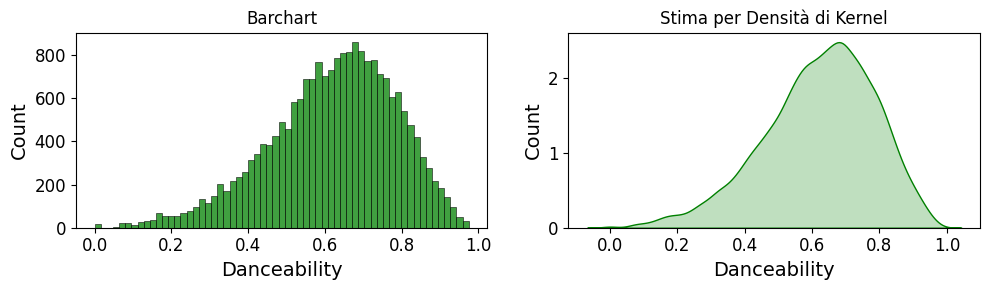

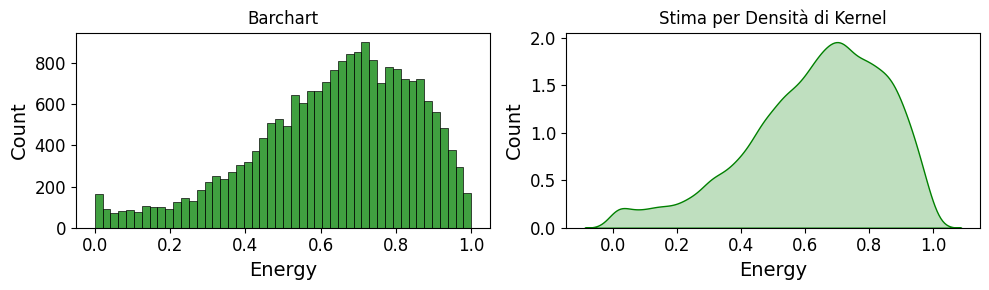

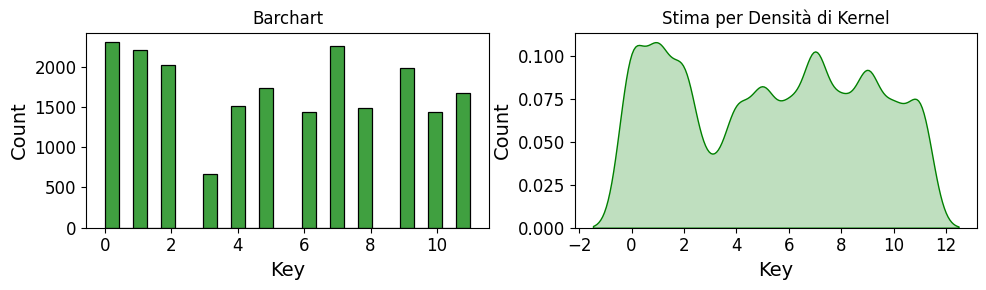

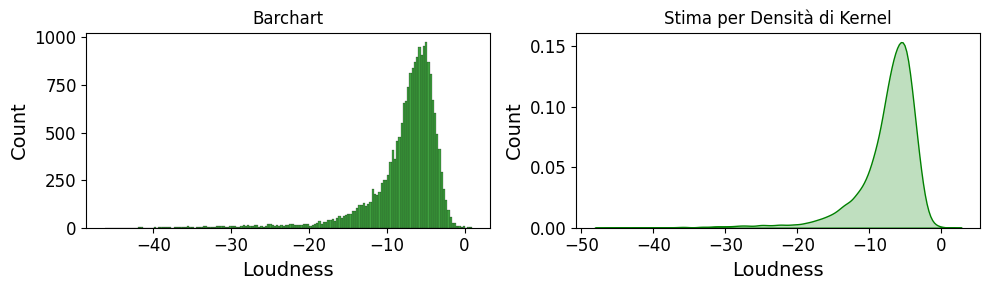

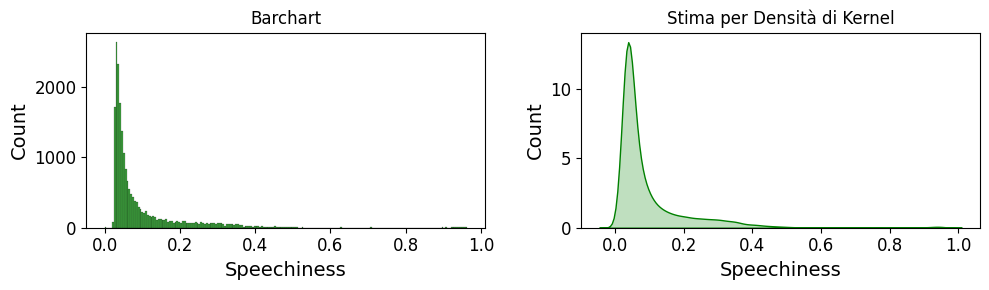

...

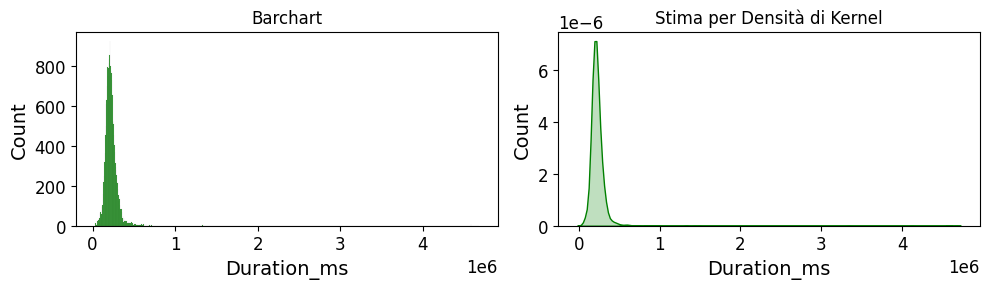

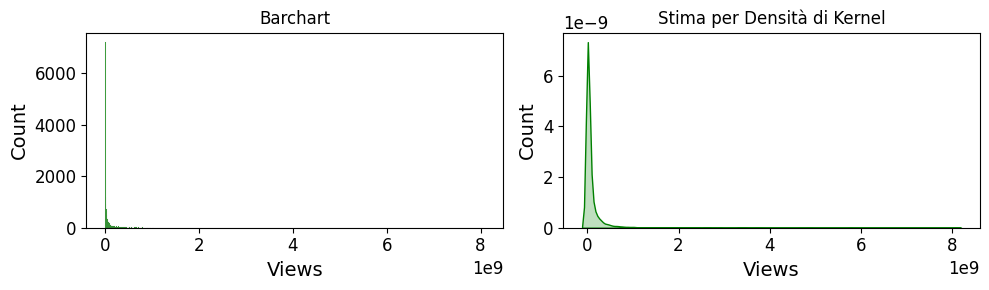

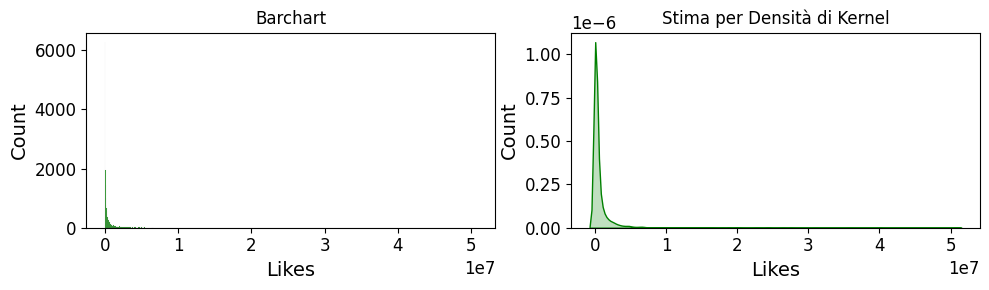

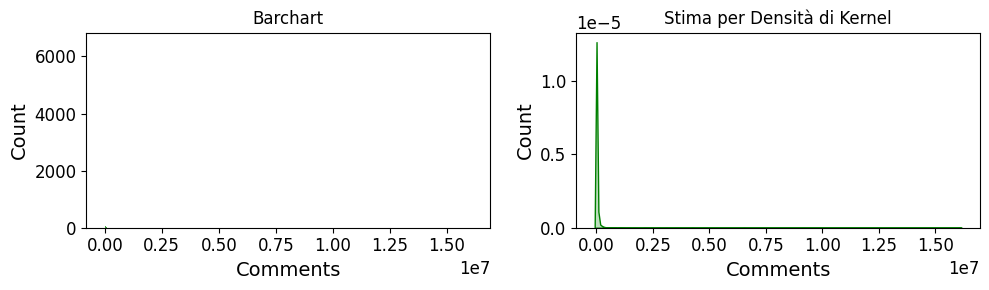

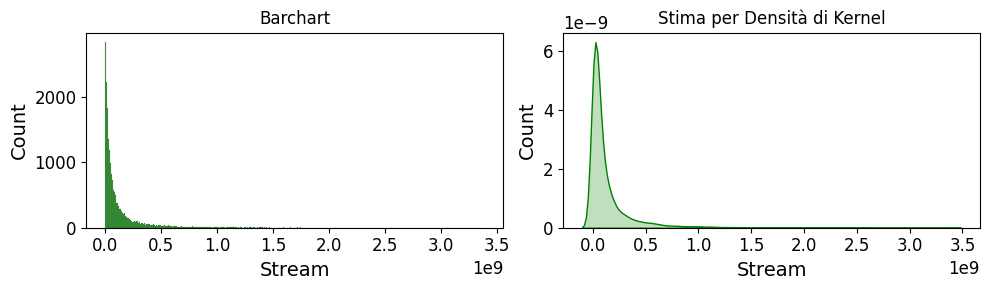

In [ ]:
def plot_histogram(dataset,feature):

  fig, axs = plt.subplots(1, 2, figsize=(10, 3))

  sns.histplot(data=dataset[feature], ax=axs[0],color="green")
  sns.kdeplot(data=dataset[feature], ax=axs[1],fill=True, color="green")

  axs[0].set_title("Barchart")
  axs[1].set_title("Stima per Densità di Kernel")
  axs[0].set_xlabel(feature)
  axs[1].set_xlabel(feature)
  axs[0].set_ylabel("Count")
  axs[1].set_ylabel("Count")

  plt.tight_layout()
  plt.show()

features_numeriche = ds_1.select_dtypes(include=[np.number]).columns
for feature in features_numeriche:
  plot_histogram(ds_1,feature)

I grafici riportati permettono di effettuare alcune considerazioni interessanti:
- le features *danceability*, *energy* e *valence* presentano una distribuzione abbastanza omogenea con una varianza non troppo elevata. Si avvicinano approssimativamente ad avere una distribuzione normale che sembra centrata sul valore medio di ciascun attributo
- la feature *key*, anche se si presenta come un attributo numerico in realtà dovrebbe essere trattata come un attributo categorico
- le feature *loudness*, *acousticness*, *instrumentalness*, *speachness* e *liveness hanno distribuzione fortemente asimmetrica con code abbastanza lunghe e picchi concentrati in un range ristretto di valori. Questo porta a supporre la presenza di eventuali outliers
- la feature *tempo* presenta una distribuzione bimodale con due picchi facilmente individuabili dal grafico di stima dlela densità del kernel.

Controlliamo se all'interno del dataset non vi sia una qualche forma di correlazione:

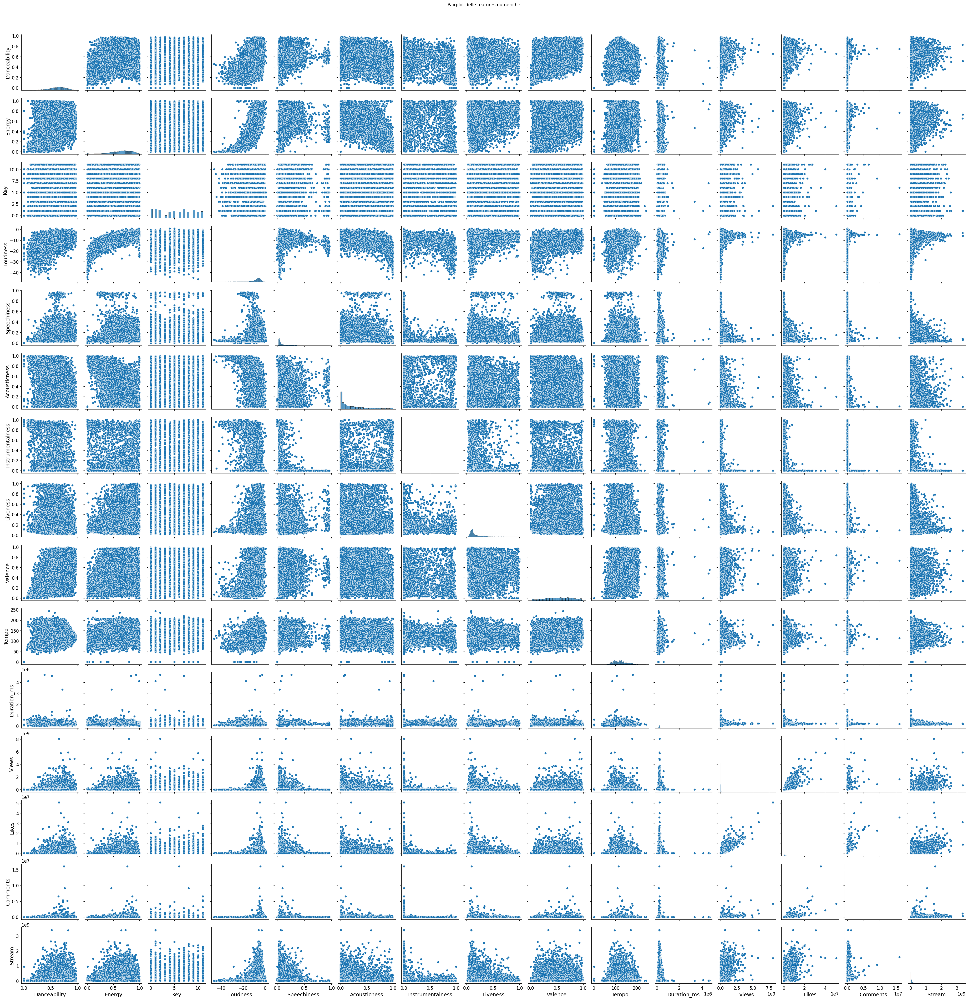

In [ ]:
numerical_features = ds_1.select_dtypes(include=[np.number]).columns
sns.pairplot(ds_1[numerical_features])
plt.suptitle('Pairplot delle features numeriche', y=1.02)
plt.show()

Dai grafici non sembra emergere qualche particolare forma di correlaizone in quanto i punti si dispongono in maniera abbastanza casuale. Si presta, tuttavia, particolare attenzione alle seguenti coppie di features:
- *comments* e *like*
- *like* e *views*
- *loudness* e *energy*

Mentre nei primi due casi si osserva una correlazione di tipo lineare, nel terzo caso la relazione tra le due variabili sembra essere di tipo quadratico.

Per entrare nel eìdettaglio, si procede visualizzando la matrice di correlazione.


In [ ]:
corr_matrix = ds_1.corr(numeric_only=True)
corr_matrix

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Stream
Danceability,1.000000,0.236596,0.037735,0.353408,0.210376,-0.279435,-0.318611,-0.084482,0.465756,-0.065943,-0.089159,0.088546,0.099396,0.043940,0.073375
Energy,0.236596,1.000000,0.030160,0.744845,0.065319,-0.658304,-0.310058,0.173717,0.389158,0.157383,0.022660,0.067575,0.062824,0.044703,0.044239
Key,0.037735,0.030160,1.000000,0.025266,0.019778,-0.030818,0.000747,-0.011008,0.042559,0.001855,0.003186,0.007767,0.006751,0.007041,-0.006287
Loudness,0.353408,0.744845,0.025266,1.000000,0.033699,-0.547680,-0.545406,0.087062,0.311578,0.144766,0.012063,0.119244,0.124887,0.059626,0.118695
Speechiness,0.210376,0.065319,0.019778,0.033699,1.000000,-0.077598,-0.109895,0.085463,0.059204,0.037553,-0.051248,-0.013240,0.007495,0.008122,-0.016239
Acousticness,-0.279435,-0.658304,-0.030818,-0.547680,-0.077598,1.000000,0.274379,-0.040922,-0.200816,-0.129367,-0.028834,-0.071240,-0.078591,-0.052381,-0.104843
Instrumentalness,-0.318611,-0.310058,0.000747,-0.545406,-0.109895,0.274379,1.000000,-0.060021,-0.269785,-0.076734,-0.007284,-0.078405,-0.078427,-0.031468,-0.091942
Liveness,-0.084482,0.173717,-0.011008,0.087062,0.085463,-0.040922,-0.060021,1.000000,0.031904,0.006670,-0.004970,-0.015715,-0.022740,-0.013046,-0.039617
Valence,0.465756,0.389158,0.042559,0.311578,0.059204,-0.200816,-0.269785,0.031904,1.000000,0.090432,-0.052331,0.035423,0.011864,0.017381,-0.012109
Tempo,-0.065943,0.157383,0.001855,0.144766,0.037553,-0.129367,-0.076734,0.006670,0.090432,1.000000,-0.013660,0.000013,0.003680,0.008420,0.002504


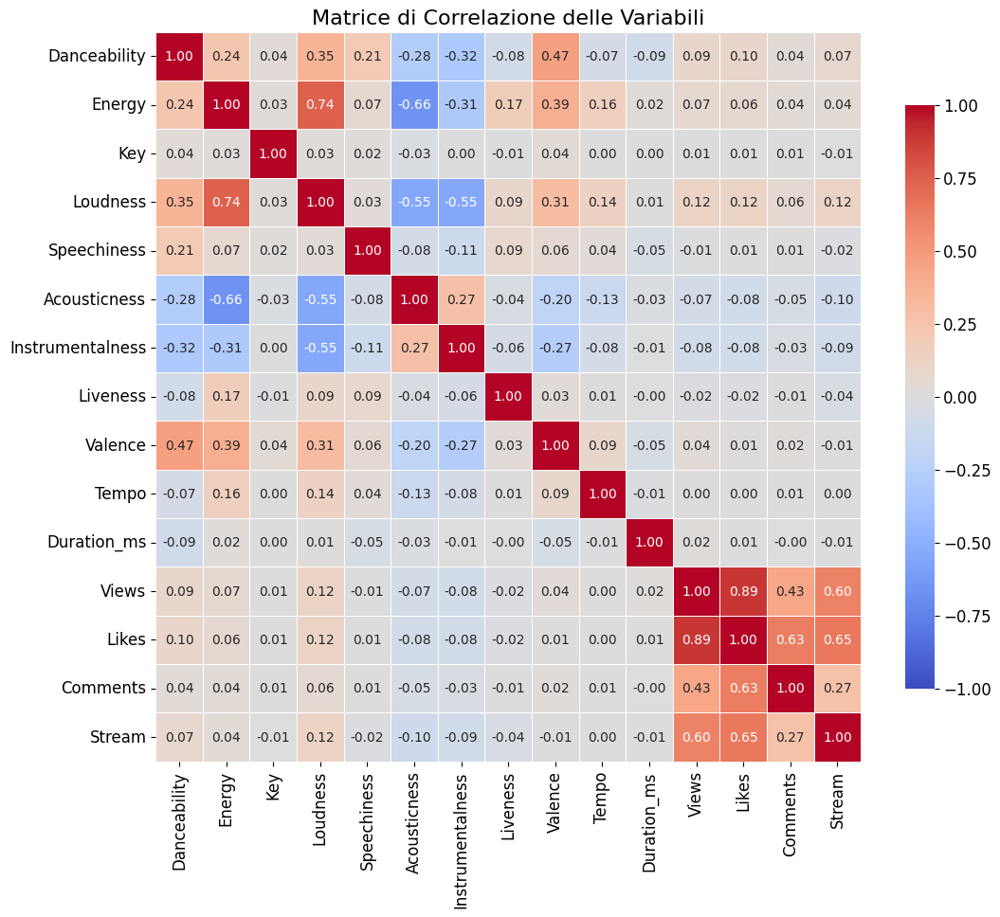

In [ ]:
numerical_features = ds_1.select_dtypes(include=[np.number]).columns
correlation_matrix = ds_1[numerical_features].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            vmin=-1, vmax=1,
            linewidths=0.5,
            cbar_kws={"shrink": .8})
plt.title('Matrice di Correlazione delle Variabili', fontsize=16)
plt.show()

La matrice di correlazione conferma le ipotesi avanzate infatti è possibile
segnalare la presenza di due valori elevati:
* 0.89 tra *Views* e *Likes*
* 0.74 tra *Energy* e *Loudness*

Si procede, a questo punto, in un'analisi più dettagliata delle relazioni che legano i valori associati alla popolarità di una canzone ossia *Views, Likes, Comments, Stream* in quanto dalla matrice di correlazione possiedono tutti dei valori più o meno alti.

<Figure size 1200x1000 with 0 Axes>

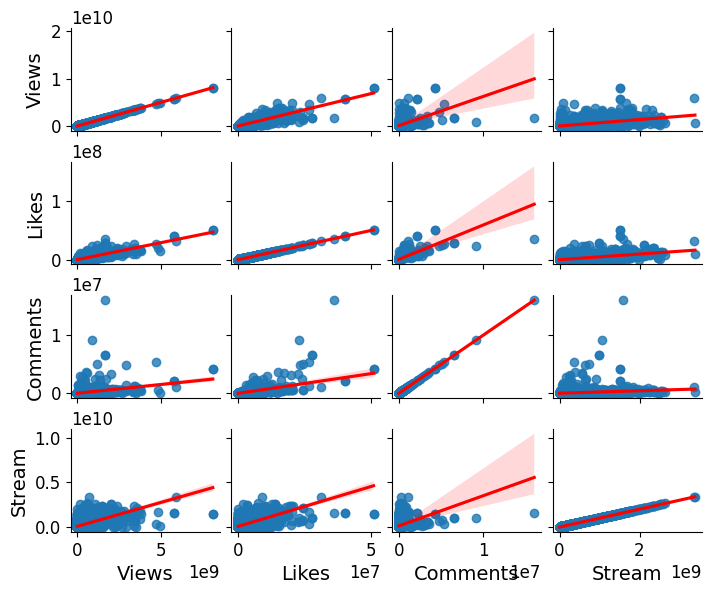

In [ ]:
plt.figure(figsize=(12, 10))
sns.pairplot(ds_1[['Views', 'Likes', 'Comments', 'Stream']], kind='reg', plot_kws={'line_kws':{'color':'red'}}, height=1.5, aspect=1.2, diag_kind=None)
plt.show()

Dai grafici si evince una correlazione quasi lineare tra Likes e Views.



Dando uno sguardo più ravvicinato, per comprendere al meglio il legame tra le variabili, si decide di effettuare una trasformaizone logaritmica. Si decide di applicare questo tipo di trasformazione in quanto, analizzando la distribuzione di questi valori, è apparsa evidente una forte asimmetria. Con una distribuzione di questo tipo si tenta di rendere più simmetrica la distribuzione in modo da cogliere al meglio le relazioni. Il grafico mostra con chiarezza il tipo di legame tra le due features.

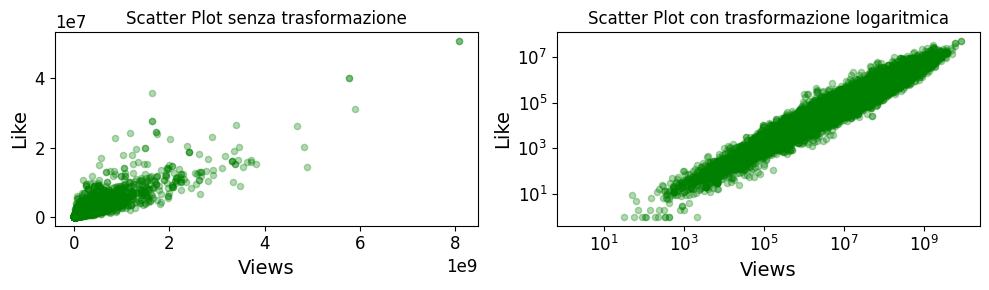

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 3))

ds_1.plot(kind="scatter", x="Views", y="Likes",alpha=0.3,color="green",ax=axs[0])
ds_1.plot(kind="scatter", x="Views", y="Likes",alpha=0.3,color="green",loglog=True,ax=axs[1])

axs[0].set_title("Scatter Plot senza trasformazione")
axs[1].set_title("Scatter Plot con trasformazione logaritmica")
axs[0].set_xlabel("Views")
axs[1].set_xlabel("Views")
axs[0].set_ylabel("Like")
axs[1].set_ylabel("Like")

plt.tight_layout()
plt.show()

Lo stesso tipo di rappresentazione viene proposta per le altre features rispetto alle quali si ipotizza correlazione lineare.


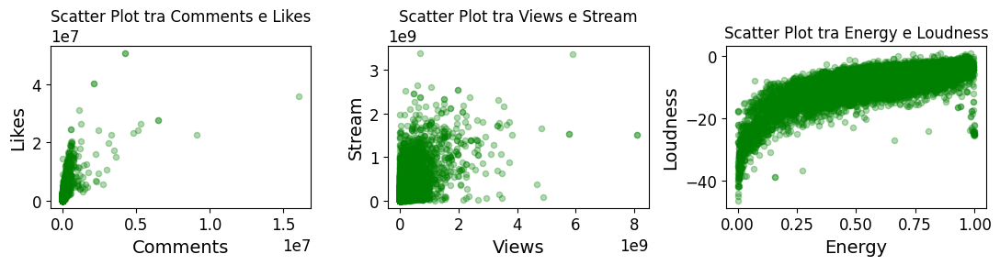

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(11,3))

ds_1.plot(kind="scatter", x="Comments", y="Likes",alpha=0.3,color="green",ax=axs[0])
ds_1.plot(kind="scatter", x="Views", y="Stream",alpha=0.3,color="green",ax=axs[1])
ds_1.plot(kind="scatter", x="Energy", y="Loudness",alpha=0.3,color="green",ax=axs[2])

axs[0].set_title("Scatter Plot tra Comments e Likes")
axs[1].set_title("Scatter Plot tra Views e Stream")
axs[2].set_title("Scatter Plot tra Energy e Loudness")
axs[0].set_xlabel("Comments")
axs[1].set_xlabel("Views")
axs[2].set_xlabel("Energy")
axs[0].set_ylabel("Likes")
axs[1].set_ylabel("Stream")
axs[2].set_ylabel("Loudness")

plt.tight_layout()
plt.show()


Tuttavia è importante sottolineare come il coefficiente di Pearson è in grado di identificare solamente l'esistenza di correlazione lineare reciproca fra gli attributi. Per individuare altre tipologie di correlazione è necessario ricorrere all'uso di funzioni ad hoc.


I grafici associati alle distribuzioni portavano ad ipotizzare presenza di valori outlier all'interno del dataset. Usiamo i box-plot per avere un idea più rapida di come si distribuiscono i valori.

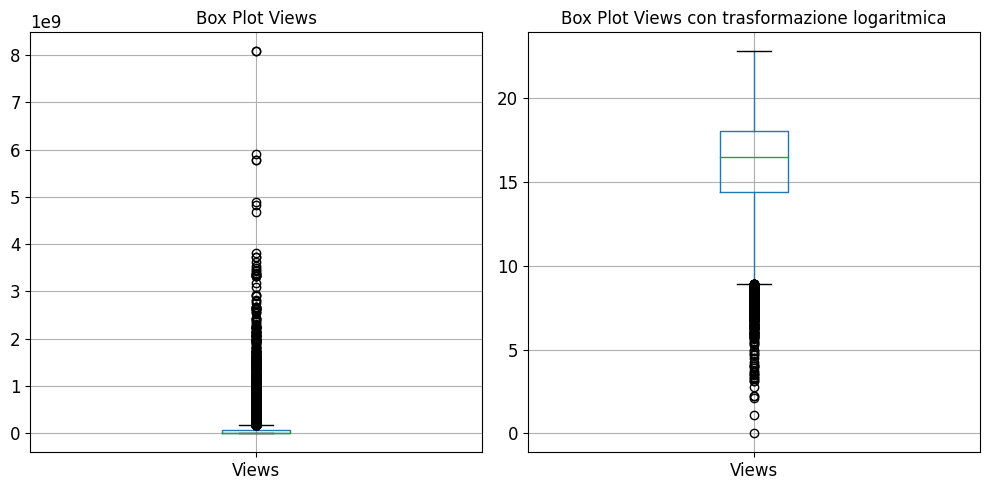

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
ds_1.boxplot(column=["Views"],ax=axs[0])
ds_1_log_prova = np.log1p(ds_1['Views'])
ds_1_log = pd.DataFrame(ds_1_log_prova)
ds_1_log.boxplot(ax=axs[1])

axs[0].set_title("Box Plot Views")
axs[1].set_title("Box Plot Views con trasformazione logaritmica")

plt.tight_layout()
plt.show()

Possiamo notare che in *Views* vi sia un istanza molto distante dalle altre, appararentemente potremmo pensare sia un anomalia, in realtà rappresenta la canzone "Despacito".

In [ ]:
from google.colab import files
from IPython.display import Image

In [ ]:
uploaded = files.upload()

Saving despacito.png to despacito.png


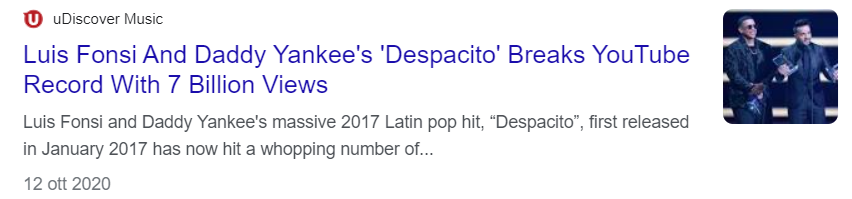

In [ ]:
Image('despacito.png',width=1000)

In [ ]:
ds_1[ds_1["Views"]==ds_1["Views"].max()]

,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream
1147,Luis Fonsi,Despacito,VIDA,album,0.655,0.797,2.0,-4.787,0.153,0.198,0.0,0.067,0.839,177.928,229360.0,8.079649e+09,50788652.0,4252791.0,True,1.506598e+09


Perchè non è  da considerare outliers la canzone "Despacito"? Essa è stata realmente una canzone oggetto di studio, questo perchè il successo raggiunto ha fatto si che la società *Youtube* aggiornasse la sua metodologia di calcolo per le visualizzazioni.

In passato, YouTube utilizzava un sistema di conteggio basato su un intero a 32 bit, il che significava che poteva contare fino a circa `2 miliardi`di visualizzazioni per video. Tuttavia, quando "Despacito" ha superato questo limite, YouTube ha dovuto aggiornare il sistema per utilizzare un conteggio a 64 bit, consentendo così di gestire numeri di visualizzazioni molto più elevati.

Altri due fenomeni simili sono i seguenti:

In [ ]:
ds_1[ds_1["Track"]=="Baby Shark"]

,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream
15137,Super Simple Songs,Baby Shark,Baby Shark & More Kids Songs,album,0.747,0.395,7.0,-11.447,0.0453,0.222,0.000000,0.0470,0.702,148.139,173627.0,3.726936e+08,662452.0,0.0,True,39581693.0
20308,CoComelon,Baby Shark,Nursery Rhymes by CoComelon,album,0.779,0.587,7.0,-8.131,0.0721,0.330,0.000004,0.0792,0.908,199.956,127203.0,2.645859e+09,6604353.0,0.0,True,22632716.0


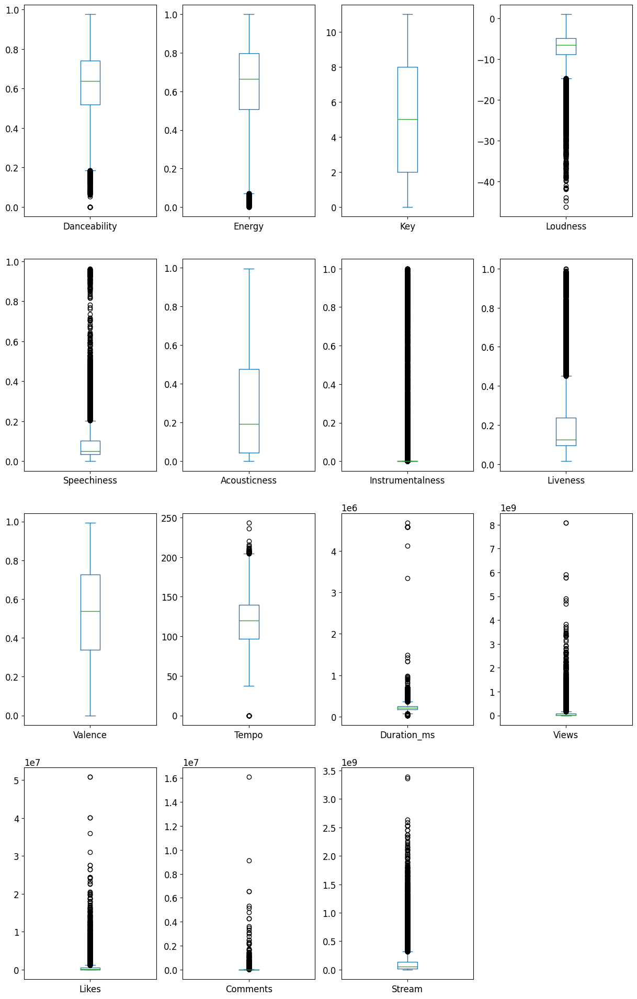

In [ ]:
ds_1[ds_1.select_dtypes(include=[np.number]).columns].plot(kind='box', subplots=True, layout=(16,4), figsize=(15, 100))
plt.show()

Dai box-plot, apparentemente, si evince in maniera significativa la presenza di outliers che potrebbero avere un impatto significativo sull'analisi dei dati e sulle prestazioni dei modelli che andremo ad utilizzare successivamente, ma questo è dovuto al fatto che le nostre distribuzioni possiedono delle code molto estese. Inoltre la semantica stessa degli attributi porta a comprendere che sia del tutto normale un risultato di questo tipo:
- gli attributi associati agli indici di popolarità di una canzone, nel caso di canzoni che hanno avuto particolare succeso, sicuramente risulteranno essere di rumore in quanto si discostano dal valore medio.
- le caratteristiche musicali associate a canzoni particolarmente lente sono più rare da riscontrare all'interno delle canzoni e per qeusto potrebbero risultare di disturbo. Tuttavia, comunque, restano importanti da considerare ai fini dell'analisi.

Soffermandoci sull'attributo *Key* notiamo che i valori assunti sono:

In [ ]:
ds_1["Key"].value_counts()

Key
0.0     2305
7.0     2252
1.0     2211
2.0     2021
9.0     1979
5.0     1731
11.0    1667
4.0     1515
8.0     1483
6.0     1443
10.0    1439
3.0      670
Name: count, dtype: int64

È possibile dunque stabilire che l'attributo *Key* è un attributo categorico, in quanto assume un valore compreso tra 0 ed 11, uno per ogni nota musicale della Pitch Class. Ci occuperemo in seguito di questo.

### 1.3 *Gestione Valori Mancanti*

Dall'analisi nella precedente sezione, abbiamo visto che le seguenti features possedevano dei valori mancanti:

* Danceability;
* Energy;
* Key;
* Loudness;
* Speechiness;
* Acousticness;
* Instrumentalness;
* Liveness;
* Valance;
* Tempo;
* Duration_ms;
* Views;
* Licensed;
* Likes;
* Comments;
* Stream;

Visto che possiediamo il nome degli artisti e l'album di appartenenza, per la sostituzione dei valori di:
* Danceability;
* Energy;
* Loudness;
* Speechiness;
* Acousticness;
* Instrumentalness;
* Liveness;
* Valance;
* Tempo;
* Duration_ms;
* Views;
* Likes;
* Comments;

si è pensato di utilizzare un transformer definito ad hoc, che vada a sostituire la media dei valori raggruppata per gli artisti.

Mentre per quanto riguarda i valori di *Licensed* si procede andando a rimuovere le istanze mancanti.

Mentre per i valori di *key* si va ad utilizzare la moda.

Come vedremo l'uso di un transformer ad hoc non sarà la soluzione adottata in quanto può fallire.

#### Solution 1: Custom Transformer

Per semplicità di interpretazione andiamo a visualizzare delle righe che possiedono istanze NaN.

In [ ]:
sample_incomplete_rows = ds_t[ds_t.isnull().any(axis=1)]
sample_incomplete_rows.head()

,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream
30,Metallica,Enter Sandman (Remastered),Metallica (Remastered),album,0.566,0.834,6.0,-8.412,0.0298,0.002770,0.008000,0.0625,0.621,123.296,331560.0,5.735537e+08,2828795.0,81335.0,True,NaN
31,Metallica,Nothing Else Matters (Remastered),Metallica (Remastered),album,0.547,0.394,4.0,-9.793,0.0262,0.052200,0.000006,0.0795,0.170,142.370,388733.0,1.209806e+09,5127599.0,135946.0,True,NaN
32,Metallica,Master of Puppets (Remastered),Master of Puppets (Remastered Deluxe Box Set),album,0.539,0.828,4.0,-9.108,0.0350,0.000670,0.421000,0.1540,0.562,105.250,515387.0,2.076291e+07,293409.0,1703.0,True,NaN
34,Metallica,The Unforgiven (Remastered),Metallica (Remastered),album,0.531,0.583,7.0,-9.470,0.0256,0.018400,0.006240,0.2550,0.207,139.503,387160.0,4.261257e+08,1781690.0,46392.0,False,NaN
35,Metallica,One (Remastered),...And Justice for All (Remastered Deluxe Box ...,album,0.438,0.687,7.0,-9.150,0.0619,0.000668,0.080100,0.4200,0.426,103.010,446146.0,5.240000e+02,18.0,1.0,False,NaN


Di seguito viene realizzato il transformer personalizzato.

In [ ]:
class FillNanValueWithMeanByGroup(BaseEstimator, TransformerMixin):

  def __init__(self, groupby_label, columns_to_fill_label):
        self.groupby_column = groupby_label
        self.columns_to_fill = columns_to_fill_label

  def fit(self, X, y=None):
    return self

  def transform(self, X):
    self.group_means = X.groupby(self.groupby_column)[self.columns_to_fill].mean()
    X_copy = X.copy()
    for column in self.columns_to_fill:
      X_copy[column] = X_copy.apply(
          lambda row: self.group_means.loc[row[self.groupby_column], column]
          if pd.isnull(row[column]) else row[column], axis=1
          )
    return X_copy

columns_to_fill = ["Danceability","Energy","Loudness","Speechiness","Acousticness","Instrumentalness","Liveness","Valence","Tempo","Duration_ms","Views","Likes","Comments","Stream"]
groupby_column = "Artist"

fillna_transformer = FillNanValueWithMeanByGroup(groupby_label=groupby_column, columns_to_fill_label=columns_to_fill)
ds_t_1 = fillna_transformer.transform(ds_t)
pd.DataFrame(ds_t_1.isnull().sum()/ds_t_1.shape[0]).T

,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000097,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.007674,0.007674,0.008157,0.022686,0.008061


Come possiamo notare dalle percentuali di valori mancanti, risultano ancora valori null. Questo è dovuto principalmente al fatto che, all'interno del dataset è presente un artista che possiede dei valori mancanti per tutte le istanze e, di conseguenza, l'idea di usare un transformer personalizzato non risulta adeguata.

Il numero totale di istanze mancanti è:

In [ ]:
sample_still_incomplete = ds_t_1[ds_t_1.isnull().any(axis=1)]
sample_still_incomplete.shape

(629, 20)

Di seguito viene mostrato la situazione che potrebbe far fallire l'uso di tale transformer:

In [ ]:
df_try_2 = ds_t.groupby("Artist").count()
df_t2_temp = df_try_2.reset_index()
df_t2_temp.rename(columns={'index': 'Indice'}, inplace=True)
df_try_2 = df_t2_temp.copy()
df_try_2[df_try_2["Artist"]=="ThxSoMch"]

,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream
1879,ThxSoMch,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,0


In quanto possiede tutti gli stream pari a NaN il Custom Transformer fallisce.

#### Pipeline automatizzata

In [ ]:
ds_numerical = ds_1.drop(columns=["Key","Artist",	"Track",	"Album",	"Album_type",	"Licensed"],inplace=False)

numerical_features = list(ds_numerical.select_dtypes(include=[np.number]).columns)
categorical_features = ['Key']

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean'))
])
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median'))
])
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ],
    remainder='passthrough'
)

df_processed = preprocessor.fit_transform(ds_1[numerical_features+categorical_features])

processed_features = numerical_features + categorical_features
new_column_names = processed_features

ds_4 = pd.DataFrame(data=df_processed, columns=new_column_names,index = list(ds_numerical.index.values))
ds_4.describe()

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Stream,Key
count,20718.000000,20718.000000,20718.000000,20718.000000,20718.000000,20718.000000,20718.000000,20718.000000,20718.00000,2.071800e+04,2.071800e+04,2.071800e+04,2.071800e+04,2.071800e+04,20718.000000
mean,0.619777,0.635250,-7.671680,0.096456,0.291535,0.055962,0.193521,0.529853,120.63834,2.247176e+05,9.393782e+07,6.633411e+05,2.751899e+04,1.359422e+08,5.300319
std,0.165264,0.214136,4.632525,0.111955,0.286285,0.193253,0.168523,0.245429,29.57759,1.247845e+05,2.715111e+08,1.765807e+06,1.905626e+05,2.407143e+08,3.576277
min,0.000000,0.000020,-46.251000,0.000000,0.000001,0.000000,0.014500,0.000000,0.00000,3.098500e+04,0.000000e+00,0.000000e+00,0.000000e+00,6.574000e+03,0.000000
25%,0.518250,0.507000,-8.858000,0.035700,0.045200,0.000000,0.094125,0.339000,97.00200,1.800100e+05,1.950563e+06,2.302175e+04,5.420000e+02,1.825666e+07,2.000000
50%,0.637000,0.666000,-6.536500,0.050500,0.193000,0.000002,0.125000,0.537000,119.96550,2.132910e+05,1.572401e+07,1.354555e+05,3.571500e+03,5.275420e+07,5.000000
75%,0.740000,0.798000,-4.931250,0.103000,0.477000,0.000463,0.237000,0.726000,139.93500,2.524422e+05,7.798379e+07,5.897498e+05,1.647000e+04,1.359422e+08,8.000000
max,0.975000,1.000000,0.920000,0.964000,0.996000,1.000000,1.000000,0.993000,243.37200,4.676058e+06,8.079649e+09,5.078865e+07,1.608314e+07,3.386520e+09,11.000000


Come possiamo notare, ad esclusione della features "`Licensed`", abbiamo tutti 20718 valori, uguale alla dimensione iniziale del dataset.

In [ ]:
ds_5 = ds_1.copy()
ds_5.update(ds_4[ds_4.columns])
ds_5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20718 entries, 0 to 20717
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20718 non-null  object 
 1   Track             20718 non-null  object 
 2   Album             20718 non-null  object 
 3   Album_type        20718 non-null  object 
 4   Danceability      20718 non-null  float64
 5   Energy            20718 non-null  float64
 6   Key               20718 non-null  float64
 7   Loudness          20718 non-null  float64
 8   Speechiness       20718 non-null  float64
 9   Acousticness      20718 non-null  float64
 10  Instrumentalness  20718 non-null  float64
 11  Liveness          20718 non-null  float64
 12  Valence           20718 non-null  float64
 13  Tempo             20718 non-null  float64
 14  Duration_ms       20718 non-null  float64
 15  Views             20718 non-null  float64
 16  Likes             20718 non-null  float6

Ci resta da risolvere il problema dei valori mancanti per l'attributo booleano `Licensed`. Poichè abbiamo un numero sufficiente di tuple, abbiamo deciso di rimuovere le istanze mancanti.

In [ ]:
ds_5.dropna(inplace=True)
ds_5.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20248 entries, 0 to 20717
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20248 non-null  object 
 1   Track             20248 non-null  object 
 2   Album             20248 non-null  object 
 3   Album_type        20248 non-null  object 
 4   Danceability      20248 non-null  float64
 5   Energy            20248 non-null  float64
 6   Key               20248 non-null  float64
 7   Loudness          20248 non-null  float64
 8   Speechiness       20248 non-null  float64
 9   Acousticness      20248 non-null  float64
 10  Instrumentalness  20248 non-null  float64
 11  Liveness          20248 non-null  float64
 12  Valence           20248 non-null  float64
 13  Tempo             20248 non-null  float64
 14  Duration_ms       20248 non-null  float64
 15  Views             20248 non-null  float64
 16  Likes             20248 non-null  float64
 17

Siamo pronti adesso per passare alla prossima sezione, ossia la gestione del dataset categorico *`Album_type`* e *`Key`*.

### 1.4 Gestione degli attibuti categorici

`Album_type` rappresenta un attributo che identifica se la canzone fa riferimento ad un:
* album;
* singolo;
* compilation.

Rappresenta chiaramente un attributo categorico dove per ogni categoria ci sono un numero di istanze totali pari a:

In [ ]:
ds_5["Album_type"].value_counts()

Album_type
album          14619
single          4860
compilation      769
Name: count, dtype: int64

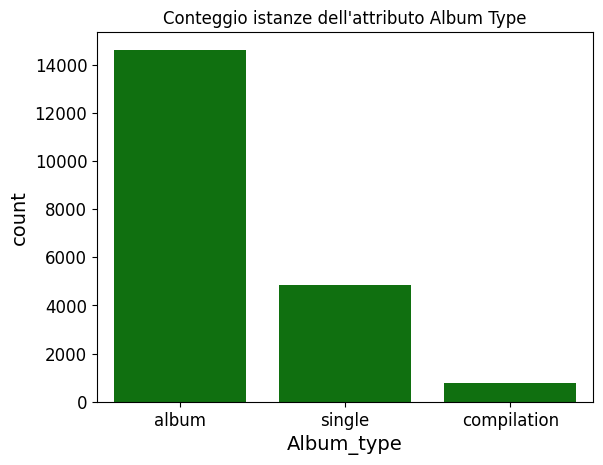

In [ ]:
df_t5_temp = ds_5["Album_type"].value_counts().reset_index()
df_t5_temp.rename(columns={'index': 'Album_type'}, inplace=True)
ds_6 = df_t5_temp.copy()

sns.barplot(data=ds_6,x="Album_type",y="count",color="green").set(title="Conteggio istanze dell'attributo Album Type")
plt.show()

**ALTRO GRAFICO DA AGGIUNGERE POTREBBE ESSERE LA DISTRIBUZIONE DELLE CANZONI PER GENERE**

Da notare che abbiamo una situazione sbilanciata, in quanto *compilation* possiede pochi valori rispetto alle altre due categorie.

Per quanto riguarda la gestione di tale attributo categorio, useremo il *`one-hot encoding`*, in quanto il numero possibili di valori è molto ristretto.


Non useremo l'*Ordinal Encoding* in quanto la problematica principale è che potrebbe considerare due valori simili, dovuto alla loro vicinanza, quando in realtà sono valori differenti.

In [ ]:
onehot_encoder = OneHotEncoder()
album_type_cat = ds_5[["Album_type"]]
album_type_cat_encoded = onehot_encoder.fit_transform(album_type_cat)
onehot_encoder.categories_

[array(['album', 'compilation', 'single'], dtype=object)]

In [ ]:
album_type_cat_encoded

<20248x3 sparse matrix of type '<class 'numpy.float64'>'
	with 20248 stored elements in Compressed Sparse Row format>

Notiamo che l'output è una *matrice sparsa SciPy*, anziché una matrice NumPy Usare tanta memoria principalmente per memorizzare zeri sarebbe molto dispendioso, quindi invece una matrice sparsa memorizza solo la posizione degli elementi diversi da zero.

In [ ]:
album_type_cat_encoded.toarray()

array([[1., 0., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       ...,
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.]])

In [ ]:
labels_type_album = {}
for i in range(len(onehot_encoder.categories_[0])):
  labels_type_album[i] = onehot_encoder.categories_[0][i]
ds_label_album_type = pd.DataFrame(album_type_cat_encoded.toarray())
ds_label_album_type.rename(columns=labels_type_album,inplace=True)
ds_label_album_type

,album,compilation,single
0,1.0,0.0,0.0
1,1.0,0.0,0.0
2,0.0,0.0,1.0
3,1.0,0.0,0.0
4,1.0,0.0,0.0
...,...,...,...
20243,0.0,0.0,1.0
20244,0.0,0.0,1.0
20245,0.0,0.0,1.0
20246,0.0,0.0,1.0


In [ ]:
ds_5.reset_index(inplace=True)
ds_5 = ds_5.drop(columns="index",inplace=False,axis=1)

In [ ]:
ds_6 = pd.concat([ds_5,ds_label_album_type],axis=1)
ds_6.head()

,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,...,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream,album,compilation,single
0,Gorillaz,Feel Good Inc.,Demon Days,album,0.818,0.705,6.0,-6.679,0.1770,0.008360,...,138.559,222640.0,693555221.0,6220896.0,169907.0,True,1.040235e+09,1.0,0.0,0.0
1,Gorillaz,Rhinestone Eyes,Plastic Beach,album,0.676,0.703,8.0,-5.815,0.0302,0.086900,...,92.761,200173.0,72011645.0,1079128.0,31003.0,True,3.100837e+08,1.0,0.0,0.0
2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,0.695,0.923,1.0,-3.930,0.0522,0.042500,...,108.014,215150.0,8435055.0,282142.0,7399.0,True,6.306347e+07,0.0,0.0,1.0
3,Gorillaz,On Melancholy Hill,Plastic Beach,album,0.689,0.739,2.0,-5.810,0.0260,0.000015,...,120.423,233867.0,211754952.0,1788577.0,55229.0,True,4.346636e+08,1.0,0.0,0.0
4,Gorillaz,Clint Eastwood,Gorillaz,album,0.663,0.694,10.0,-8.627,0.1710,0.025300,...,167.953,340920.0,618480958.0,6197318.0,155930.0,True,6.172597e+08,1.0,0.0,0.0


In [ ]:
ds_7 = ds_6.copy()
ds_7.drop(columns="Album_type",inplace=True)
ds_7.rename(columns={"album":"AlbumC","compilation":"CompilationC","single":"SingleC"},inplace=True)
ds_7.head()

,Artist,Track,Album,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,...,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream,AlbumC,CompilationC,SingleC
0,Gorillaz,Feel Good Inc.,Demon Days,0.818,0.705,6.0,-6.679,0.1770,0.008360,0.002330,...,138.559,222640.0,693555221.0,6220896.0,169907.0,True,1.040235e+09,1.0,0.0,0.0
1,Gorillaz,Rhinestone Eyes,Plastic Beach,0.676,0.703,8.0,-5.815,0.0302,0.086900,0.000687,...,92.761,200173.0,72011645.0,1079128.0,31003.0,True,3.100837e+08,1.0,0.0,0.0
2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),0.695,0.923,1.0,-3.930,0.0522,0.042500,0.046900,...,108.014,215150.0,8435055.0,282142.0,7399.0,True,6.306347e+07,0.0,0.0,1.0
3,Gorillaz,On Melancholy Hill,Plastic Beach,0.689,0.739,2.0,-5.810,0.0260,0.000015,0.509000,...,120.423,233867.0,211754952.0,1788577.0,55229.0,True,4.346636e+08,1.0,0.0,0.0
4,Gorillaz,Clint Eastwood,Gorillaz,0.663,0.694,10.0,-8.627,0.1710,0.025300,0.000000,...,167.953,340920.0,618480958.0,6197318.0,155930.0,True,6.172597e+08,1.0,0.0,0.0


Rimane adesso l'attributo *Key*, che nelle analisi successive non viene utilizzato, ed è per questo che viene eliminato senza essere gestito.

In [ ]:
ds_7.drop(columns="Key",inplace=True)

Una cosa che possiamo notare è che *Tempo* possiede delle istanze con valori pari a 0 a abbiamo deciso di eliminarle.

In [ ]:
ds_7 = ds_7[ds_7['Tempo'] != 0]
ds_7.reset_index(inplace=True)
ds_7.drop(columns=["index"],inplace=True)

<ipython-input-61-c80258e9645d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ds_7.drop(columns=["index"],inplace=True)


### >

In [ ]:
ds_7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20231 entries, 0 to 20230
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20231 non-null  object 
 1   Track             20231 non-null  object 
 2   Album             20231 non-null  object 
 3   Danceability      20231 non-null  float64
 4   Energy            20231 non-null  float64
 5   Loudness          20231 non-null  float64
 6   Speechiness       20231 non-null  float64
 7   Acousticness      20231 non-null  float64
 8   Instrumentalness  20231 non-null  float64
 9   Liveness          20231 non-null  float64
 10  Valence           20231 non-null  float64
 11  Tempo             20231 non-null  float64
 12  Duration_ms       20231 non-null  float64
 13  Views             20231 non-null  float64
 14  Likes             20231 non-null  float64
 15  Comments          20231 non-null  float64
 16  Licensed          20231 non-null  object

In [ ]:
ds_7.describe()

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Stream,AlbumC,CompilationC,SingleC
count,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,20231.000000,20231.000000,20231.000000
mean,0.620725,0.635388,-7.653818,0.096148,0.288844,0.055336,0.191443,0.529750,120.705482,2.249555e+05,9.400663e+07,6.638588e+05,2.753992e+04,1.368912e+08,0.721862,0.037962,0.240176
std,0.164346,0.213340,4.598290,0.110208,0.285800,0.191705,0.165339,0.245271,29.386578,1.255742e+05,2.747473e+08,1.786842e+06,1.928412e+05,2.425447e+08,0.448093,0.191108,0.427201
min,0.053200,0.000020,-46.251000,0.022000,0.000001,0.000000,0.014500,0.000000,37.114000,3.098500e+04,0.000000e+00,0.000000e+00,0.000000e+00,6.574000e+03,0.000000,0.000000,0.000000
25%,0.519000,0.508000,-8.824000,0.035700,0.043750,0.000000,0.094000,0.339000,97.008500,1.803700e+05,1.836305e+06,2.183200e+04,5.160000e+02,1.836076e+07,0.000000,0.000000,0.000000
50%,0.638000,0.666000,-6.537000,0.050500,0.190000,0.000002,0.125000,0.537000,119.966000,2.134280e+05,1.452832e+07,1.263780e+05,3.335000e+03,5.282679e+07,1.000000,0.000000,0.000000
75%,0.741000,0.797000,-4.939000,0.103000,0.471000,0.000476,0.234000,0.726000,139.931500,2.524335e+05,7.045222e+07,5.307870e+05,1.466500e+04,1.359422e+08,1.000000,0.000000,0.000000
max,0.975000,1.000000,0.920000,0.964000,0.996000,0.995000,1.000000,0.993000,243.372000,4.676058e+06,8.079649e+09,5.078865e+07,1.608314e+07,3.386520e+09,1.000000,1.000000,1.000000


In [ ]:
ds_cla = ds_7.copy()
ds_regre = ds_7.copy()
ds_9 = ds_7.copy()
ds_10 = ds_7.copy()

### Prima Opzione: Features con trasformazioni differenti

In [ ]:
ds_7['Speechiness'] = np.log1p(ds_7['Speechiness'])
ds_7['Acousticness'] = np.log1p(ds_7['Acousticness'])
ds_7['Instrumentalness'] = np.log1p(ds_7['Instrumentalness'])
ds_7['Liveness'] = np.log1p(ds_7['Liveness'])

ds_7['Loudness'] = np.log1p(ds_7['Loudness'] - ds_7['Loudness'].min())

scaler = StandardScaler()
ds_7["Loudness"] = scaler.fit_transform(ds_7[["Loudness"]])

Motivazioni sul perchè di tale trasformazioni:

* Trasformazione Logaritmica: per rendere il più possibile la distribuzione dei dati simmetrica;
* Standardizzazione: per rendendere l'attributo adimensionale.

In [ ]:
ds_7.describe()

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Stream,AlbumC,CompilationC,SingleC
count,20231.000000,20231.000000,20231.000000,2.023100e+04,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,20231.000000,20231.000000,20231.000000
mean,0.779694,0.635388,5.303495,-3.821217e-16,0.087542,0.231184,0.042155,0.167020,0.702948,120.705482,2.249555e+05,9.400663e+07,6.638588e+05,2.753992e+04,1.368912e+08,0.721862,0.037962,0.240176
std,0.113151,0.213340,3.577726,1.000025e+00,0.088700,0.208092,0.140426,0.122665,0.188723,29.386578,1.255742e+05,2.747473e+08,1.786842e+06,1.928412e+05,2.425447e+08,0.448093,0.191108,0.427201
min,0.230651,0.000020,0.000000,-2.347890e+01,0.021761,0.000001,0.000000,0.014396,0.000000,37.114000,3.098500e+04,0.000000e+00,0.000000e+00,0.000000e+00,6.574000e+03,0.000000,0.000000,0.000000
25%,0.720417,0.508000,2.000000,-1.299349e-01,0.035078,0.042820,0.000000,0.089841,0.582237,97.008500,1.803700e+05,1.836305e+06,2.183200e+04,5.160000e+02,1.836076e+07,0.000000,0.000000,0.000000
50%,0.798749,0.666000,5.000000,2.400107e-01,0.049266,0.173953,0.000002,0.117783,0.732803,119.966000,2.134280e+05,1.452832e+07,1.263780e+05,3.335000e+03,5.282679e+07,1.000000,0.000000,0.000000
75%,0.860814,0.797000,8.000000,4.863699e-01,0.098034,0.385942,0.000475,0.210261,0.852056,139.931500,2.524335e+05,7.045222e+07,5.307870e+05,1.466500e+04,1.359422e+08,1.000000,0.000000,0.000000
max,0.987421,1.000000,11.000000,1.316253e+00,0.674983,0.691145,0.690644,0.693147,0.996494,243.372000,4.676058e+06,8.079649e+09,5.078865e+07,1.608314e+07,3.386520e+09,1.000000,1.000000,1.000000


In [ ]:
#ds_7.drop(columns="level_0",inplace=True)
ds_7.head()

,Artist,Track,Album,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,...,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream,AlbumC,CompilationC,SingleC
0,Gorillaz,Feel Good Inc.,Demon Days,0.904434,0.705,6.0,0.217653,0.162969,0.008325,0.002327,...,138.559,222640.0,693555221.0,6220896.0,169907.0,True,1.040235e+09,1.0,0.0,0.0
1,Gorillaz,Rhinestone Eyes,Plastic Beach,0.822192,0.703,8.0,0.352495,0.029753,0.083330,0.000687,...,92.761,200173.0,72011645.0,1079128.0,31003.0,True,3.100837e+08,1.0,0.0,0.0
2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),0.833667,0.923,1.0,0.637177,0.050883,0.041622,0.045833,...,108.014,215150.0,8435055.0,282142.0,7399.0,True,6.306347e+07,0.0,0.0,1.0
3,Gorillaz,On Melancholy Hill,Plastic Beach,0.830060,0.739,2.0,0.353267,0.025668,0.000015,0.411447,...,120.423,233867.0,211754952.0,1788577.0,55229.0,True,4.346636e+08,1.0,0.0,0.0
4,Gorillaz,Clint Eastwood,Gorillaz,0.814248,0.694,10.0,-0.097213,0.157858,0.024985,0.000000,...,167.953,340920.0,618480958.0,6197318.0,155930.0,True,6.172597e+08,1.0,0.0,0.0


#### 2 Clustering



L'obiettivo è quello di usare il Clustering per identificare i vari generi musicali delle canzoni presenti nel dataset. Si è pensato di usare il clustering in quanto ci fornisce delle tecniche per raggruppare in diversi gruppi, istanze che sono simili tra loro. In questo modo è molto più smeplice andare ad individuare il genere musicale di una canzone.

Per prima cosa visualizziamo il dataset, che però, essendo a n dimensioni dobbiamo applicare una riduzione di dimensionalità.

##### 2.0 Inizializzazione Dataset

In [ ]:
ds_8 = ds_7.copy()
ds_8.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20231 entries, 0 to 20230
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20231 non-null  object 
 1   Track             20231 non-null  object 
 2   Album             20231 non-null  object 
 3   Danceability      20231 non-null  float64
 4   Energy            20231 non-null  float64
 5   Key               20231 non-null  float64
 6   Loudness          20231 non-null  float64
 7   Speechiness       20231 non-null  float64
 8   Acousticness      20231 non-null  float64
 9   Instrumentalness  20231 non-null  float64
 10  Liveness          20231 non-null  float64
 11  Valence           20231 non-null  float64
 12  Tempo             20231 non-null  float64
 13  Duration_ms       20231 non-null  float64
 14  Views             20231 non-null  float64
 15  Likes             20231 non-null  float64
 16  Comments          20231 non-null  float6

Al fine di individuare i diversi generi musicali, riteniamo utili l'uso solo delle seguenti features:
* Danceability;
* Loudness;
* Speechiness;
*	Acousticness;
*	Instrumentalness;
*	Liveness;
* Valence;
* Tempo.

Andiamo quindi a rimuovere le features ritenute non idonee ai fini della ricerca del genere musicale.

Ragioni sul perchè sono state rimosse le seguenti features:

* Key: andava ad inserire, in qualche modo, un raggruppamento basato sulla diverta nota musicale usata dalla canzone, questo comporta che due canzoni magari con diverso genere musicale potrebbero essere etichettate dello stesso genere, situazione da evitare.
* Gli attributi categorici *"AlbumC", "CompilationC", "SingleC"*, in quanto non dipendono dal genere musicale;
* *Views*, *Comments*, *Stream* e *Licensed*, tutte informazioni ritenute non utili per l'individuazione del genere musicale.
* *Energy*: ritenuta ridondante, oltre ad essere in stretta correlazione con *loudness*, è stata rimossa in quanto l'informazione prodotta da energy potrebbe essere derivata da altre features, quali: loudness, instrumentalness, tempo ecc;
* *"Artist","Track","Album"*: perchè l'obiettivo è individuare il genere musicale della canzone e non dell'artista;
* *Licensed*: non ritenuta utile per l'individuazione del genere musicale.



L'attributo *Tempo* non è stato soggetto ad alcuna trasformazione, in quanto riteniamo utile dare maggiore peso ai BPM della canzone.

In [ ]:
ds_clu = ds_8.drop(columns=["Artist","Track","Album","Views","Likes","Comments","Licensed","Stream","Key", "AlbumC", "CompilationC", "SingleC", "Duration_ms","Energy"],inplace=False)
ds_clu.describe()

,Danceability,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo
count,20231.000000,2.023100e+04,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000
mean,0.779694,-3.821217e-16,0.087542,0.231184,0.042155,0.167020,0.702948,120.705482
std,0.113151,1.000025e+00,0.088700,0.208092,0.140426,0.122665,0.188723,29.386578
min,0.230651,-2.347890e+01,0.021761,0.000001,0.000000,0.014396,0.000000,37.114000
25%,0.720417,-1.299349e-01,0.035078,0.042820,0.000000,0.089841,0.582237,97.008500
50%,0.798749,2.400107e-01,0.049266,0.173953,0.000002,0.117783,0.732803,119.966000
75%,0.860814,4.863699e-01,0.098034,0.385942,0.000475,0.210261,0.852056,139.931500
max,0.987421,1.316253e+00,0.674983,0.691145,0.690644,0.693147,0.996494,243.372000


##### 2.1 Visualizzazione

Il nostro dataset ai fini del clustering, si costituisce di 8 features per ogni istanza, quest'ultime saranno quindi rappresentate da un punto in uno spazio multidimensionale.

Per rappresentare la distribuzione, utilizzeremo tecniche di riduzione della dimensionalità, tra cui PCA, UMAP e TSNE. Verranno fornite tutte le rappresentazioni in quanto esse variano dalla tecnica utilizzata.

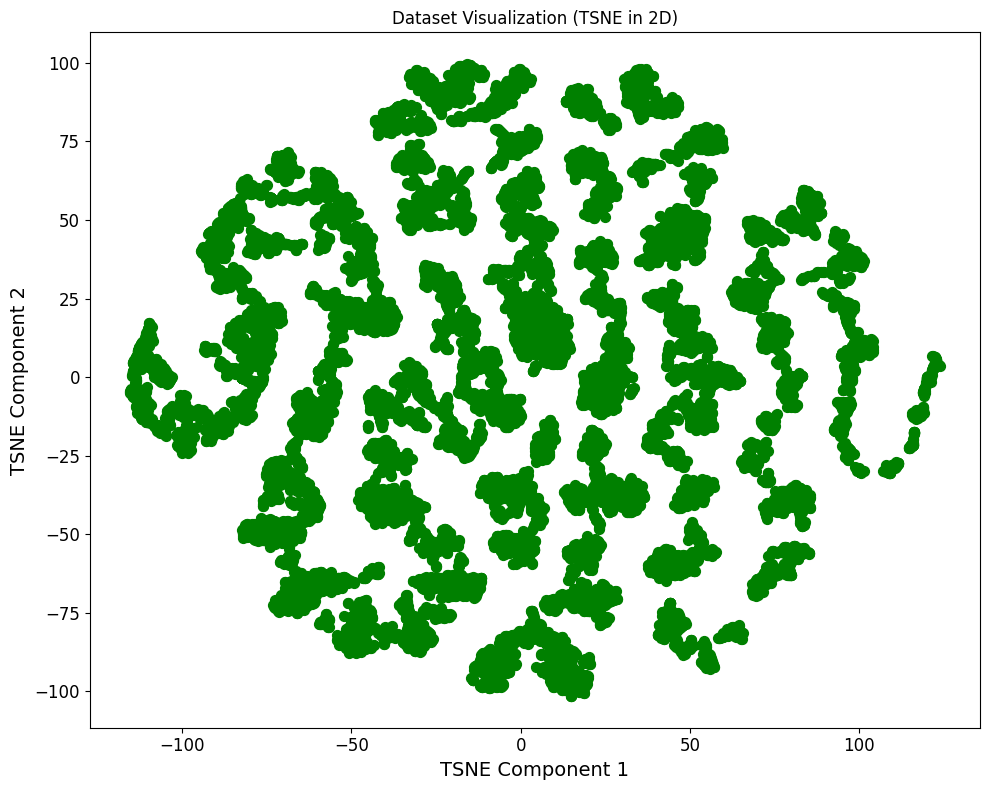

In [ ]:
plot_dataset_tsne(ds_clu,plot_dim=2)

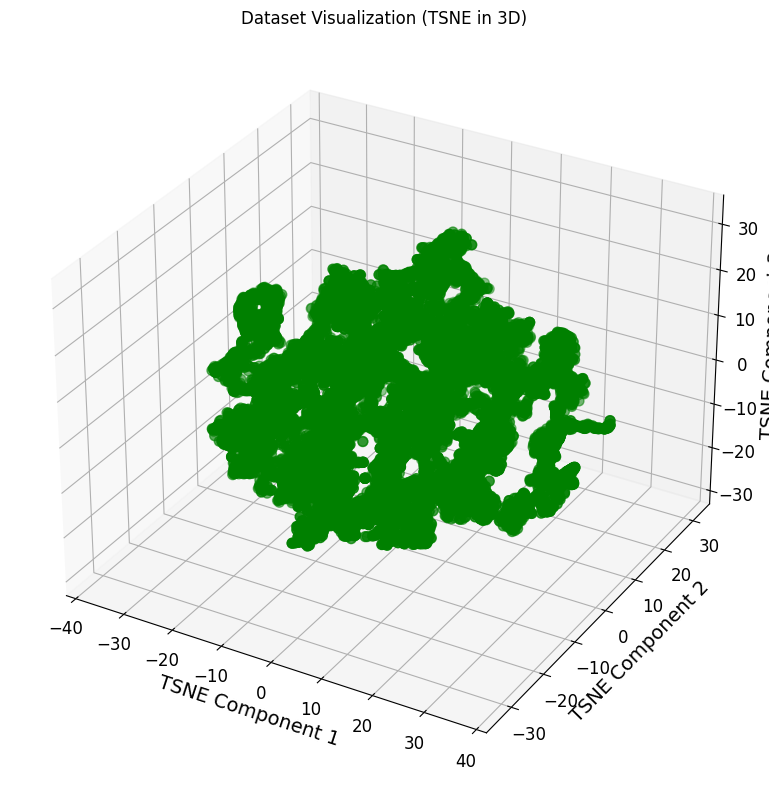

In [ ]:
plot_dataset_tsne(ds_clu,plot_dim=3)

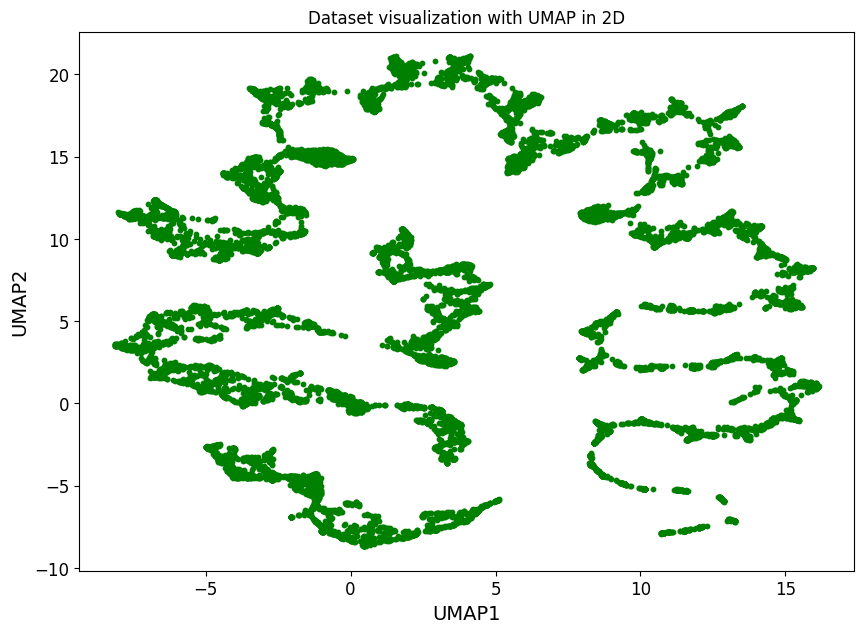

In [ ]:
plot_umap_data_2d(ds_clu)

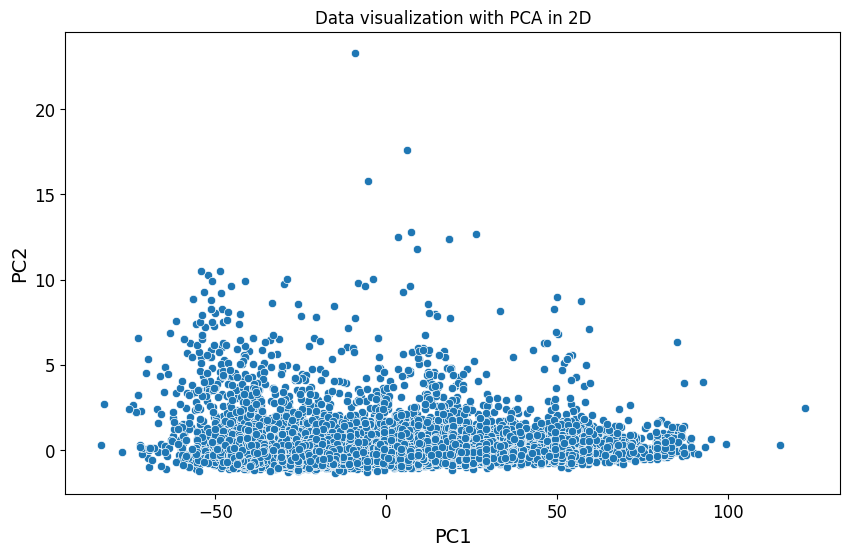

In [ ]:
plot_pca_k_components(ds_clu,k_component=2)

A seconda del frame utilizzato varia la rappresentazione, questo perchè:

* *PCA* (Principal Component Analisys): Si concentra sulla riduzione della dimensionalità preservando la massima varianza nei dati. È una tecnica che funziona meglio con dati che sono linearmente separabili;
* *UMAP*: Gestice efficacemente sia relazioni lineari che non lineari. Mira a creare una rappresentazione a bassa dimensionalità che preserva la struttura globale dei dati, concentrandosi in particolare sulle relazioni tra i punti di dati;
* `t-NSE`: Simile a UMAP, t-SNE punta a visualizzare dati ad alta dimensionalità preservando le similarità locali tra i punti di dati.

Notiamo da tutti i grafici una cosa chiara, i punti sono moldo addensati in determinati punti.


Il primo algoritmo che lanciamo è il *DBSCAN*.

Per confrontare le diverse tecniche di clustering si è fatto riferimento al **coefficente di Silhouettes**:

$\begin{equation}
Silhouettes(i) = \dfrac{b(i) - a(i)}{\max\{a(i), b(i)\}}
\end{equation}$

Dove:

* `a(i)` è la distanza media tra il punto i e tutti gli altri punti nel suo cluster attuale;
* `b(i)` è la minima distanza media tra il punto i e tutti i punti in un cluster diverso

Usiamo il coefficiente di Silhouettes e non solo l'**Inertia**, definita come la somma dei quadrati delle distanze intra-cluster. Poichè essa possiede un gran difetto, ossia che all'aumentare del numero di cluster l'intertia diminuisce.

##### 2.2 DBSCAN


Quello che si può intendere dalle rappresentazioni precedenti è chiaro, i punti sono molto addensati, andiamo a verificare quanti cluster vengono individiduati dal DBSCAN al variare dei suoi parametri principali. Ma il risultato che ci aspettiamo è molto intuitivo, otteremo un valore non buono.

In [ ]:
eps_values = np.arange(0.3, 1.5, 0.1)
clusters_per_eps = []
for eps in eps_values:
    dbscan = DBSCAN(eps=eps)
    dbscan.fit(ds_clu)

    cluster_labels = dbscan.labels_
    num_clusters = len(np.unique(cluster_labels))
    clusters_per_eps.append(num_clusters)

print("Number of Cluster for each value of epsilon:")
print("_"*45)
for i, eps in enumerate(eps_values):
    print(f"Epsilon: {eps:.2f} - Number of Cluster: {clusters_per_eps[i]}")

Number of Cluster for each value of epsilon:
_____________________________________________
Epsilon: 0.30 - Number of Cluster: 186
Epsilon: 0.40 - Number of Cluster: 69
Epsilon: 0.50 - Number of Cluster: 33
Epsilon: 0.60 - Number of Cluster: 31
Epsilon: 0.70 - Number of Cluster: 30
Epsilon: 0.80 - Number of Cluster: 24
Epsilon: 0.90 - Number of Cluster: 17
Epsilon: 1.00 - Number of Cluster: 21
Epsilon: 1.10 - Number of Cluster: 15
Epsilon: 1.20 - Number of Cluster: 10
Epsilon: 1.30 - Number of Cluster: 10
Epsilon: 1.40 - Number of Cluster: 8


Avendo un dataset molto denso, è normale aspettarsi che all'aumentare di ϵ il numero dei Cluster tende a diminuire, infatti si passa da un numero di 186 *cluster* a soli 8 considerando un valore di ϵ piuttosto elevato. Andiamo a ripetere la stessa esecuzione con il secondo parametro del DBSCAN, *min_points*:

In [ ]:
min_samples = np.arange(5,500, 50)
clusters_per_min_points = []
for min_points in min_samples:
    dbscan = DBSCAN(min_samples=min_points)
    dbscan.fit(ds_clu)

    cluster_labels = dbscan.labels_
    num_clusters = len(np.unique(cluster_labels))

    clusters_per_min_points.append(num_clusters)

print("Number of Cluster for each value of min_points:")
print("_"*45)
for i, min_points in enumerate(min_samples):
    print(f"Min_Points: {min_points} - Number of Cluster: {clusters_per_min_points[i]}")

Number of Cluster for each value of min_points:
_____________________________________________
Min_Points: 5 - Number of Cluster: 33
Min_Points: 55 - Number of Cluster: 51
Min_Points: 105 - Number of Cluster: 34
Min_Points: 155 - Number of Cluster: 20
Min_Points: 205 - Number of Cluster: 10
Min_Points: 255 - Number of Cluster: 6
Min_Points: 305 - Number of Cluster: 2
Min_Points: 355 - Number of Cluster: 2
Min_Points: 405 - Number of Cluster: 1
Min_Points: 455 - Number of Cluster: 1


Come volevosi dimostrare, otteniamo lo stesso risultato di prima, ossia il numero di Cluster tende a diminuire con l'aumentare dei punti.

Per poter scegliere correttamente i valori degli iper-parametri del DBSCAN, usiamo una *GridSearch* costruita appositamente, quello che ci aspetteremo sarà un basso numero di cluster con un alto valore di ϵ.

In [ ]:
best_eps, best_min_samples, best_score, num_clust = dbscan_grid_search(ds_clu,[0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 1.1],[3, 5, 10, 20, 30, 50,100,200,300])

Iteration (eps: 0.3, min_samples: 3) - n_clusters: 398, score: -0.3657672657625799
Iteration (eps: 0.3, min_samples: 5) - n_clusters: 185, score: -0.2523932715460249
Iteration (eps: 0.3, min_samples: 10) - n_clusters: 112, score: -0.17516136758266865
Iteration (eps: 0.3, min_samples: 20) - n_clusters: 66, score: -0.309799622540352
Iteration (eps: 0.3, min_samples: 30) - n_clusters: 46, score: -0.4127377016569855
Iteration (eps: 0.3, min_samples: 50) - n_clusters: 24, score: -0.5202745139192045
Iteration (eps: 0.3, min_samples: 100) - n_clusters: 7, score: -0.6031427699538104
Skipping iteration (eps: 0.3, min_samples: 200) - too few clusters (0)
Skipping iteration (eps: 0.3, min_samples: 300) - too few clusters (0)
Iteration (eps: 0.4, min_samples: 3) - n_clusters: 174, score: -0.7337674827973601
Iteration (eps: 0.4, min_samples: 5) - n_clusters: 68, score: -0.5941120201036623
Iteration (eps: 0.4, min_samples: 10) - n_clusters: 63, score: -0.2514643937967076
Iteration (eps: 0.4, min_sam

In [ ]:
print(f"Best parameters: eps={best_eps}, min_samples={best_min_samples}")
print(f"Best score: {best_score}")
print(f"Number of clusters: {num_clust}")

Best parameters: eps=1.1, min_samples=100
Best score: 0.35749388942676585
Number of clusters: 2


Come avevamo assunto in precedenza, andando ad aumentare il raggio ϵ, otteniamo un numero di cluster relativamente basso e con un valore di score vicino allo zero.

 Per completezza andiamo a stampare graficamente la situazione migliore per vedere come sono disposti i nostri punti:

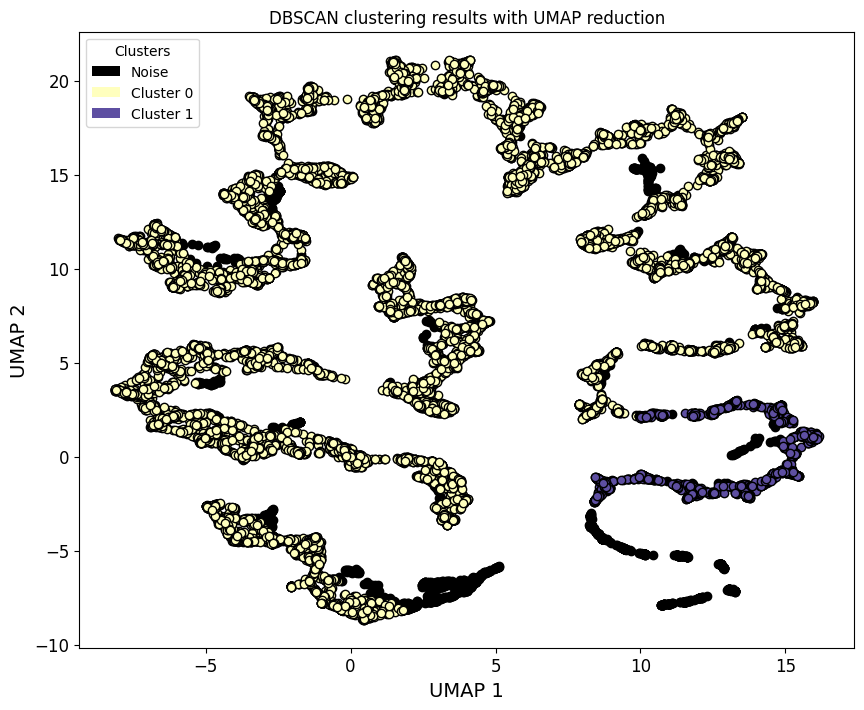

In [ ]:
dbscan = DBSCAN(eps=best_eps,min_samples=best_min_samples)
labels = dbscan.fit_predict(ds_clu)
plot_dbscan_with_umap(ds_clu, labels)

Come detto più volte, notiamo la presenza di 2 cluster con un numero di istanze pari a:

In [ ]:
unique_clusters, counts = np.unique(labels, return_counts=True)
for cluster, count in zip(unique_clusters, counts):
    print(f"Cluster {cluster}: {count} tuple")

Cluster -1: 1519 tuple
Cluster 0: 17117 tuple
Cluster 1: 1595 tuple


A questo punto, prima di poter trarre conclusioni affrettate, passiamo ad un altro famoso algoritmo di clustering, ossia il K-means.

##### 2.3 K-MEANS

Inizializziamo tanti modelli, uno per un valore di cluster crescente, e ne calcoliamo l'inerzia.

In [ ]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=42,n_init=33).fit(ds_clu)
                for k in range(1, 21)]
inertias = [model.inertia_ for model in kmeans_per_k]

In [ ]:
inertias

[17492989.96893368,
 5967484.398441998,
 2597867.4027719004,
 1645381.2716822121,
 1068021.9766321261,
 815613.665902023,
 605474.2529674526,
 477187.01190880145,
 390178.16219974076,
 329992.5181303064,
 277738.0747662944,
 237812.75169669557,
 207276.18732450745,
 180273.37376247617,
 161659.06651042335,
 144735.66607471195,
 131882.03691412503,
 120008.84842213467,
 110442.11993059718,
 100729.9998752166]

Utilizzeremo il metodo del gomito per trovare il numero ottimale di cluster mediante l'inertia.

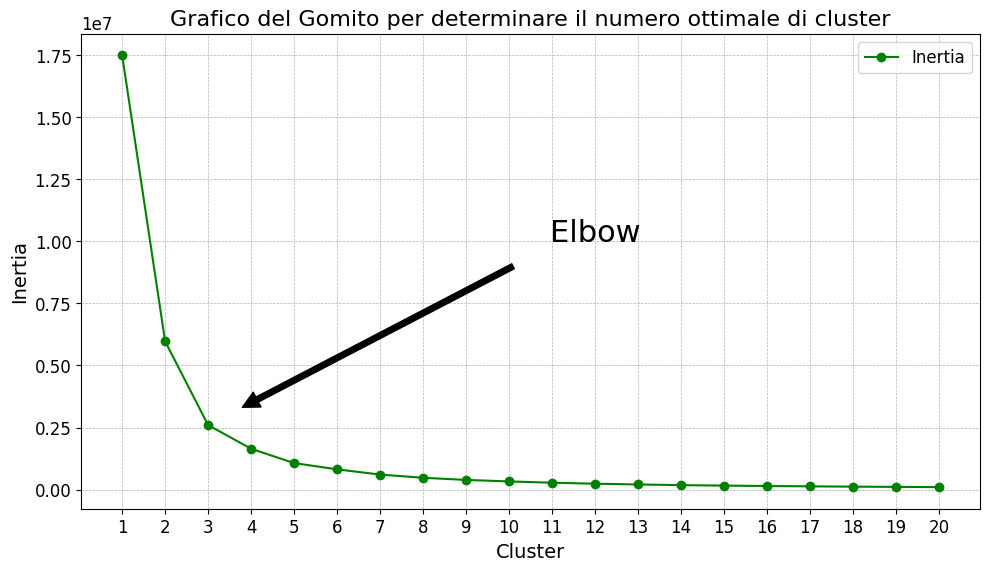

In [ ]:
plot_elbow_graph(21,inertias,type_graph="I")

Seguendo l'inerzia il numero ideale di cluster è pari a 3. Andiamo però a valutare a questo punto il silhouettes score di ogni modello.

In [ ]:
silhouette_scores = [silhouette_score(ds_clu, model.labels_)
                     for model in kmeans_per_k[1:]]

In [ ]:
silhouette_scores

[0.5594525774562744,
 0.5856679338296165,
 0.542405496768975,
 0.5432118811154668,
 0.5381895715514969,
 0.5362896648815895,
 0.5377191893458476,
 0.5231660436204467,
 0.5213934520691926,
 0.5171544508675301,
 0.5104174492637379,
 0.5106045794200403,
 0.5047353200045666,
 0.5000556612160861,
 0.49256924996331364,
 0.49205235073790843,
 0.4887324418227108,
 0.4869647359337804,
 0.49169543642764885]

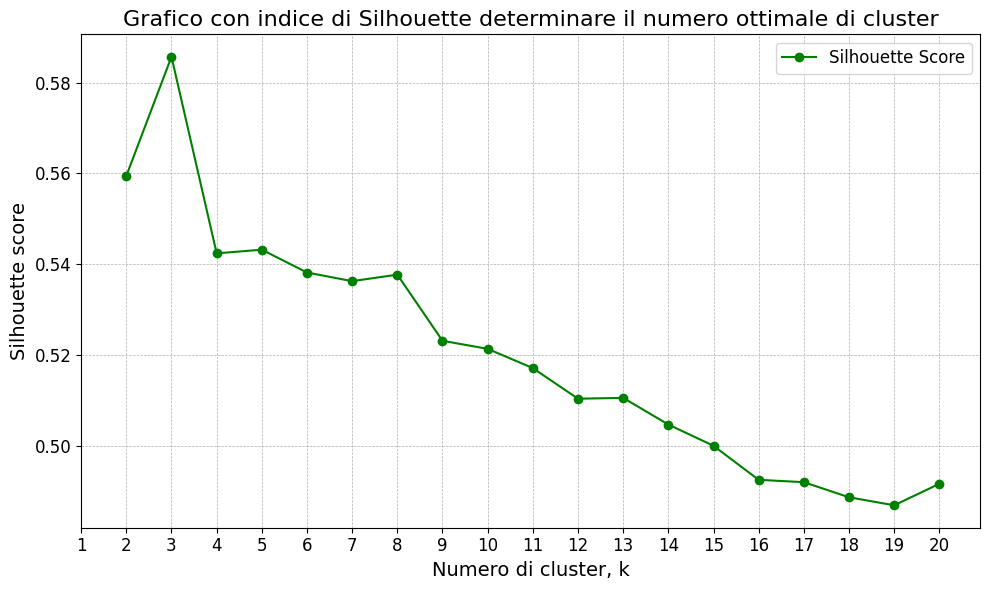

In [ ]:
plot_elbow_graph(21,silhouette_scores,"S")

Come si può notare in questa visualizzazione, l'informazione data è molto più ricca della precedente: in particolare, abbiamo indicazioni su k=3 che rappresenta un'ottima scelta, ma inoltre sottolinea il fatto che anche k=5 e 8 sono abbastanza buone e sicuramente meglio con k>9.

Questo non era visibile quando si confrontavano le inerzie nel grafico precedente.

Una visualizzazione ancora più informativa si ottiene quando si traccia il coefficiente di silhouette di ogni istanza, ordinato in base al cluster a cui sono assegnati e al valore del coefficiente. In questo modo diamo anche un idea di quante istanze ricoprono i diversi cluster.

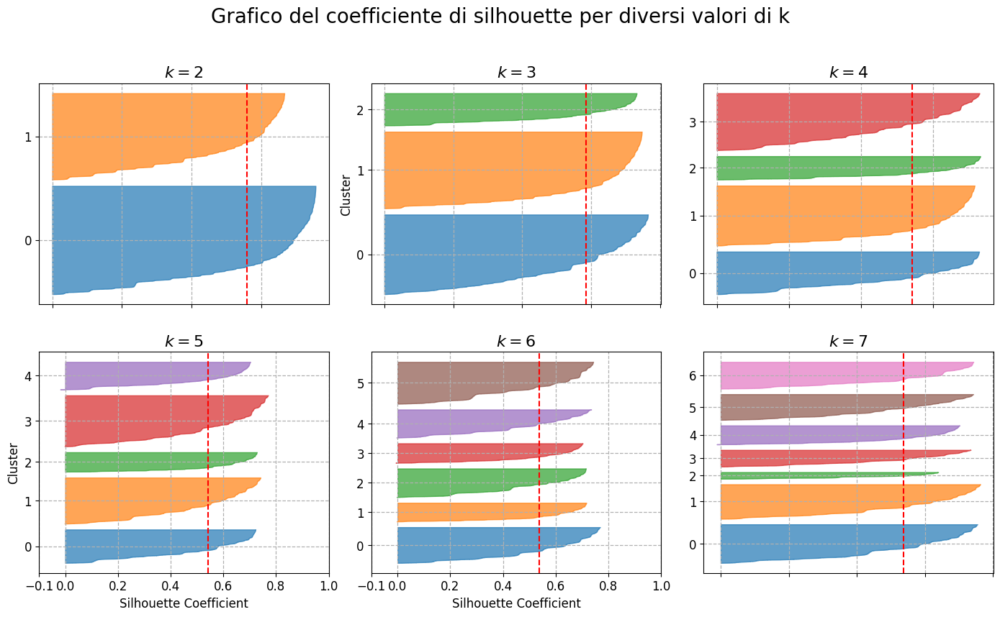

In [ ]:
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter

plt.figure(figsize=(14, 12))

for k in (2, 3, 4, 5, 6, 7):
    plt.subplot(3, 3, k-1)

    y_pred = kmeans_per_k[k - 1].labels_
    silhouette_coefficients = silhouette_samples(ds_clu, y_pred)

    padding = len(ds_clu) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.tab10(i % 10)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    if k in (3, 5):
        plt.ylabel("Cluster", fontsize=12)

    if k in (5, 6):
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("Silhouette Coefficient", fontsize=12)
    else:
        plt.tick_params(labelbottom=False)

    plt.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
    plt.title("$k={}$".format(k), fontsize=16)

    plt.grid(True, which='both', linestyle='--', linewidth=0.9)

plt.subplots_adjust(hspace=1, wspace=0.4)
plt.suptitle("Grafico del coefficiente di silhouette per diversi valori di k", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Possiamo vedere che quando k=3 o 7, otteniamo ammassi cattivi, in quanto sono di dimensione differente. Ma quando k=4 o 5, i cluster sembrano abbastanza buoni: la maggior parte dei casi si estende oltre la linea tratteggiata. Quando k=4, i cluster in indice 0 e 2, sono piuttosto piccoli rispetto ai cluster di indice 1 e 3. Mentre quando k=5, tutti i cluster hanno dimensioni simili, quindi anche se il punteggio complessivo della silhouette di k=3 è maggiore di quello di k=5, sembra una buona idea usare k=5 per ottenere cluster di dimensioni piuttosto simili.

In [ ]:
kmeans = KMeans(n_clusters=5, random_state=42, n_init=33)
kmeans.fit(ds_clu)

labels = kmeans.labels_
unique_clusters, counts = np.unique(labels, return_counts=True)

for cluster, count in zip(unique_clusters, counts):
    print(f"Cluster {cluster}: {count} tuple")

Cluster 0: 3807 tuple
Cluster 1: 5252 tuple
Cluster 2: 2215 tuple
Cluster 3: 5814 tuple
Cluster 4: 3143 tuple


In [ ]:
silhouette_score(ds_clu, labels)

0.5432118811154668

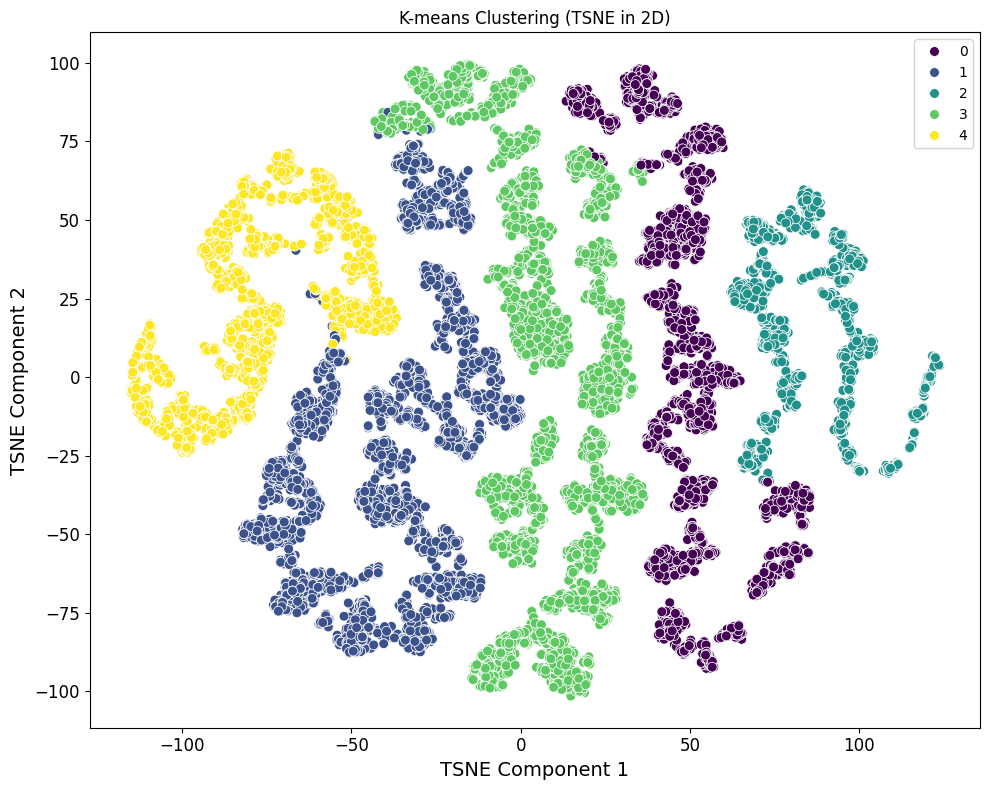

In [ ]:
plot_kmeans_clusters(ds_clu, kmeans.labels_, 2)

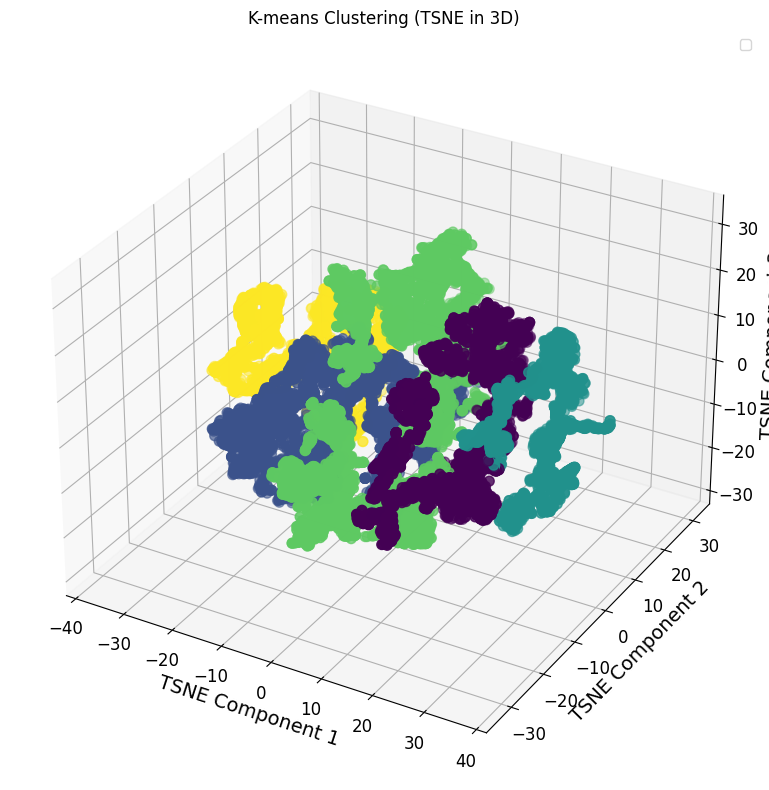

In [ ]:
plot_kmeans_clusters(ds_clu, kmeans.labels_, 3)

Apparentemente dal grafico in 2D sembrerebbe che i cluster si sovrappongano, ma c'è da sottolineare che come nel caso della visualizzazione della distribuzione del dataset, anche in questo caso il plotting dei cluster dipende dal framework utilizzato.

A titolo di esempio usiamo anche UMAP.

/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


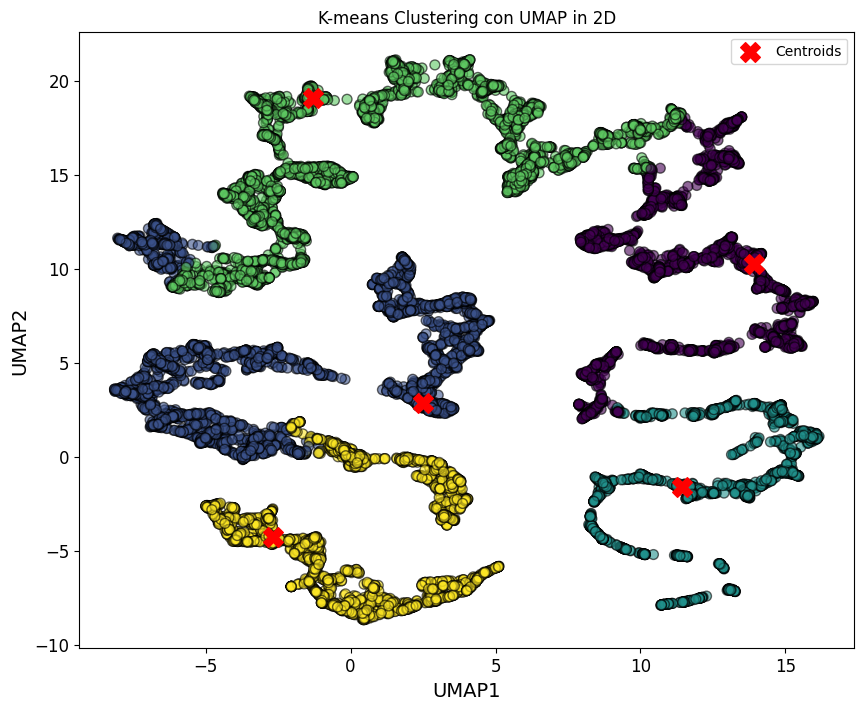

In [ ]:
plot_umap_k_component(ds_clu,kmeans, k_component=2, with_centroid=True)

##### 2.4 K-MEDOIDS

I centroidi prodotti dal K-means verranno analizzati successivamente, adesso ci focalizzeremo sul K-medoids in quanto per la nostra analisi pensiamo siano ragionevoli possedere dei medoidi, rappresentati per ogni cluster.

A tale scopo, si è pensato di partire da 14 cantanti presenti nel dataset, uno per ogni genere musicale differente.

Dati questi 14 generi musicali, poichè un approccio esaustivo era computazionalmente piuttosto oneroso, abbiamo usato una strategia basta sul funzionamento dell'algoritmo di MonteCarlo. Fissato un numero ristretto di iterazioni, pari a 14 (una per ogni genere) si va in maniera random a selezionare almeno 3 generi musicali tra quelli passati e a questi viene aggiunto un medoide calcolato all'iterazione precedente.

L'obiettivo è quello di guidare il k-medoids, iterazione dopo iterazione, nella scelta dei prossimi medoidi sfruttando sempre dei rappresentanti passati in input.

Quello che ci restituisce sarà la combinazione dei medoidi con il miglior score di silhouettes trovato.

Iteration 1/14
Selected Medoids: [102, 1748, 17536, 2598, 3597, 5560]
Silhouette Score: 0.5427
Medoids Index:[19925 16831  7123 15626  6498 13596]
--------------------------------------------------
New Medoids Choosen
Iteration 2/14
Selected Medoids: [1776, 120, 695, 5394, 2598, 3597, 829]
Silhouette Score: 0.5141
Medoids Index:[19925  4158 15626 15604 16831 12080  7123]
--------------------------------------------------
New Medoids Choosen
Iteration 3/14
Selected Medoids: [2598, 3597, 695, 13239, 102, 1776, 829, 7976]
Silhouette Score: 0.4977
Medoids Index:[ 4761 19229 13135 15120 10419 17469  1984  7123]
--------------------------------------------------
New Medoids Choosen
Iteration 4/14
Selected Medoids: [5560, 695, 5394, 829, 120, 2598, 102, 17536, 3597, 1776, 7976]
Silhouette Score: 0.4840
Medoids Index:[13195  7258 14063 15173  7562 19737 10419 14828 13309 15120  3615]
--------------------------------------------------
New Medoids Choosen
Iteration 5/14
Selected Medoids: [3597, 

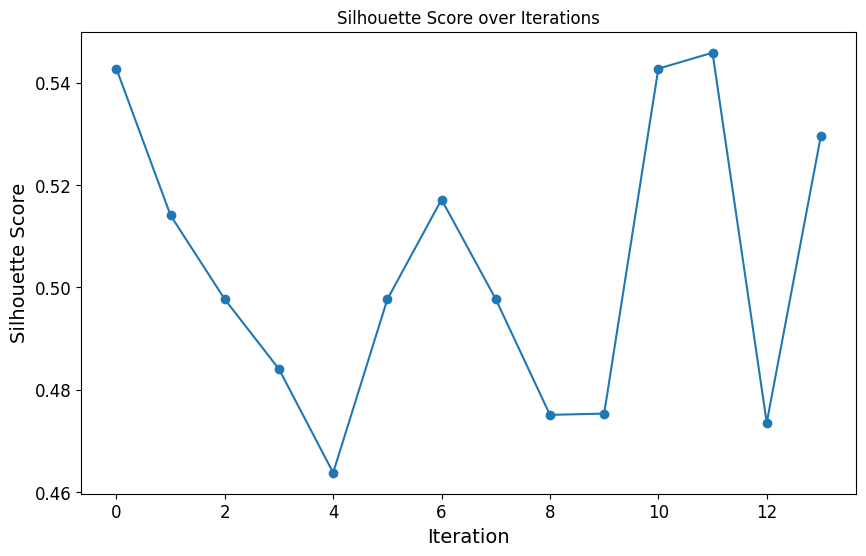

In [ ]:
def calculate_silhouette_score(X, labels):
    return silhouette_score(X, labels)

def search_mest_medoids(X, medoids_index, max_iterations):
    best_score = -1
    best_medoids = None
    scores = []
    best_model = None

    for iteration in range(max_iterations):
        num_medoids = random.randint(3, len(medoids_index))
        selected_medoids = random.sample(medoids_index, num_medoids)
        medoidi = np.array([X.iloc[i] for i in selected_medoids])

        kmedoids = KMedoids(n_clusters=num_medoids, init=medoidi).fit(X)
        labels = kmedoids.labels_
        score = calculate_silhouette_score(X, labels)
        scores.append(score)

        if score > best_score:
            best_model = kmedoids
            best_score = score
            best_medoids = kmedoids.cluster_centers_

        print(f"Iteration {iteration + 1}/{max_iterations}")
        print(f"Selected Medoids: {selected_medoids}")
        print(f"Silhouette Score: {score:.4f}")
        print(f"Medoids Index:{kmedoids.medoid_indices_}")
        print("-" * 50)

        if score > 0.6:
            print("Found a good medoid combination with a Silhouette Score greater than 0.6")
            return best_medoids, best_score, scores

        if iteration < max_iterations - 1:
            random_medoid = random.choice(kmedoids.medoid_indices_)
            if random_medoid not in medoids_index:
              print("New Medoids Choosen")
            selected_medoids = random.sample(medoids_index, num_medoids - 1) + [random_medoid]

    return best_medoids, best_score, scores, best_model

max_iterations = 14
#HipHop - Pop - Rock - Classica - Jazz - Blues - Gospel - Country - Soul - Disco - Salsa- Elettronica - Raggateon - Indie
medoids_index = [120, 102, 9339, 1776, 5394, 3597, 2598, 1748, 829, 695, 5560, 13239, 17536, 7976]
best_medoids, best_score, scores, best_model = search_mest_medoids(ds_clu, medoids_index, max_iterations)

print("Best Medoids:", best_medoids)
print("Best Silhouette Score:", best_score)

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(scores, marker='o')
plt.title('Silhouette Score over Iterations')
plt.xlabel('Iteration')
plt.ylabel('Silhouette Score')
plt.show()

I medoidi individuati dal metodo sono i seguenti:
* 19925 = Fujii Kaze
* 2556 = Gustavo Cerati
* 18250 =  MC Cabelinho
* 16582 = Jaymes Young
* 18587 = Jorja Smith


In [ ]:
for i in best_model.medoid_indices_:
  print(ds_8.iloc[i])

Artist                      Fujii Kaze
Track                           Tabiji
Album               LOVE ALL SERVE ALL
Danceability                  0.750999
Energy                           0.564
Key                                9.0
Loudness                      0.206129
Speechiness                    0.07622
Acousticness                  0.118672
Instrumentalness              0.000003
Liveness                      0.075757
Valence                       0.844985
Tempo                          172.025
Duration_ms                   277027.0
Views                       17677374.0
Likes                         158379.0
Comments                        7291.0
Licensed                         False
Stream                      25958685.0
AlbumC                             1.0
CompilationC                       0.0
SingleC                            0.0
Name: 19925, dtype: object
Artist              Gustavo Cerati
Track                       Crimen
Album                    Ahí Vamos
Danceabili

In [ ]:
best_medoids, best_score, scores, best_model

(array([[ 7.50999334e-01,  2.06128948e-01,  7.62200259e-02,
          1.18671530e-01,  3.00999547e-06,  7.57566124e-02,
          8.44985207e-01,  1.72025000e+02],
        [ 7.32802838e-01, -6.07022952e-02,  2.46926126e-02,
          3.64643114e-01,  6.84994164e-02,  1.81487876e-01,
          5.36656315e-01,  8.05110000e+01],
        [ 7.28697468e-01,  2.64952605e-01,  1.02556588e-01,
          1.68898536e-01,  0.00000000e+00,  1.25751205e-01,
          7.12741187e-01,  1.41562000e+02],
        [ 8.19145897e-01,  1.76195606e-01,  4.34425578e-02,
          1.38021298e-01,  5.28986008e-05,  2.65436464e-01,
          7.02851336e-01,  1.21963000e+02],
        [ 8.70057469e-01,  2.09920008e-01,  1.07957142e-01,
          2.70790205e-01,  0.00000000e+00,  1.07059072e-01,
          7.96868873e-01,  9.80570000e+01]]),
 0.5458396152653636,
 [0.5427299521965211,
  0.5140675051480124,
  0.49767058247297985,
  0.4840437682244322,
  0.4637976685388094,
  0.49767058247297985,
  0.5171611571711325,
 

Diamone una rappresentazione visiva:

/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


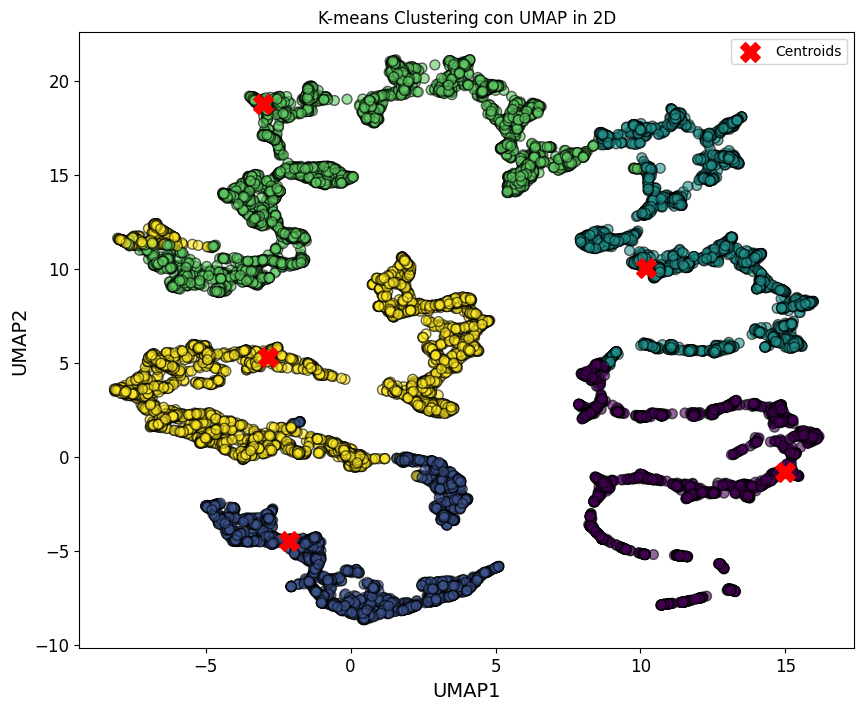

In [ ]:
plot_umap_k_component(ds_clu,best_model,2,True)

Prima di stabilire il genere musicale andniamo a considerare l'uso di un altro algoritmo di clustering, il MeanShift.

##### 2.5 MeanShift

L'algoritmo Mean Shift è un metodo di clustering basato sulla densità dei dati, utilizzato per identificare gruppi o cluster di punti in uno spazio multidimensionale. Si distingue per la sua semplicità, efficienza e capacità di gestire dati non lineari.

Molto sinteticamente l'algoritmo opera in modo iterativo, spostando ogni punto dati nella direzione della densità di massa locale più alta.

In [ ]:
best_quantile, best_score, num_clust = meanshift_grid_search(ds_clu,[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Iteration (quantile: 0.1) - n_clusters: 4, score: 0.5580842602078423
Iteration (quantile: 0.2) - n_clusters: 4, score: 0.5580842602078423
Iteration (quantile: 0.3) - n_clusters: 4, score: 0.5580842602078423
Iteration (quantile: 0.4) - n_clusters: 4, score: 0.5580842602078423
Iteration (quantile: 0.5) - n_clusters: 4, score: 0.5580842602078423
Iteration (quantile: 0.6) - n_clusters: 4, score: 0.5580842602078423
Iteration (quantile: 0.7) - n_clusters: 4, score: 0.5580842602078423
Iteration (quantile: 0.8) - n_clusters: 4, score: 0.5580842602078423
Iteration (quantile: 0.9) - n_clusters: 4, score: 0.5580842602078423
Iteration (quantile: 1) - n_clusters: 4, score: 0.5580842602078423


In [ ]:
best_quantile, best_score, num_clust

(0.1, 0.5580842602078423, 4)

Come possiamo notare, aumentando il quantile il numero di cluster e dello score rimane invariato, utilizziamo l'algoritmo MeanShift con i parametri di base e con un quantile di `0.2` .

In [ ]:
bandwidth = estimate_bandwidth(ds_clu, quantile=0.2)

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(ds_clu)

labels_mean_shift = ms.labels_
cluster_centers_mean_shift = ms.cluster_centers_

labels_unique_ms, counts = np.unique(labels_mean_shift, return_counts=True)
n_clusters_ms = len(labels_unique_ms)

print("Number of clusters : %d" % n_clusters_ms)
print(f"Silhouette score is:{silhouette_score(ds_clu,labels_mean_shift)}")

Number of clusters : 4
Silhouette score is:0.5580842602078423


In [ ]:
print("Number of istances for each cluster:")
for label, count in zip(labels_unique_ms, counts):
    print(f"Cluster {label}: {count} istances")

Number of istances for each cluster:
Cluster 0: 8155 istances
Cluster 1: 8339 istances
Cluster 2: 3687 istances
Cluster 3: 50 istances


Otteniamo un ottimo punteggio di Silhouettes, ma possiede il cluster di indice 3 con un numero di istanze molto ristrette.

##### 2.6 Scelta del Genere Musicale

A questo punto abbiamo 3 soluzioni non equivalenti, il K-Means e il K-Medoids si eguagliano sul numero dei cluster, mentre il MeanShift propone una soluzione con soli 4 cluster.

Confrontando solo i punteggi delle silhoettes la situazione è la seguente:

In [ ]:
print(f"Silhouette score of MeanShift is:{silhouette_score(ds_clu,labels_mean_shift)}")
print(f"Silhouette score of K-Means is:{silhouette_score(ds_clu,best_model.labels_)}")
print(f"Silhouette score of K-Medoids is:{silhouette_score(ds_clu,kmeans.labels_)}")

Silhouette score of MeanShift is:0.5580842602078423
Silhouette score of K-Means is:0.5458396152653636
Silhouette score of K-Medoids is:0.5432118811154668


Confrontando solo il punteggio ottenuto la nostra scelta ricadrebbe sul MeanShift in quanto possiede il valore più alto, se però confrontassimo la distribuzione delle istanze per i cluster però otteniamo:

In [ ]:
kmedoids = KMedoids(n_clusters=5,init=np.array([ds_clu.iloc[i] for i in [19925,  2556, 18250, 16582, 18587]])).fit(ds_clu)
label_k_medoids = kmedoids.labels_
unique_clusters_kmedoids, counts_k_medoids = np.unique(label_k_medoids, return_counts=True)
print("Numero di istanze per cluster K-Medoids:")
for cluster, count in zip(unique_clusters_kmedoids, counts_k_medoids):
    print(f"Cluster {cluster}: {count} tuple")

Numero di istanze per cluster K-Medoids:
Cluster 0: 2633 tuple
Cluster 1: 2718 tuple
Cluster 2: 3887 tuple
Cluster 3: 5613 tuple
Cluster 4: 5380 tuple


In [ ]:
kmeans = kmeans = KMeans(n_clusters=5, random_state=42, n_init=33).fit(ds_clu)
label_k_means = kmeans.labels_
unique_clusters_kmeans, counts_k_means = np.unique(label_k_means, return_counts=True)
print("Numero di istanze per cluster K-Means:")
for cluster, count in zip(unique_clusters_kmeans, counts_k_means):
  print(f"Cluster {cluster}: {count} tuple")

Numero di istanze per cluster K-Means:
Cluster 0: 3807 tuple
Cluster 1: 5252 tuple
Cluster 2: 2215 tuple
Cluster 3: 5814 tuple
Cluster 4: 3143 tuple


In [ ]:
bandwidth = estimate_bandwidth(ds_clu, quantile=0.2)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True).fit(ds_clu)
labels_mean_shift = ms.labels_
cluster_centers_mean_shift = ms.cluster_centers_
labels_unique_ms, counts_mean_shift = np.unique(labels_mean_shift, return_counts=True)
print("Number of istances for each cluster MeanShift:")
for label, count in zip(labels_unique_ms, counts_mean_shift):
    print(f"Cluster {label}: {count} istances")

Number of istances for each cluster MeanShift:
Cluster 0: 8155 istances
Cluster 1: 8339 istances
Cluster 2: 3687 istances
Cluster 3: 50 istances


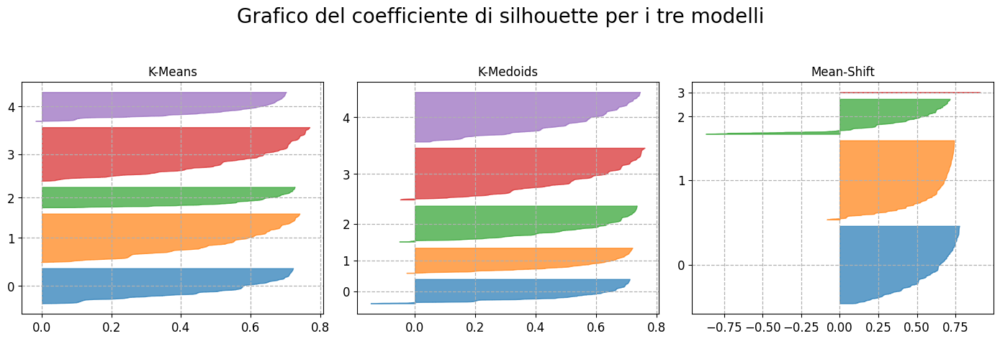

In [ ]:
plt.figure(figsize=(14, 12))
models = [("K-Means",kmeans), ("K-Medoids",kmedoids), ("Mean-Shift",ms)]

j = 1
for model in models:
    plt.subplot(3, 3, j)

    y_pred = model[1].labels_
    silhouette_coefficients = silhouette_samples(ds_clu, y_pred)

    k = len(np.unique(y_pred))

    padding = len(ds_clu) // 30
    pos = padding

    ticks = []

    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.tab10(i % 10)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))

    j = j+1
    plt.grid(True, which='both', linestyle='--', linewidth=0.9)
    plt.title(model[0])

plt.subplots_adjust(hspace=1, wspace=0.4)
plt.suptitle("Grafico del coefficiente di silhouette per i tre modelli", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Dal grafico possiamo notare come i cluster individuati dal MeanShift siano molto sbilanciati, abbiamo il cluster di indice 3 che è quasi inesistente. Tra il K-Means e il K-Medoids riteniamo scegliere il K-Means oltre alla equa distribuzione istanze-cluster, possiede anche un valore di silhouettes più alto.

A questo punto il genere musicale viene individuato attraverso i valori dei centroidi del k-mean

In [ ]:
kmeans.cluster_centers_

array([[ 7.66351659e-01,  5.85765717e-02,  8.62535090e-02,
         2.22681380e-01,  3.75097280e-02,  1.73385647e-01,
         6.94227814e-01,  1.45434280e+02],
       [ 8.10100243e-01,  7.52121481e-02,  8.59155491e-02,
         2.22016389e-01,  3.25105715e-02,  1.65633678e-01,
         7.23904939e-01,  1.00265860e+02],
       [ 7.19970522e-01,  1.24373765e-01,  1.16882294e-01,
         2.08923019e-01,  3.44091797e-02,  1.68908649e-01,
         7.30229386e-01,  1.76479884e+02],
       [ 8.12302709e-01,  6.10477549e-02,  7.28794570e-02,
         2.05606227e-01,  4.06885144e-02,  1.62501660e-01,
         7.14420007e-01,  1.23272069e+02],
       [ 7.26900774e-01, -3.96328460e-01,  9.82523118e-02,
         3.19627072e-01,  7.19958221e-02,  1.68660890e-01,
         6.38165225e-01,  8.09471851e+01]])

I valori prodotti dai centroidi rispecchiano i seguenti generi musicali:

* Cluster etichetta 1: EDM (Electronic Dance Music):
  * [0.766, 0.058, 0.086,0.223,0.037,0.173,0.694,145.43]:
  * Danceability: Alta
  * Loudness: Media
  * Speechiness: Bassa
  * Acousticness: Bassa
  * Instrumentalness: Bassa
  * Liveness: Media
  * Valence: Alta
  * Tempo: Alto
* Cluster etichetta 2: Pop:
  * [0.810,0.075,0.086,0.222,0.032,0.166,0.724,100.27]
  * Danceability: Molto alta
  * Loudness: Media
  * Speechiness: Bassa
  * Acousticness: Bassa
  * Instrumentalness: Molto bassa
  * Liveness: Media
  * Valence: Alta
  * Tempo: Moderato
* Cluster etichetta 3: Rock:
  * [0.720,0.124,0.117,0.209,0.034,0.169,0.730,176.48]
  * Danceability: Alta
  * Loudness: Media
  * Speechiness: Media
  * Acousticness: Bassa
  * Instrumentalness: Bassa
  * Liveness: Media
  * Valence: Alta
  * Tempo: Molto alto
* Cluster etichetta 4: House:
  * [0.812,0.061,0.073,0.205,0.041,0.162,0.714,123.27]
  * Danceability: Molto alta
  * Loudness: Media
  * Speechiness: Bassa
  * Acousticness: Bassa
  * Instrumentalness: Bassa
  * Liveness: Media
  * Valence: Alta
  * Tempo: Alto
* Cluster etichetta 5: Chillout/Lo-fi:
  * [0.727,−0.396,0.098,0.320,0.072,0.169,0.638,80.95]
  * Danceability: Alta
  * Loudness: Bassa
  * Speechiness: Media
  * Acousticness: Media
  * Instrumentalness: Bassa
  * Liveness: Media
  * Valence: Media
  * Tempo: Lento


* Cluster etichetta 1: EDM (Electronic Dance Music);
* Cluster etichetta 2: Pop;
* Cluster etichetta 3: Rock;
* Cluster etichetta 4: House;
* Cluster etichetta 5: Chillout/Lo-fi.


In [ ]:
ds_8["Label"]=kmeans.labels_

In [ ]:
ds_8["Label"].value_counts()

Label
3    5814
1    5252
0    3807
4    3143
2    2215
Name: count, dtype: int64

##### 2.7 Scelta del Genere Musicale Alternativa

Nella scelta alternativa, si era pensato di utilizzare i medoidi come rappresentanti del genere musicale, a tale scopo però sono nate diverse problematiche.

Il k-means e il MeanShift rappresentano due famosi algoritmi di clustering che a differenza del K-Medoids restituiscono i centroidi. Una principale problematica di essi, è che non è detto appartengano al nostro dataset.

Per risolvere tale problematica si è adottata la seguente strategia:


In [ ]:
def find_medoid(X, centroids):
    medoids = []
    for centroid in centroids:
        distances = cdist(X, [centroid], 'euclidean')
        medoid_index = np.argmin(distances)
        medoids.append(medoid_index)
    return np.array(medoids)

Ossia, andare a considerare le istanze del nostro dataset che fossero il più possibile vicino.

In [ ]:
medoids_mean_shift_index = find_medoid(ds_clu, cluster_centers_mean_shift)
medoids_mean_shift_index

array([ 9099, 12156,  4859,  5884])

In [ ]:
for i in medoids_mean_shift_index.tolist():
  print(ds_8.iloc[i]["Artist"])

Alex Ubago
Brandi Carlile
Pesado
J.J. Cale


I 4 artisti rappresentano i seguenti generi:

* Alex Ubago = Rock;
* Brandi Carlile = Folk;
* Pesado = Grupero (genere spagnolo);
* J.J. Cale = Blues.

Tale funzione però non funziona bene con cluster convessi, di conseguenza si è pensato di usare la distanza di Mahalanobis.

$\begin{equation}
d_M(\mathbf{x}, \mathbf{y}) = \sqrt{(\mathbf{x} - \mathbf{y})^T \mathbf{Σ}^{-1} (\mathbf{x} - \mathbf{y})}
\end{equation}$

La distanza di Mahalanobis viene utilizzata per cluster non convessi perché tiene conto della correlazione tra le variabili e delle diverse scale delle variabili, permettendo di identificare la distanza reale tra i punti in uno spazio multidimensionale.


In [ ]:
def mahalanobis_distance(x1, x2, covariance):
    return np.sqrt(np.dot(np.dot((x1 - x2), np.linalg.inv(covariance)), (x1 - x2)))

def find_medoids(X, centroids):
    n, d = X.shape
    k = len(centroids)
    medoids_mahalanobis = np.zeros(k, dtype=int)

    #matrice di covarianza del dataset
    covariance_matrix = np.cov(X, rowvar=False)

    #distanze di Mahalanobis tra ciascun punto nel dataset e ciascun centroide
    distances_mahalanobis = cdist(X, centroids, metric='mahalanobis', VI=np.linalg.inv(covariance_matrix))

    medoids_mahalanobis = np.argmin(distances_mahalanobis, axis=0)

    return medoids_mahalanobis

In [ ]:
medoids = find_medoids(ms, ds_clu, ms.labels_)
print("Indici dei medoidi:", medoids)
for i, medoid in enumerate(medoids):
    print(f"Cluster {i+1}, Indice: {medoid}")

Indici dei medoidi: [ 9099 12156  4859  4167]
Cluster 1, Indice: 9099
Cluster 2, Indice: 12156
Cluster 3, Indice: 4859
Cluster 4, Indice: 4167


In [ ]:
for i in medoids:
  print(ds_8.iloc[i]["Artist"])

Alex Ubago
Brandi Carlile
Pesado
Riton


Come possiamo notare solo il 4 cantante è variato ed esso rappresenta il seguente genere musicale: House.


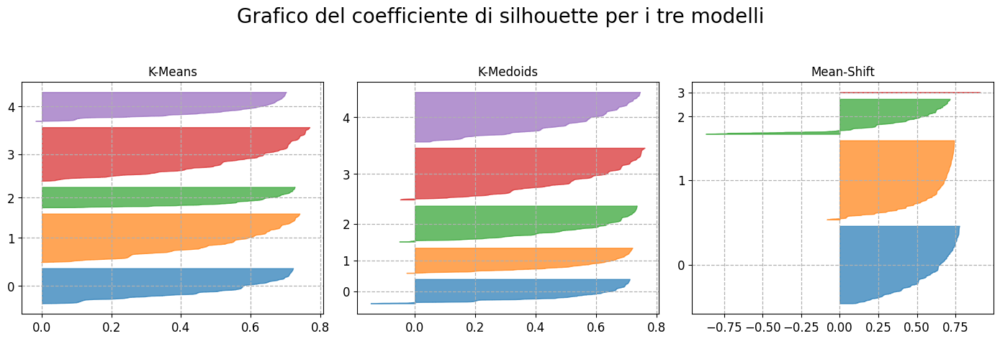

In [ ]:
plt.figure(figsize=(14, 12))
models = [("K-Means",kmeans), ("K-Medoids",kmedoids), ("Mean-Shift",ms)]

j = 1
for model in models:
    plt.subplot(3, 3, j)

    y_pred = model[1].labels_
    silhouette_coefficients = silhouette_samples(ds_clu, y_pred)

    k = len(np.unique(y_pred))

    padding = len(ds_clu) // 30
    pos = padding

    ticks = []

    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.tab10(i % 10)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))

    j = j+1
    plt.grid(True, which='both', linestyle='--', linewidth=0.9)
    plt.title(model[0])

plt.subplots_adjust(hspace=1, wspace=0.4)
plt.suptitle("Grafico del coefficiente di silhouette per i tre modelli", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Dal grafico possiamo notare come l'uso del MeanShift, seppure possiede un coefficiente di Silhouettes più alto, non siano distribuiti in modo uniforme, specialmente il cluster di indice 3 (il primo in alto).

La scelta quindi rimane tra K-Means e K-Medoids.

Andiamo a controllare se i generi musicali individuati siano gli stessi:

In [ ]:
medoidi_km = find_medoids(ds_clu,kmeans.cluster_centers_)
medoidi_km

array([ 9599,   314,   785, 11622,  4691])

In [ ]:
for i in medoidi_km:
  print(ds_8.iloc[i]["Artist"])

Diljit Dosanjh
JAY-Z
John Mayer
Natasha Bedingfield
Fabolous


Per quanto riguarda il KMedoids, invece che basarsi direttamente sulla soluzione proposta dall'algoritmo descritto su poichè era dettato da un approccio simile a MonteCarlo, quindi sempre basato su una certa randomicità.

Si è deciso di lanciare iterativamente l'algoritmo K-Medoids con init='k-medoids++' che simula l'atteggiamento di 'k-means++' nella scelta dei centroidi.

L'obiettivo è quello di verificare se la soluzione prodotta dal K-Medoids risulta essere una buona soluzione.

In [ ]:
best_score = -1
best_model = None

for i in range(10):
  kmedoids = KMedoids(n_clusters=5,init="k-medoids++").fit(ds_clu)
  score = silhouette_score(ds_clu,kmedoids.labels_)
  print(f"Iteration:{i}, score:{score}, best_score:{best_score}")
  if score > best_score:
    best_score = score
    best_model = kmedoids

Iteration:0, score:0.5427810046942866, best_score:-1
Iteration:1, score:0.5427810046942866, best_score:0.5427810046942866
Iteration:2, score:0.5427810046942866, best_score:0.5427810046942866
Iteration:3, score:0.5476987234191524, best_score:0.5427810046942866
Iteration:4, score:0.5430383440474175, best_score:0.5476987234191524
Iteration:5, score:0.5476987234191524, best_score:0.5476987234191524
Iteration:6, score:0.5427810046942866, best_score:0.5476987234191524
Iteration:7, score:0.5427810046942866, best_score:0.5476987234191524
Iteration:8, score:0.5430383440474175, best_score:0.5476987234191524
Iteration:9, score:0.5430383440474175, best_score:0.5476987234191524


In [ ]:
best_score

0.5476987234191524

In [ ]:
best_model.medoid_indices_

array([10199, 14828, 19925,  1786,  2556])

In [ ]:
for i in best_model.medoid_indices_:
  print(ds_8.iloc[i]["Artist"])

Ruger
Rudimental
Fujii Kaze
Jay Chou
Gustavo Cerati


In conclusione i generi musicali scovati sono i seguenti:
* Hip-Hop = Ruger
* Soul = Rudimental
* Pop = Fujii Kaze
* R&B = Jay Chou
* Rock = Gustavo Cerati

I risutalti ottenuti non sono molto simili a quelli ottenuti in precedenza, ossia:

* Cluster etichetta 1: EDM (Electronic Dance Music);
* Cluster etichetta 2: Pop;
* Cluster etichetta 3: Rock;
* Cluster etichetta 4: House;
* Cluster etichetta 5: Chillout/Lo-fi.


La nostra scelta è ricaduta sull'uso del K-Means e non del K-Medoids, questo perchè sostanzialmente un cantante non può essere rappresentativo del genere. Sostenere il contrario, porterebbe ad una mal etichettatura oltre che interpretazione.

### Seconda Opzione: Features senza trasformazioni

In [ ]:
ds_7 = ds_9.copy()
ds_7.describe()

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Stream,AlbumC,CompilationC,SingleC
count,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,20231.000000,20231.000000,20231.000000
mean,0.620725,0.635388,5.303495,-7.653818,0.096148,0.288844,0.055336,0.191443,0.529750,120.705482,2.249555e+05,9.400663e+07,6.638588e+05,2.753992e+04,1.368912e+08,0.721862,0.037962,0.240176
std,0.164346,0.213340,3.577726,4.598290,0.110208,0.285800,0.191705,0.165339,0.245271,29.386578,1.255742e+05,2.747473e+08,1.786842e+06,1.928412e+05,2.425447e+08,0.448093,0.191108,0.427201
min,0.053200,0.000020,0.000000,-46.251000,0.022000,0.000001,0.000000,0.014500,0.000000,37.114000,3.098500e+04,0.000000e+00,0.000000e+00,0.000000e+00,6.574000e+03,0.000000,0.000000,0.000000
25%,0.519000,0.508000,2.000000,-8.824000,0.035700,0.043750,0.000000,0.094000,0.339000,97.008500,1.803700e+05,1.836305e+06,2.183200e+04,5.160000e+02,1.836076e+07,0.000000,0.000000,0.000000
50%,0.638000,0.666000,5.000000,-6.537000,0.050500,0.190000,0.000002,0.125000,0.537000,119.966000,2.134280e+05,1.452832e+07,1.263780e+05,3.335000e+03,5.282679e+07,1.000000,0.000000,0.000000
75%,0.741000,0.797000,8.000000,-4.939000,0.103000,0.471000,0.000476,0.234000,0.726000,139.931500,2.524335e+05,7.045222e+07,5.307870e+05,1.466500e+04,1.359422e+08,1.000000,0.000000,0.000000
max,0.975000,1.000000,11.000000,0.920000,0.964000,0.996000,0.995000,1.000000,0.993000,243.372000,4.676058e+06,8.079649e+09,5.078865e+07,1.608314e+07,3.386520e+09,1.000000,1.000000,1.000000


#### 2 Clustering


Si vuole proporre un'alternativa effettuando la clusterizzazione senza trasfromare i valori delle features in input.

##### 2.0 Inizializzazione Dataset

In [ ]:
ds_8 = ds_7.copy()
ds_8.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20231 entries, 0 to 20230
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20231 non-null  object 
 1   Track             20231 non-null  object 
 2   Album             20231 non-null  object 
 3   Danceability      20231 non-null  float64
 4   Energy            20231 non-null  float64
 5   Key               20231 non-null  float64
 6   Loudness          20231 non-null  float64
 7   Speechiness       20231 non-null  float64
 8   Acousticness      20231 non-null  float64
 9   Instrumentalness  20231 non-null  float64
 10  Liveness          20231 non-null  float64
 11  Valence           20231 non-null  float64
 12  Tempo             20231 non-null  float64
 13  Duration_ms       20231 non-null  float64
 14  Views             20231 non-null  float64
 15  Likes             20231 non-null  float64
 16  Comments          20231 non-null  float6

Al fine di individuare i diversi generi musicali, riteniamo utili l'uso solo delle seguenti features:
* Danceability;
* Loudness;
* Energy;
* Speechiness;
*	Acousticness;
*	Instrumentalness;
*	Liveness;
* Valence;
* Tempo.

A differenza del caso precedente in cui si era scelto di rimuovere la feature 'Energy' poichè in stretta correlazione con 'Loudness', in questa seconda fase si decide di mantenere entrambe le features all'interno del dataset su cui si va ad effettuare la clusterizzazione. Anche se generalmente si consiglia di togliere le features correlate, come fatto in precedenza, in questa seconda fase si vogliono visualizzare meglio le differenze rispetto ai due approcci.

La presenza di feature correlate potrebbe distorcere la misura delle distanze utilizzata dagli algoritmi di clustering, come K-means. Le feature correlate introducono ridondanza, facendo sì che le distanze riflettano principalmente queste correlazioni, piuttosto che la struttura reale dei dati. Tuttavia, per una più edsa

Andiamo quindi a rimuovere le features ritenute non idonee ai fini della ricerca del genere musicale dunque della clusterizzazione.



In [ ]:
ds_clu = ds_8.drop(columns=["Artist","Track","Album","Views","Likes","Comments","Licensed","Stream","Key", "AlbumC", "CompilationC", "SingleC", "Duration_ms"],inplace=False)
ds_clu.describe()

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo
count,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000
mean,0.620725,0.635388,-7.653818,0.096148,0.288844,0.055336,0.191443,0.529750,120.705482
std,0.164346,0.213340,4.598290,0.110208,0.285800,0.191705,0.165339,0.245271,29.386578
min,0.053200,0.000020,-46.251000,0.022000,0.000001,0.000000,0.014500,0.000000,37.114000
25%,0.519000,0.508000,-8.824000,0.035700,0.043750,0.000000,0.094000,0.339000,97.008500
50%,0.638000,0.666000,-6.537000,0.050500,0.190000,0.000002,0.125000,0.537000,119.966000
75%,0.741000,0.797000,-4.939000,0.103000,0.471000,0.000476,0.234000,0.726000,139.931500
max,0.975000,1.000000,0.920000,0.964000,0.996000,0.995000,1.000000,0.993000,243.372000


##### 2.1 Visualizzazione

Come nel caso precedente, si vuole visualizzare graficamente come si dispongono le istanze in uno spazio bi-dimensionale.

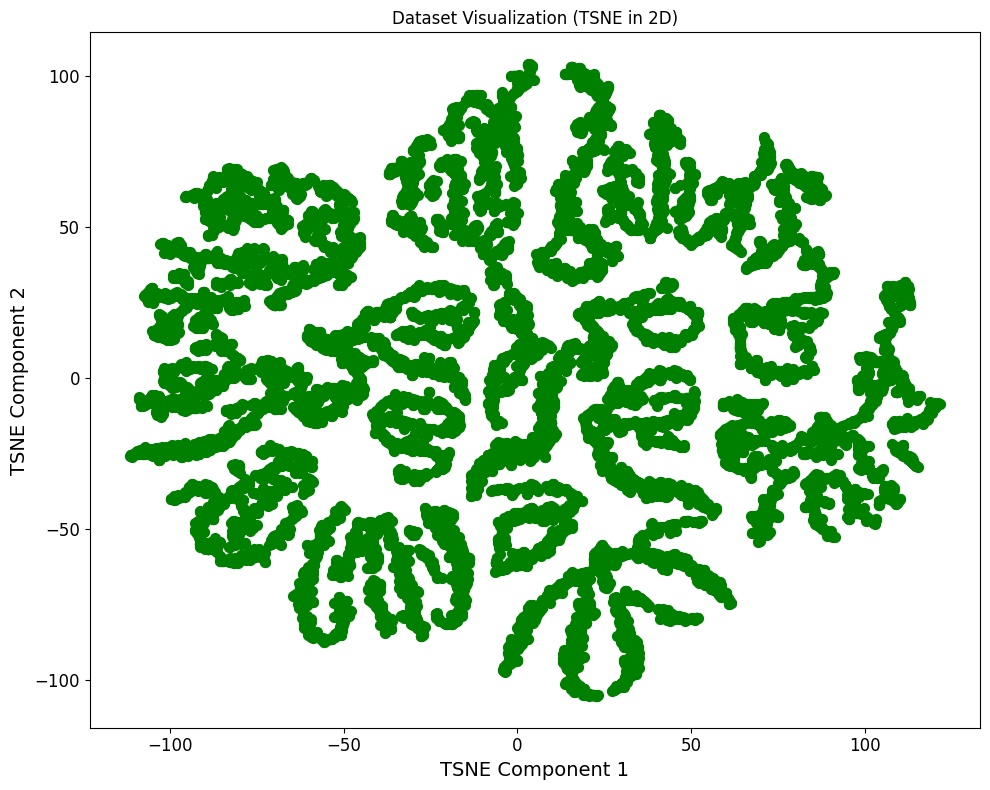

In [ ]:
plot_dataset_tsne(ds_clu,plot_dim=2)

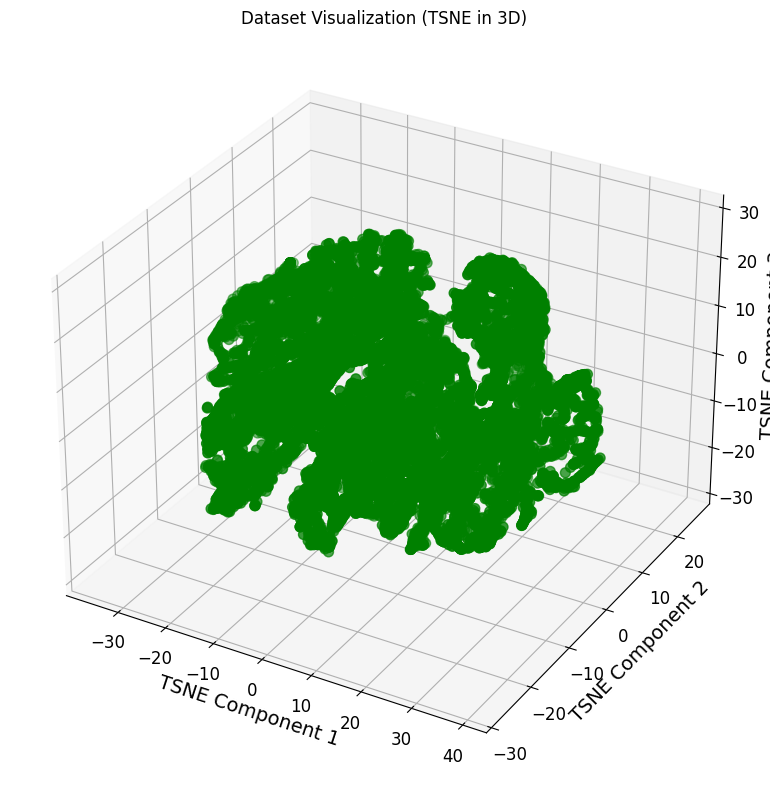

In [ ]:
plot_dataset_tsne(ds_clu,plot_dim=3)

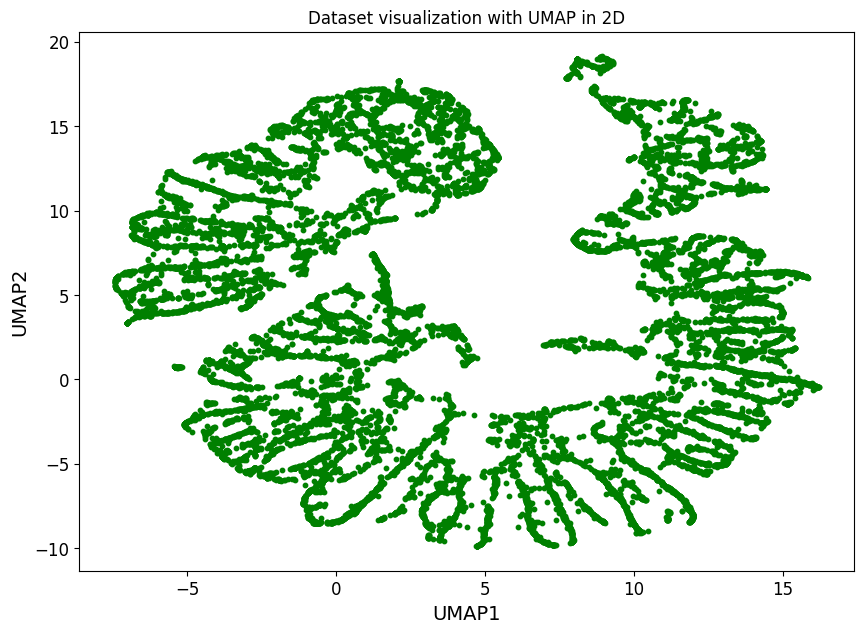

In [ ]:
plot_umap_data_2d(ds_clu)

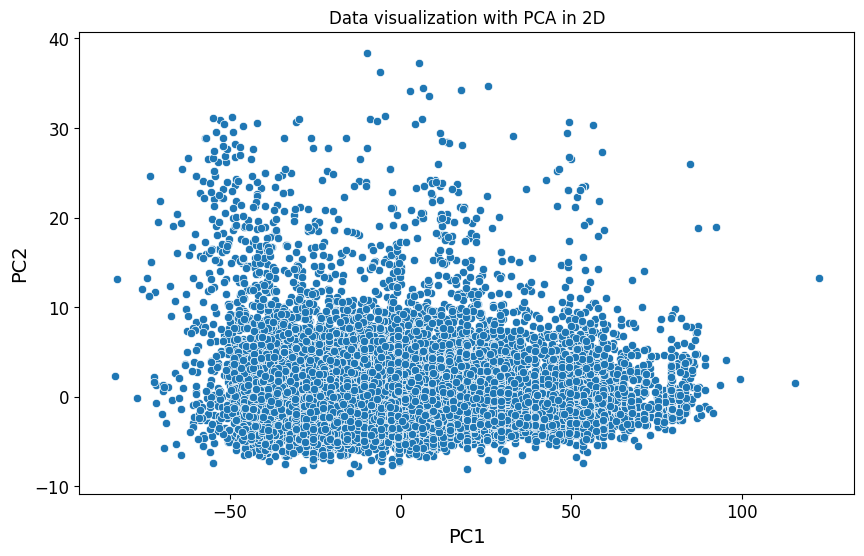

In [ ]:
plot_pca_k_components(ds_clu,k_component=2)

A seconda del frame utilizzato varia la rappresentazione, questo perchè:
**DIRE LE DIFFERENZE TRA PCA, UMPA E TNSE**

Notiamo da tutti i grafici una cosa chiara, i punti sono moldo addensati in determinati punti.
Il primo algoritmo che lanciamo è il *DBSCAN*.

##### 2.2 DBSCAN


Vista l'assunzione eseguita precedentemente, ossia che i punti sono addensati, andiamo a verificare quanti cluster vengono individiduati dal DBSCAN al variare dei suoi parametri principali.

In [ ]:
eps_values = np.arange(0.3, 1.5, 0.1)
clusters_per_eps = []
for eps in eps_values:
    dbscan = DBSCAN(eps=eps)
    dbscan.fit(ds_clu)

    cluster_labels = dbscan.labels_
    num_clusters = len(np.unique(cluster_labels))
    clusters_per_eps.append(num_clusters)

print("Number of Cluster for each value of epsilon:")
print("_"*45)
for i, eps in enumerate(eps_values):
    print(f"Epsilon: {eps:.2f} - Number of Cluster: {clusters_per_eps[i]}")

Number of Cluster for each value of epsilon:
_____________________________________________
Epsilon: 0.30 - Number of Cluster: 234
Epsilon: 0.40 - Number of Cluster: 325
Epsilon: 0.50 - Number of Cluster: 311
Epsilon: 0.60 - Number of Cluster: 196
Epsilon: 0.70 - Number of Cluster: 123
Epsilon: 0.80 - Number of Cluster: 93
Epsilon: 0.90 - Number of Cluster: 74
Epsilon: 1.00 - Number of Cluster: 50
Epsilon: 1.10 - Number of Cluster: 43
Epsilon: 1.20 - Number of Cluster: 42
Epsilon: 1.30 - Number of Cluster: 35
Epsilon: 1.40 - Number of Cluster: 35


Otteniamo un risultato piuttosto strano, in quanto si passa da un massimo di 234 cluster con un raggio molto miccolo, ad un numero di cluster ristretto (35) all'aumentare del raggio. Rispecchia un pò quello che avevamo trovato in precedenza, ossia essendo il dataset molto denso il numero di cluster diminuisce, ma andando a considerare al variare del numero minimo dei punti da considerare:

In [ ]:
min_samples = np.arange(5,500, 50)
clusters_per_min_points = []
for min_points in min_samples:
    dbscan = DBSCAN(min_samples=min_points)
    dbscan.fit(ds_clu)

    cluster_labels = dbscan.labels_
    num_clusters = len(np.unique(cluster_labels))

    clusters_per_min_points.append(num_clusters)

print("Number of Cluster for each value of min_points:")
print("_"*45)
for i, min_points in enumerate(min_samples):
    print(f"Min_Points: {min_points} - Number of Cluster: {clusters_per_min_points[i]}")

Number of Cluster for each value of min_points:
_____________________________________________
Min_Points: 5 - Number of Cluster: 311
Min_Points: 55 - Number of Cluster: 2
Min_Points: 105 - Number of Cluster: 1
Min_Points: 155 - Number of Cluster: 1
Min_Points: 205 - Number of Cluster: 1
Min_Points: 255 - Number of Cluster: 1
Min_Points: 305 - Number of Cluster: 1
Min_Points: 355 - Number of Cluster: 1
Min_Points: 405 - Number of Cluster: 1
Min_Points: 455 - Number of Cluster: 1


Come volevosi dimostrare, ottenniamo lo stesso risultato di prima, ossia il numero di Cluster tende a diminuire con l'aumentare dei punti.

In [ ]:
best_eps, best_min_samples, best_score, num_clust = dbscan_grid_search(ds_clu,[0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 1.1],[3, 5, 10, 20, 30, 50,100,200,300])

Iteration (eps: 0.3, min_samples: 3) - n_clusters: 790, score: -0.631713748480881
Iteration (eps: 0.3, min_samples: 5) - n_clusters: 233, score: -0.7519574346417511
Iteration (eps: 0.3, min_samples: 10) - n_clusters: 34, score: -0.8056292208908482
Iteration (eps: 0.3, min_samples: 20) - n_clusters: 4, score: -0.6138015803874348
Skipping iteration (eps: 0.3, min_samples: 30) - too few clusters (0)
Skipping iteration (eps: 0.3, min_samples: 50) - too few clusters (0)
Skipping iteration (eps: 0.3, min_samples: 100) - too few clusters (0)
Skipping iteration (eps: 0.3, min_samples: 200) - too few clusters (0)
Skipping iteration (eps: 0.3, min_samples: 300) - too few clusters (0)
Iteration (eps: 0.4, min_samples: 3) - n_clusters: 797, score: -0.48862180900480134
Iteration (eps: 0.4, min_samples: 5) - n_clusters: 324, score: -0.5631076778900564
Iteration (eps: 0.4, min_samples: 10) - n_clusters: 97, score: -0.6758260588973481
Iteration (eps: 0.4, min_samples: 20) - n_clusters: 26, score: -0.7

In [ ]:
print(f"Best parameters: eps={best_eps}, min_samples={best_min_samples}")
print(f"Best score: {best_score}")
print(f"Number of clusters: {num_clust}")

Best parameters: eps=1.1, min_samples=30
Best score: 0.12018895672437463
Number of clusters: 4


Possiamo notare un valore molto basso di silhouettes, vicino allo zero indicando che i cluster identificati dall'algoritmo di clustering non sono ben definiti.

In particolare avremmo una bassaa distanza tra i cluster è, suggerendo che i cluster non sono ben separati e potrebbero esserci molteplici punti che sono equidistanti da più cluster.

I cluster potrebbero sovrapporsi significativamente, indicando che i punti dati sono molto simili tra di loro indipendentemente dal cluster a cui appartengono.

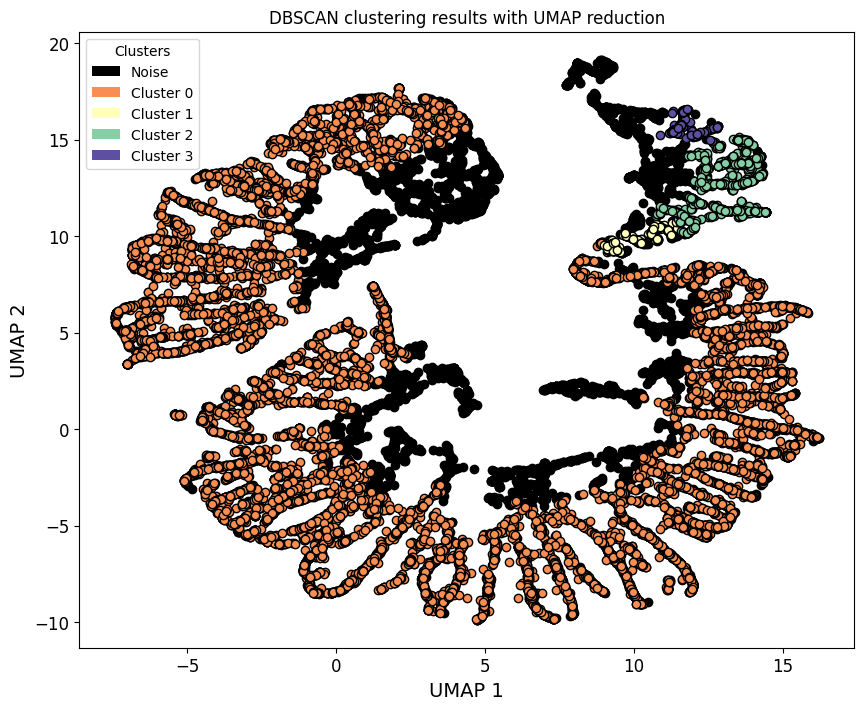

In [ ]:
dbscan = DBSCAN(eps=best_eps,min_samples=best_min_samples)
labels = dbscan.fit_predict(ds_clu)
plot_dbscan_with_umap(ds_clu, labels)

La distribuzione dei cluster è la seguente:

In [ ]:
unique_clusters, counts = np.unique(labels, return_counts=True)
for cluster, count in zip(unique_clusters, counts):
    print(f"Cluster {cluster}: {count} tuple")

Cluster -1: 4207 tuple
Cluster 0: 14825 tuple
Cluster 1: 197 tuple
Cluster 2: 797 tuple
Cluster 3: 205 tuple


Andiamo a verificare se almeno con il K-Means si ha un miglioramento.

##### 2.3 K-MEANS

In [ ]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=42,n_init=33).fit(ds_clu)
                for k in range(1, 21)]
inertias = [model.inertia_ for model in kmeans_per_k]

In [ ]:
inertias

[17903668.239523057,
 6377450.809289611,
 3004758.1289727185,
 2051182.6599946427,
 1461357.7113705887,
 1207474.1512881732,
 997043.2748442497,
 868343.1507557185,
 772291.6072954107,
 690450.2757568536,
 635081.1492678826,
 579980.9780456694,
 537318.5071536517,
 496484.73681599274,
 466064.15279155225,
 440106.19736273424,
 411887.11394504446,
 389918.49628660333,
 371959.7229191981,
 357327.0791694594]

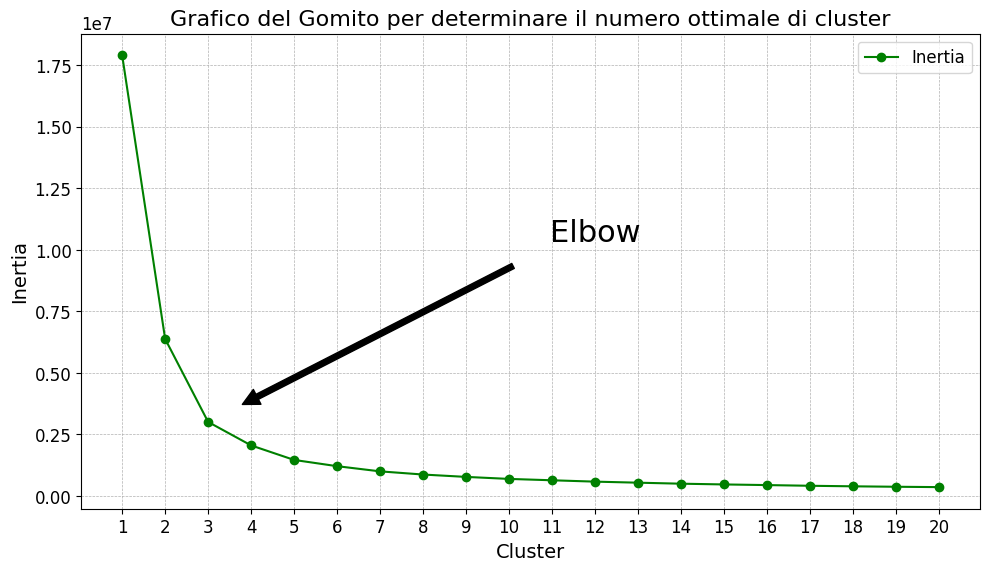

In [ ]:
plot_elbow_graph(21,inertias,type_graph="I")

Seguendo l'inerzia il numero ideale di cluster è pari a 3. Andiamo a valutare il silhouettes score di ogni modello.

In [ ]:
silhouette_scores = [silhouette_score(ds_clu, model.labels_)
                     for model in kmeans_per_k[1:]]

In [ ]:
silhouette_scores

[0.5386789579379054,
 0.5509913135141525,
 0.49145549734473953,
 0.4852273403850069,
 0.4557604320544855,
 0.4475145557820819,
 0.43910690284122067,
 0.4390336207197883,
 0.4116229502252792,
 0.41978717501514984,
 0.40290268166344667,
 0.40722964875455536,
 0.3913451169274507,
 0.3852904967977206,
 0.3742016025414236,
 0.37484390135024853,
 0.3807774932272726,
 0.3689555870285895,
 0.36919129177406995]

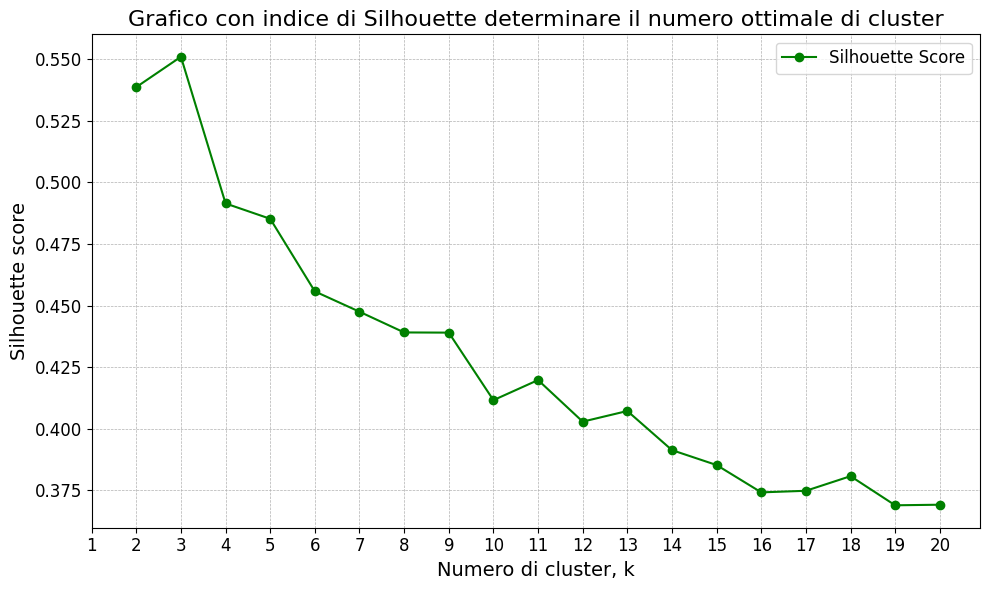

In [ ]:
plot_elbow_graph(21,silhouette_scores,"S")

Da questo grafico notiamo in primis un valore massimo di silhouettes inferiore al massimo trovato in precedenza, inoltre in questo caso i valori tendono a decrescere molto rapidamente all'aumentare dei cluster.

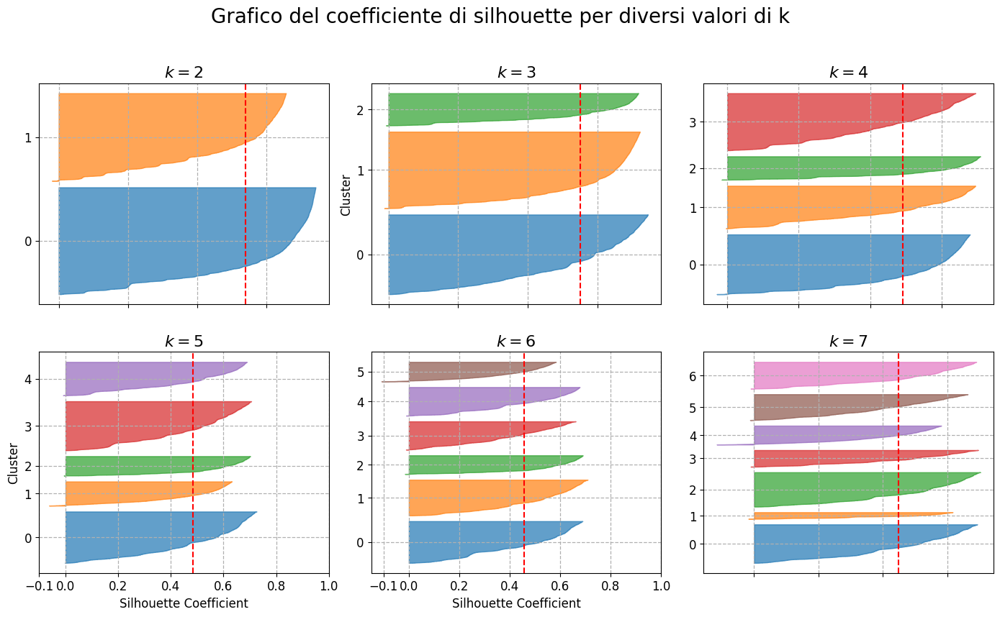

In [ ]:
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter

plt.figure(figsize=(14, 12))

for k in (2, 3, 4, 5, 6, 7):
    plt.subplot(3, 3, k-1)

    y_pred = kmeans_per_k[k - 1].labels_
    silhouette_coefficients = silhouette_samples(ds_clu, y_pred)

    padding = len(ds_clu) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.tab10(i % 10)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    if k in (3, 5):
        plt.ylabel("Cluster", fontsize=12)

    if k in (5, 6):
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("Silhouette Coefficient", fontsize=12)
    else:
        plt.tick_params(labelbottom=False)

    plt.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
    plt.title("$k={}$".format(k), fontsize=16)

    plt.grid(True, which='both', linestyle='--', linewidth=0.9)

plt.subplots_adjust(hspace=1, wspace=0.4)
plt.suptitle("Grafico del coefficiente di silhouette per diversi valori di k", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

La scelta, da noi considerata più oppurtuna, è ricaduta su k=4, in quanto consideriamo essere quella che possiede una distribuzione omogenea.

In [ ]:
kmeans = KMeans(n_clusters=4, random_state=42, n_init=33)
kmeans.fit(ds_clu)

labels = kmeans.labels_
unique_clusters, counts = np.unique(labels, return_counts=True)

for cluster, count in zip(unique_clusters, counts):
    print(f"Cluster {cluster}: {count} tuple")

Cluster 0: 6613 tuple
Cluster 1: 4717 tuple
Cluster 2: 2586 tuple
Cluster 3: 6315 tuple


In [ ]:
silhouette_score(ds_clu, labels)

0.49145549734473953

Otteniamo però un valore basso di Silhouettes rispetto alla soluzione considerata in precedenza, possiamo quindi interrompere questa strada, sia il DBSCAN che il K-Means restituiscono risultati inferiori a quelli trovati in precedenza.

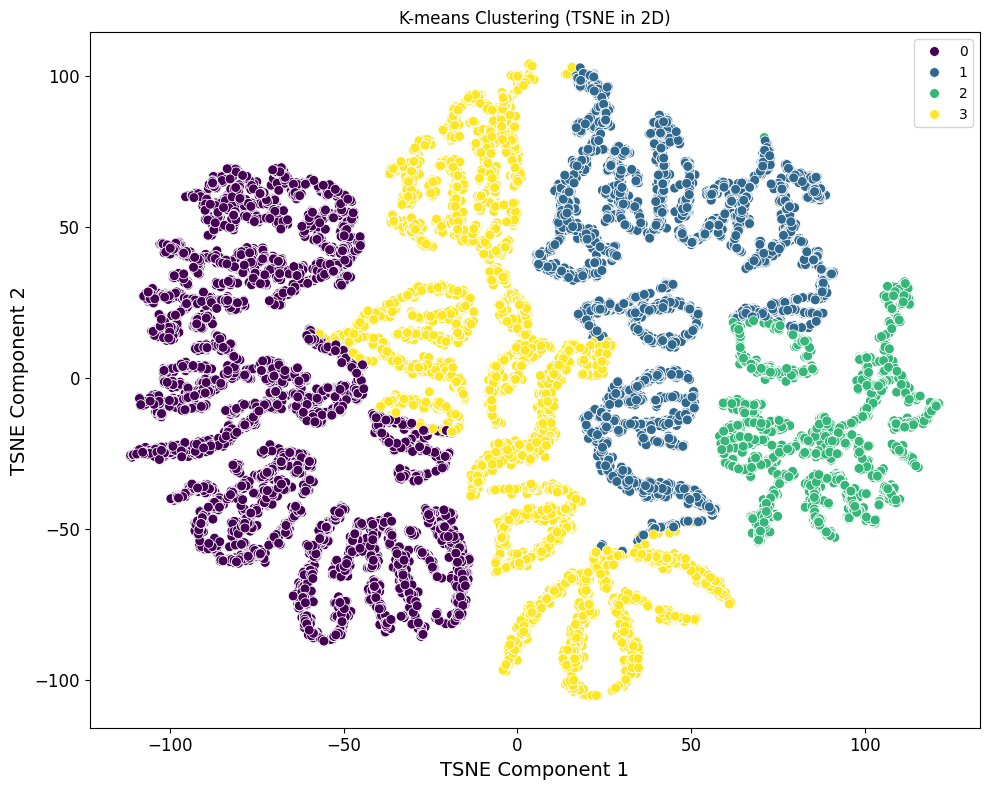

In [ ]:
plot_kmeans_clusters(ds_clu, kmeans.labels_, 2)

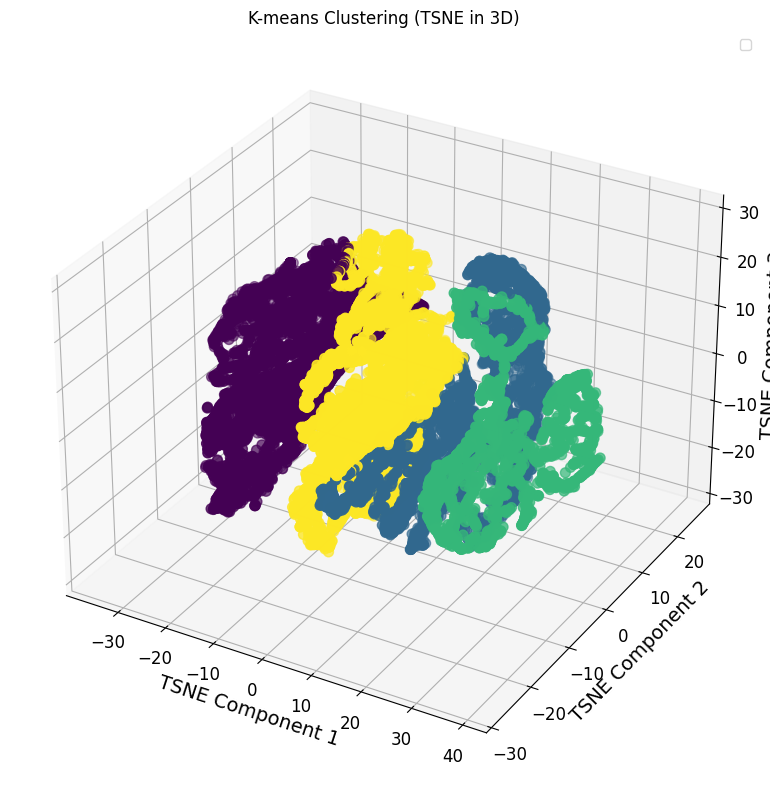

In [ ]:
plot_kmeans_clusters(ds_clu, kmeans.labels_, 3)


Consideriamo anche una rappresentazione mediante UMAP.

/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


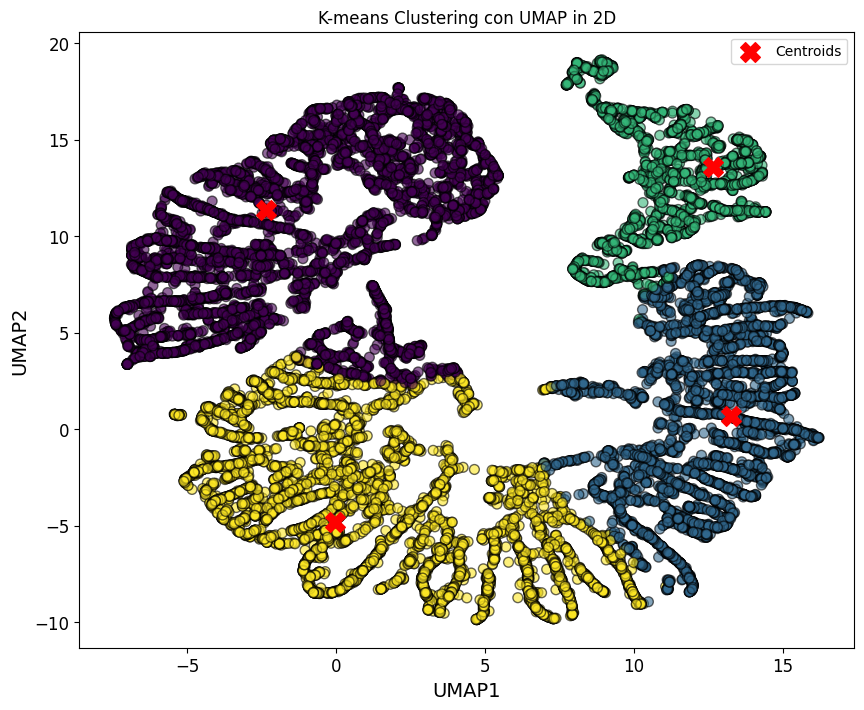

In [ ]:
plot_umap_k_component(ds_clu,kmeans, k_component=2, with_centroid=True)

### Terza Opzione: Standardizzare l'intero dataset

In [ ]:
ds_7 = ds_10.copy()
ds_7.describe()

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Stream,AlbumC,CompilationC,SingleC
count,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,20231.000000,20231.000000,20231.000000
mean,0.620725,0.635388,-7.653818,0.096148,0.288844,0.055336,0.191443,0.529750,120.705482,2.249555e+05,9.400663e+07,6.638588e+05,2.753992e+04,1.368912e+08,0.721862,0.037962,0.240176
std,0.164346,0.213340,4.598290,0.110208,0.285800,0.191705,0.165339,0.245271,29.386578,1.255742e+05,2.747473e+08,1.786842e+06,1.928412e+05,2.425447e+08,0.448093,0.191108,0.427201
min,0.053200,0.000020,-46.251000,0.022000,0.000001,0.000000,0.014500,0.000000,37.114000,3.098500e+04,0.000000e+00,0.000000e+00,0.000000e+00,6.574000e+03,0.000000,0.000000,0.000000
25%,0.519000,0.508000,-8.824000,0.035700,0.043750,0.000000,0.094000,0.339000,97.008500,1.803700e+05,1.836305e+06,2.183200e+04,5.160000e+02,1.836076e+07,0.000000,0.000000,0.000000
50%,0.638000,0.666000,-6.537000,0.050500,0.190000,0.000002,0.125000,0.537000,119.966000,2.134280e+05,1.452832e+07,1.263780e+05,3.335000e+03,5.282679e+07,1.000000,0.000000,0.000000
75%,0.741000,0.797000,-4.939000,0.103000,0.471000,0.000476,0.234000,0.726000,139.931500,2.524335e+05,7.045222e+07,5.307870e+05,1.466500e+04,1.359422e+08,1.000000,0.000000,0.000000
max,0.975000,1.000000,0.920000,0.964000,0.996000,0.995000,1.000000,0.993000,243.372000,4.676058e+06,8.079649e+09,5.078865e+07,1.608314e+07,3.386520e+09,1.000000,1.000000,1.000000


#### Clustering


Si vuole proporre un'alternativa effettuando la clusterizzazione al dataset standardizzato, considerando anche la durata.

##### Inizializzazione Dataset

In [ ]:
ds_8 = ds_7.copy()
ds_8.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20231 entries, 0 to 20230
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20231 non-null  object 
 1   Track             20231 non-null  object 
 2   Album             20231 non-null  object 
 3   Danceability      20231 non-null  float64
 4   Energy            20231 non-null  float64
 5   Loudness          20231 non-null  float64
 6   Speechiness       20231 non-null  float64
 7   Acousticness      20231 non-null  float64
 8   Instrumentalness  20231 non-null  float64
 9   Liveness          20231 non-null  float64
 10  Valence           20231 non-null  float64
 11  Tempo             20231 non-null  float64
 12  Duration_ms       20231 non-null  float64
 13  Views             20231 non-null  float64
 14  Likes             20231 non-null  float64
 15  Comments          20231 non-null  float64
 16  Licensed          20231 non-null  object

In [ ]:
ds_clu = ds_8.drop(columns=["Artist","Track","Album","Views","Likes","Comments","Licensed","Stream", "AlbumC", "CompilationC", "SingleC"],inplace=False)
ds_clu.describe()

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms
count,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,2.023100e+04
mean,0.620725,0.635388,-7.653818,0.096148,0.288844,0.055336,0.191443,0.529750,120.705482,2.249555e+05
std,0.164346,0.213340,4.598290,0.110208,0.285800,0.191705,0.165339,0.245271,29.386578,1.255742e+05
min,0.053200,0.000020,-46.251000,0.022000,0.000001,0.000000,0.014500,0.000000,37.114000,3.098500e+04
25%,0.519000,0.508000,-8.824000,0.035700,0.043750,0.000000,0.094000,0.339000,97.008500,1.803700e+05
50%,0.638000,0.666000,-6.537000,0.050500,0.190000,0.000002,0.125000,0.537000,119.966000,2.134280e+05
75%,0.741000,0.797000,-4.939000,0.103000,0.471000,0.000476,0.234000,0.726000,139.931500,2.524335e+05
max,0.975000,1.000000,0.920000,0.964000,0.996000,0.995000,1.000000,0.993000,243.372000,4.676058e+06


In [ ]:
standard = StandardScaler()
ds_clu["Duration_ms"] = ds_clu["Duration_ms"]/1000
ds_clu =pd.DataFrame(standard.fit_transform(ds_clu),columns=ds_clu.columns)

In [ ]:
ds_clu.describe()

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms
count,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04
mean,-8.991100e-17,-1.489151e-16,-8.429156e-17,-1.573442e-16,-1.169545e-16,6.743325e-17,1.685831e-16,1.025547e-16,-1.952754e-16,-1.180082e-16
std,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00
min,-3.453307e+00,-2.978270e+00,-8.394020e+00,-6.728212e-01,-1.010672e+00,-2.886573e-01,-1.070205e+00,-2.159909e+00,-2.844617e+00,-1.544707e+00
25%,-6.189801e-01,-5.971269e-01,-2.544884e-01,-5.485077e-01,-8.575931e-01,-2.886573e-01,-5.893639e-01,-7.777310e-01,-8.064079e-01,-3.550618e-01
50%,1.051181e-01,1.434944e-01,2.428828e-01,-4.142128e-01,-3.458580e-01,-2.886443e-01,-4.018660e-01,2.955887e-02,-2.516457e-02,-9.180059e-02
75%,7.318585e-01,7.575538e-01,5.904119e-01,6.217121e-02,6.373730e-01,-2.861769e-01,2.574004e-01,8.001538e-01,6.542610e-01,2.188242e-01
max,2.155715e+00,1.709112e+00,1.864613e+00,7.874868e+00,2.474371e+00,4.901730e+00,4.890411e+00,1.888772e+00,4.174339e+00,3.544687e+01


##### 2.1 Visualizzazione

Come nel caso precedente, si vuole visualizzare graficamente come si dispongono le istanze in uno spazio bi-dimensionale.

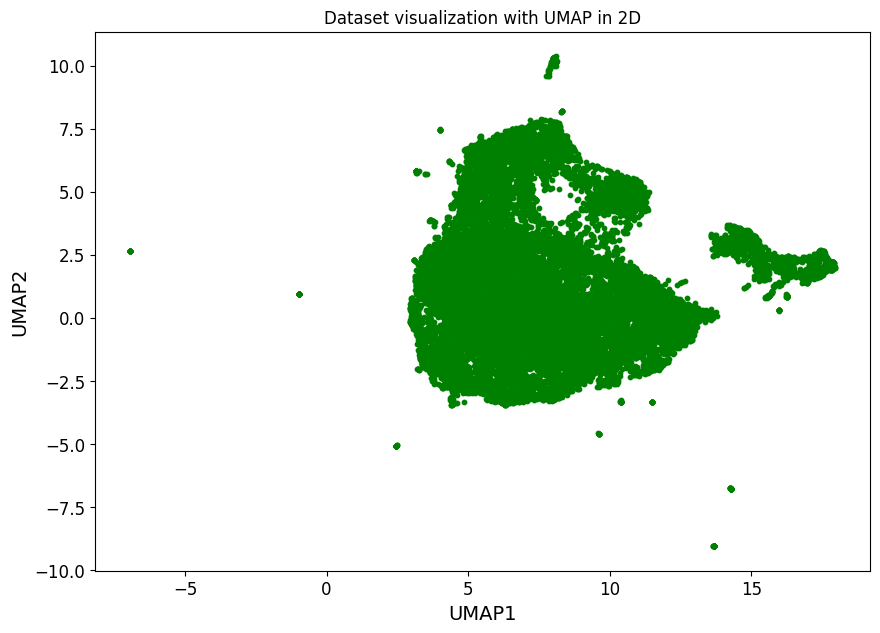

In [ ]:
plot_umap_data_2d(ds_clu)

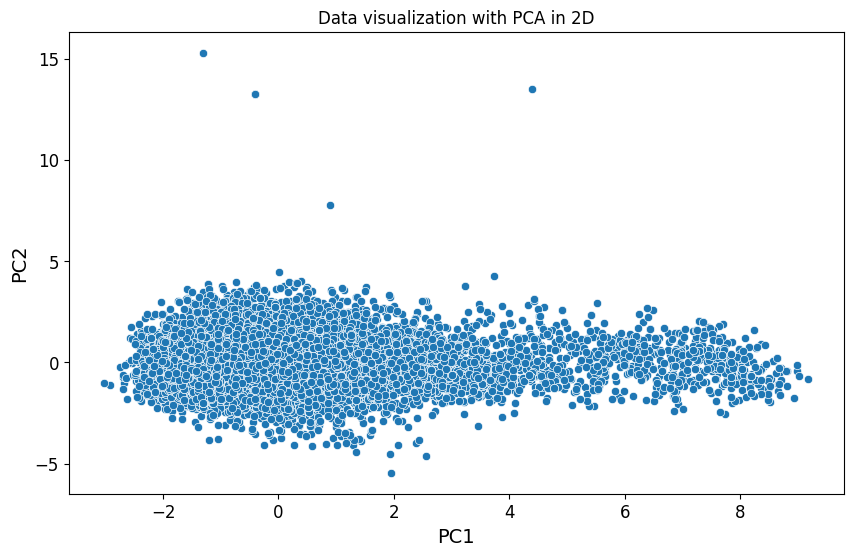

In [ ]:
plot_pca_k_components(ds_clu,k_component=2)

##### DBSCAN


Vista l'assunzione eseguita precedentemente, ossia che i punti sono addensati, andiamo a verificare quanti cluster vengono individiduati dal DBSCAN al variare dei suoi parametri principali.

In [ ]:
eps_values = np.arange(0.3, 1.5, 0.1)
clusters_per_eps = []
for eps in eps_values:
    dbscan = DBSCAN(eps=eps)
    dbscan.fit(ds_clu)

    cluster_labels = dbscan.labels_
    num_clusters = len(np.unique(cluster_labels))
    clusters_per_eps.append(num_clusters)

print("Number of Cluster for each value of epsilon:")
print("_"*45)
for i, eps in enumerate(eps_values):
    print(f"Epsilon: {eps:.2f} - Number of Cluster: {clusters_per_eps[i]}")

Number of Cluster for each value of epsilon:
_____________________________________________
Epsilon: 0.30 - Number of Cluster: 29
Epsilon: 0.40 - Number of Cluster: 42
Epsilon: 0.50 - Number of Cluster: 95
Epsilon: 0.60 - Number of Cluster: 134
Epsilon: 0.70 - Number of Cluster: 103
Epsilon: 0.80 - Number of Cluster: 86
Epsilon: 0.90 - Number of Cluster: 55
Epsilon: 1.00 - Number of Cluster: 42
Epsilon: 1.10 - Number of Cluster: 38
Epsilon: 1.20 - Number of Cluster: 25
Epsilon: 1.30 - Number of Cluster: 25
Epsilon: 1.40 - Number of Cluster: 15


Otteniamo un risultato più o meno simile a quello di partenza, con un numero minore di cluster.

In [ ]:
min_samples = np.arange(5,500, 50)
clusters_per_min_points = []
for min_points in min_samples:
    dbscan = DBSCAN(min_samples=min_points)
    dbscan.fit(ds_clu)

    cluster_labels = dbscan.labels_
    num_clusters = len(np.unique(cluster_labels))

    clusters_per_min_points.append(num_clusters)

print("Number of Cluster for each value of min_points:")
print("_"*45)
for i, min_points in enumerate(min_samples):
    print(f"Min_Points: {min_points} - Number of Cluster: {clusters_per_min_points[i]}")

Number of Cluster for each value of min_points:
_____________________________________________
Min_Points: 5 - Number of Cluster: 95
Min_Points: 55 - Number of Cluster: 1
Min_Points: 105 - Number of Cluster: 1
Min_Points: 155 - Number of Cluster: 1
Min_Points: 205 - Number of Cluster: 1
Min_Points: 255 - Number of Cluster: 1
Min_Points: 305 - Number of Cluster: 1
Min_Points: 355 - Number of Cluster: 1
Min_Points: 405 - Number of Cluster: 1
Min_Points: 455 - Number of Cluster: 1


Come volevosi dimostrare, otteniamo lo stesso risultato di prima, ossia il numero di Cluster tende a diminuire con l'aumentare dei punti.

In [ ]:
best_eps, best_min_samples, best_score, num_clust = dbscan_grid_search(ds_clu,[0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 1.1],[3, 5, 10, 20, 30, 50,100,200,300])

Iteration (eps: 0.3, min_samples: 3) - n_clusters: 261, score: -0.5740779300589487
Iteration (eps: 0.3, min_samples: 5) - n_clusters: 28, score: -0.47666199182570973
Iteration (eps: 0.3, min_samples: 10) - n_clusters: 2, score: -0.2749989836171959
Skipping iteration (eps: 0.3, min_samples: 20) - too few clusters (1)
Skipping iteration (eps: 0.3, min_samples: 30) - too few clusters (0)
Skipping iteration (eps: 0.3, min_samples: 50) - too few clusters (0)
Skipping iteration (eps: 0.3, min_samples: 100) - too few clusters (0)
Skipping iteration (eps: 0.3, min_samples: 200) - too few clusters (0)
Skipping iteration (eps: 0.3, min_samples: 300) - too few clusters (0)
Iteration (eps: 0.4, min_samples: 3) - n_clusters: 342, score: -0.566264707507904
Iteration (eps: 0.4, min_samples: 5) - n_clusters: 41, score: -0.5023283050819486
Iteration (eps: 0.4, min_samples: 10) - n_clusters: 2, score: -0.2749989836171959
Skipping iteration (eps: 0.4, min_samples: 20) - too few clusters (1)
Skipping iter

In [ ]:
print(f"Best parameters: eps={best_eps}, min_samples={best_min_samples}")
print(f"Best score: {best_score}")
print(f"Number of clusters: {num_clust}")

Best parameters: eps=1.1, min_samples=20
Best score: 0.18936154027661894
Number of clusters: 4


Possiamo notare un valore molto basso di silhouettes, vicino allo zero indicando che i cluster identificati dall'algoritmo di clustering non sono ben definiti.

In particolare avremmo una bassaa distanza tra i cluster, suggerendo che i cluster non sono ben separati e potrebbero esserci molteplici punti che sono equidistanti da più cluster.

I cluster potrebbero sovrapporsi significativamente, indicando che i punti dati sono molto simili tra di loro indipendentemente dal cluster a cui appartengono.

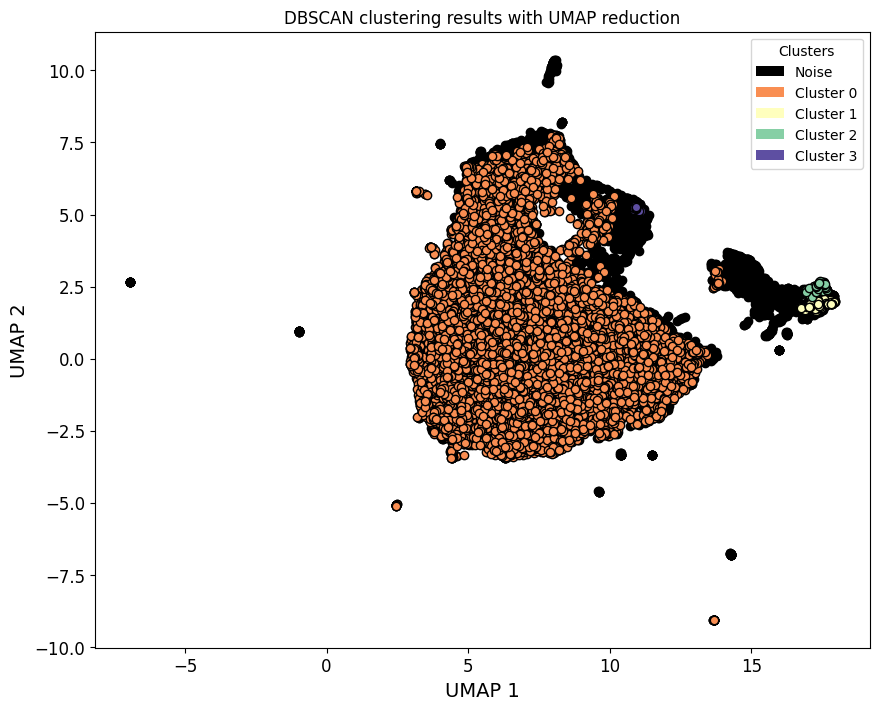

In [ ]:
dbscan = DBSCAN(eps=best_eps,min_samples=best_min_samples)
labels = dbscan.fit_predict(ds_clu)
plot_dbscan_with_umap(ds_clu, labels)

La distribuzione dei cluster è la seguente:

In [ ]:
unique_clusters, counts = np.unique(labels, return_counts=True)
for cluster, count in zip(unique_clusters, counts):
    print(f"Cluster {cluster}: {count} tuple")

Cluster -1: 5235 tuple
Cluster 0: 14843 tuple
Cluster 1: 94 tuple
Cluster 2: 39 tuple
Cluster 3: 20 tuple


Andiamo a verificare se almeno con il K-Means si ha un miglioramento.

##### 2.3 K-MEANS

In [ ]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=42,n_init=33).fit(ds_clu)
                for k in range(1, 21)]
inertias = [model.inertia_ for model in kmeans_per_k]

In [ ]:
inertias

[202309.99999999945,
 163831.97810355312,
 145626.04451615736,
 132060.1705759232,
 119131.6806036935,
 107915.03574297382,
 98377.43769561776,
 92395.84518323166,
 87099.75070960779,
 83572.18906855132,
 80210.72021859286,
 77701.11077978996,
 75437.7126289111,
 73383.84541486678,
 71609.7947829715,
 69785.02632907503,
 68319.08579379207,
 66876.44574467969,
 65704.57976050719,
 64610.68978669432]

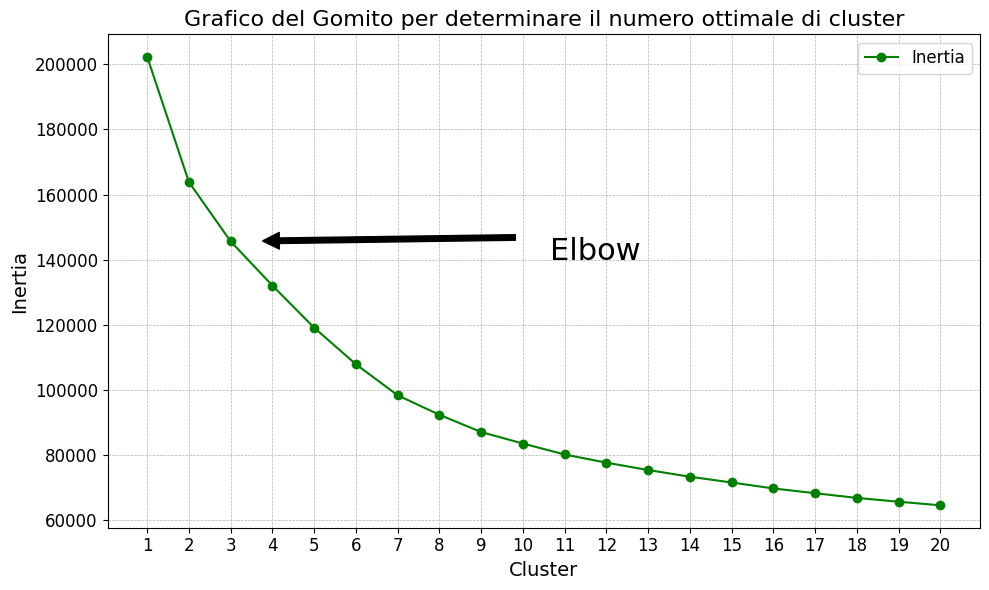

In [ ]:
plot_elbow_graph(21,inertias,type_graph="I")

Seguendo l'inerzia il numero ideale di cluster è pari a 3. Andiamo a valutare il silhouettes score di ogni modello.

In [ ]:
silhouette_scores = [silhouette_score(ds_clu, model.labels_)
                     for model in kmeans_per_k[1:]]

In [ ]:
silhouette_scores

[0.30419679701381735,
 0.20143148734385632,
 0.19773510250788223,
 0.19278123928396793,
 0.16816624201591027,
 0.17457308213069866,
 0.16426864392636928,
 0.16731266496498753,
 0.15514628869656755,
 0.15979525410193504,
 0.15412896505627566,
 0.14824606776387036,
 0.1457005101555813,
 0.13944619788156498,
 0.14171177337002477,
 0.13753805083031573,
 0.13460488467552412,
 0.1320077700036453,
 0.13373937019671472]

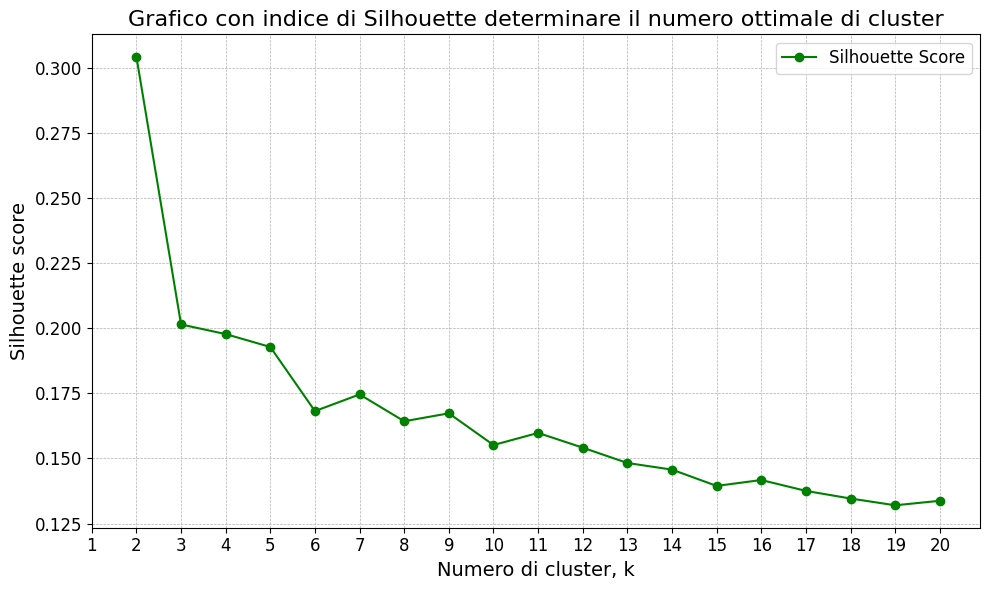

In [ ]:
plot_elbow_graph(21,silhouette_scores,"S")

Da questo grafico notiamo in primis un valore massimo di silhouettes molto inferiore a quello trovato nelle strade precedenti. Concludiamo pure qui questa strada.

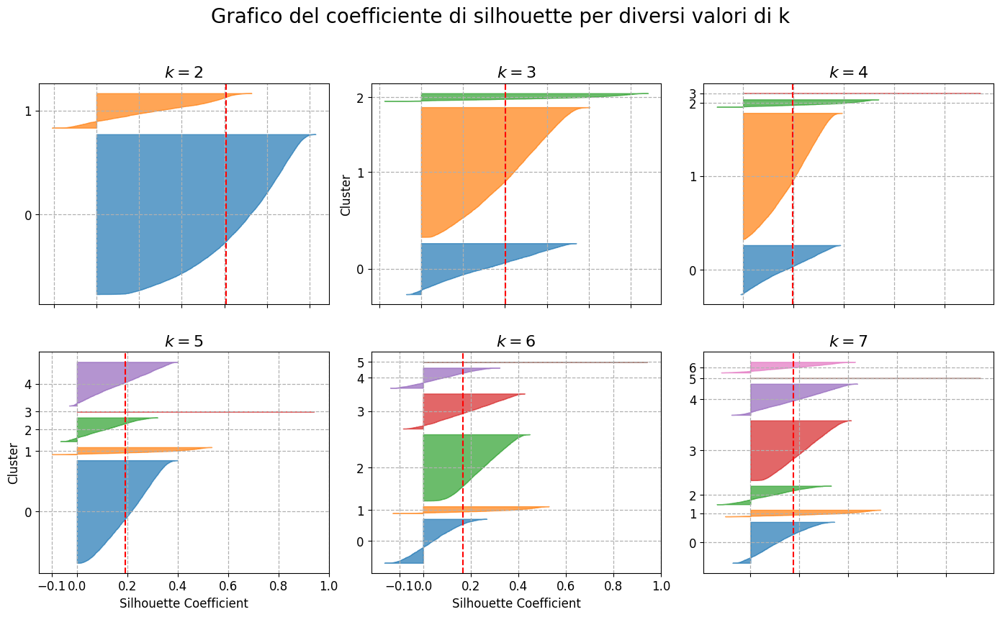

In [ ]:
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter

plt.figure(figsize=(14, 12))

for k in (2, 3, 4, 5, 6, 7):
    plt.subplot(3, 3, k-1)

    y_pred = kmeans_per_k[k - 1].labels_
    silhouette_coefficients = silhouette_samples(ds_clu, y_pred)

    padding = len(ds_clu) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.tab10(i % 10)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    if k in (3, 5):
        plt.ylabel("Cluster", fontsize=12)

    if k in (5, 6):
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("Silhouette Coefficient", fontsize=12)
    else:
        plt.tick_params(labelbottom=False)

    plt.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
    plt.title("$k={}$".format(k), fontsize=16)

    plt.grid(True, which='both', linestyle='--', linewidth=0.9)

plt.subplots_adjust(hspace=1, wspace=0.4)
plt.suptitle("Grafico del coefficiente di silhouette per diversi valori di k", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## Task 2 Classificazione


Il task di classificazione si propone di determinare quanto una canzone risulta 'positiva' o 'negativa' sulla base dell'attributo *Valence*. La valence di una canzone è una misura che indica la positività o la negatività percepita dell'emozione trasmessa dalla canzone. È un concetto spesso impiegato da servizi di streaming musicale come Spotify per classificare e suggerire musica in base all'umore.

#### 2.1 Preparazione del dataset

In [ ]:
ds_cla.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20231 entries, 0 to 20230
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20231 non-null  object 
 1   Track             20231 non-null  object 
 2   Album             20231 non-null  object 
 3   Danceability      20231 non-null  float64
 4   Energy            20231 non-null  float64
 5   Loudness          20231 non-null  float64
 6   Speechiness       20231 non-null  float64
 7   Acousticness      20231 non-null  float64
 8   Instrumentalness  20231 non-null  float64
 9   Liveness          20231 non-null  float64
 10  Valence           20231 non-null  float64
 11  Tempo             20231 non-null  float64
 12  Duration_ms       20231 non-null  float64
 13  Views             20231 non-null  float64
 14  Likes             20231 non-null  float64
 15  Comments          20231 non-null  float64
 16  Licensed          20231 non-null  object

In [ ]:
ds_cla.describe()

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Stream,AlbumC,CompilationC,SingleC
count,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,20231.000000,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,2.023100e+04,20231.000000,20231.000000,20231.000000
mean,0.620725,0.635388,-7.653818,0.096148,0.288844,0.055336,0.191443,0.529750,120.705482,2.249555e+05,9.400663e+07,6.638588e+05,2.753992e+04,1.368912e+08,0.721862,0.037962,0.240176
std,0.164346,0.213340,4.598290,0.110208,0.285800,0.191705,0.165339,0.245271,29.386578,1.255742e+05,2.747473e+08,1.786842e+06,1.928412e+05,2.425447e+08,0.448093,0.191108,0.427201
min,0.053200,0.000020,-46.251000,0.022000,0.000001,0.000000,0.014500,0.000000,37.114000,3.098500e+04,0.000000e+00,0.000000e+00,0.000000e+00,6.574000e+03,0.000000,0.000000,0.000000
25%,0.519000,0.508000,-8.824000,0.035700,0.043750,0.000000,0.094000,0.339000,97.008500,1.803700e+05,1.836305e+06,2.183200e+04,5.160000e+02,1.836076e+07,0.000000,0.000000,0.000000
50%,0.638000,0.666000,-6.537000,0.050500,0.190000,0.000002,0.125000,0.537000,119.966000,2.134280e+05,1.452832e+07,1.263780e+05,3.335000e+03,5.282679e+07,1.000000,0.000000,0.000000
75%,0.741000,0.797000,-4.939000,0.103000,0.471000,0.000476,0.234000,0.726000,139.931500,2.524335e+05,7.045222e+07,5.307870e+05,1.466500e+04,1.359422e+08,1.000000,0.000000,0.000000
max,0.975000,1.000000,0.920000,0.964000,0.996000,0.995000,1.000000,0.993000,243.372000,4.676058e+06,8.079649e+09,5.078865e+07,1.608314e+07,3.386520e+09,1.000000,1.000000,1.000000


Per procedere con la classificazione si decide di discretizzare l'attributo Valence. All'interno del dataset questa variabile assume valori compresi tra 0 e 1. Secondo alcuni studi è ragionevole utilizzare un valore soglia di 0.5 per distinguere tra canzoni con valence negativa e positiva. In generale:

- Canzoni con valence < 0.5 possono essere considerate come trasmettenti emozioni più negative o cupe.
- Canzoni con valence >= 0.5 possono essere considerate come trasmettenti emozioni più positive o gioiose.

Si decide dunque di utilizzare un valore di threshold per individuare le canzoni allegre e le canzoni tristi. Attraverso questa manipolaizone delle feature si ottengono le etichette rispetto alle quali effettuare classificazione binaria.

In [ ]:
threshold_valence = 0.5

In [ ]:
ds_cla['Target'] = ds_cla['Valence'].apply(lambda x: 1 if x > threshold_valence else 0)

In [ ]:
ds_cla.head()

,Artist,Track,Album,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,...,Duration_ms,Views,Likes,Comments,Licensed,Stream,AlbumC,CompilationC,SingleC,Target
0,Gorillaz,Feel Good Inc.,Demon Days,0.818,0.705,-6.679,0.1770,0.008360,0.002330,0.6130,...,222640.0,693555221.0,6220896.0,169907.0,True,1.040235e+09,1.0,0.0,0.0,1
1,Gorillaz,Rhinestone Eyes,Plastic Beach,0.676,0.703,-5.815,0.0302,0.086900,0.000687,0.0463,...,200173.0,72011645.0,1079128.0,31003.0,True,3.100837e+08,1.0,0.0,0.0,1
2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),0.695,0.923,-3.930,0.0522,0.042500,0.046900,0.1160,...,215150.0,8435055.0,282142.0,7399.0,True,6.306347e+07,0.0,0.0,1.0,1
3,Gorillaz,On Melancholy Hill,Plastic Beach,0.689,0.739,-5.810,0.0260,0.000015,0.509000,0.0640,...,233867.0,211754952.0,1788577.0,55229.0,True,4.346636e+08,1.0,0.0,0.0,1
4,Gorillaz,Clint Eastwood,Gorillaz,0.663,0.694,-8.627,0.1710,0.025300,0.000000,0.0698,...,340920.0,618480958.0,6197318.0,155930.0,True,6.172597e+08,1.0,0.0,0.0,1


Il numero di tuple con etichetta 1 (positive) e etichetta 0 (negative) permette di stabilire che il dataset, rispetto all'etichetta di rifeimento, è abbastanza bilanciato per cui si procede direttamente con la classificazione.

In [ ]:
ds_cla["Target"].value_counts()

Target
1    11063
0     9168
Name: count, dtype: int64

In [ ]:
ds_cla[ds_cla["Artist"] == "Ludwig van Beethoven"]["Valence"]

1773    0.151
1774    0.118
1775    0.188
1776    0.180
1777    0.106
1778    0.339
1779    0.293
1780    0.101
1781    0.066
1782    0.284
Name: Valence, dtype: float64

Rispetto all'etichetta target, si decide di voler effettuare classificazione sulla base delle seguenti features: Danceability, Energy, Loudness, Speechiness, Acousticness, Instrumentalness, Liveness e Tempo. Le variabili di input sono utilizzate dal modello di classificazione per fare previsioni per cui è essenziale scegliere con attenzione le features che si ritiene possano essere discriminanti per determinare l'etichetta di classe. Il classificatoee dunque apprende a relazionare le caratteristiche di input con le etichette di classe attraverso l'analisi del dataset di addestramento.

Una volta selezionate le features di interesse si procede con la suddivisione del dataset in training set e test set.

In [ ]:
features = ['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness', 'Tempo']
X = ds_cla[features].copy()
y = ds_cla['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Di seguito sono riportati i risultati ottenuti utilizzando alcuni algoritmi di classificazione. Gli algoritmi di classificazione sono metodi usati per predire la classe o la categoria di appartenenza di un insieme di dati in base alle caratteristiche osservate. L'obiettivo principale di questi algoritmi è quello di costruire un modello che possa imparare dai dati di addestramento e poi essere in grado di classificare correttamente nuovi dati non visti.
Per la valutazione di tali modelli sono stati utilizzate due metriche:

### **1. Accuracy**

$ {Accuracy} = \frac{\text{TP} + \text{TN}}{\text{TP} + \text{TN} + \text{FP} + \text{FN}} $

L'accuracy rappresenta la percentuale di predizioni corrette rispetto al totale delle predizioni effettuate dal modello. È una delle metriche più semplici e dirette per valutare le prestazioni di un modello di classificazione.

### **2. F-Score**

$ F1 = 2 \cdot \frac{\text{precision} \cdot \text{recall}}{\text{precision} + \text{recall}} $

L'F-score è una metrica che combina precisione e recall di un modello di classificazione in un'unica cifra.
- Precisione: La percentuale di predizioni positive che sono corrette.
- Recall (o Sensibilità): La percentuale di istanze positive che sono state identificate correttamente dal modello.


### RandomForest Classifier

Il primo modello che si vuole valutare è il `RandomForestClassifier`.

Un RandomForestClassifier combina diversi alberi decisionali, ognuno dei quali viene addestrato su un sottoinsieme casuale dei dati di addestramento e con un sottoinsieme casuale delle caratteristiche (features). Questa tecnica è nota come bagging (bootstrap aggregating).

Ogni albero decisionale nel Random Forest è costruito utilizzando un campionamento casuale dei dati di addestramento. Questo aiuta a introdurre casualità e diversità tra gli alberi, riducendo il rischio di overfitting rispetto a un singolo albero decisionale.

Quando si effettua una predizione, il RandomForestClassifier prende in considerazione le predizioni di tutti gli alberi decisionali nell'ensemble e restituisce la classe più frequentemente predetta (votazione a maggioranza).


In [ ]:
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)
y_randomforest = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_randomforest)
print(classification_report(y_test, y_randomforest))
print(f'Accuracy: {accuracy}')
print(f'F1-score: {f1_score(y_test, y_randomforest)}')

              precision    recall  f1-score   support

           0       0.74      0.70      0.72      2725
           1       0.76      0.80      0.78      3345

    accuracy                           0.75      6070
   macro avg       0.75      0.75      0.75      6070
weighted avg       0.75      0.75      0.75      6070

Accuracy: 0.7527182866556837
F1-score: 0.7807799036074192


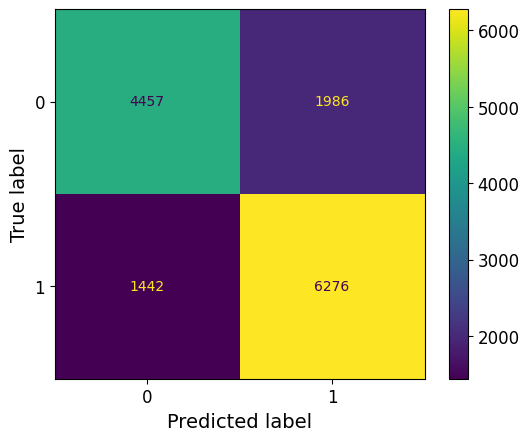

In [ ]:
y_train_pred = cross_val_predict(clf, X_train, y_train, cv=5)
ConfusionMatrixDisplay(confusion_matrix(y_train, y_train_pred)).plot()

* Cella in alto a sinistra (True Negative - TN): Numero di esempi correttamente classificati come classe 0. Valore: 4457
* Cella in alto a destra (False Positive - FP): Numero di esempi della classe 0 classificati erroneamente come classe 1. Valore: 1986
* Cella in basso a sinistra (False Negative - FN): Numero di esempi della classe 1 classificati erroneamente come classe 0. Valore: 1442
* Cella in basso a destra (True Positive - TP): Numero di esempi correttamente classificati come classe 1. Valore: 6276

In base alle informazioni indicate dalla matrice di confusione, possiamo concludere che il modello ha una buona accuratezza, una discreta precisione $(TP/(TP + FP))$ e un buona recall $(TP/(TP + FN))$.


Con la Grid Search, è possibile ottimizzare i parametri del RandomForestClassifier per ottenere le migliori prestazioni possibili. La Grid Search è una tecnica di ricerca esaustiva che esplora diverse combinazioni di parametri specificati, valutando ciascuna combinazione attraverso la cross-validation per determinare quale combinazione fornisce le migliori prestazioni.

In particolare si sceglie una griglia che permette di valutare le prestaziuoni facendo variare i seguenti parametri:
- n_estimators: numero di alberi nella foresta.
- max_depth: massima profondità di ciascun albero decisionale nella foresta.
- min_samples_split: numero minimo di campioni richiesti per suddividere un nodo interno dell'albero.
- min_samples_leaf: numero minimo di campioni richiesti per essere in un nodo foglia dell'albero.


In [ ]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
scoring = {"Accuracy": make_scorer(accuracy_score),"F1":make_scorer(f1_score)}
grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5, scoring=scoring, refit="Accuracy")
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]},
             refit='Accuracy',
             scoring={'Accuracy': make_scorer(accuracy_score),
                      'F1': make_scorer(f1_score)})

In [ ]:
y_rfc = grid_search.predict(X_test)

In [ ]:
print(f'Best parameters found: {grid_search.best_params_}')
print(f'Accuracy: {accuracy_score(y_test, y_rfc)}')
print(f'F1-score: {f1_score(y_test, y_rfc)}')
print(f'Best cross-validation score: {grid_search.best_score_}')
print(classification_report(y_test, y_rfc))

Best parameters found: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Accuracy: 0.757166392092257
F1-score: 0.7866242038216561
Best cross-validation score: 0.7590566736664932
              precision    recall  f1-score   support

           0       0.75      0.69      0.72      2725
           1       0.76      0.81      0.79      3345

    accuracy                           0.76      6070
   macro avg       0.76      0.75      0.75      6070
weighted avg       0.76      0.76      0.76      6070



Grazie alla Grid Search è possibile determinare gli iper parametri che portano ad avere le migliori prestazioni.

### Naive Bayes Classifier

Il secondo modello che si va a costruire sfrutta il GaussianNB ovvero il Gaussian Naive Bayes, un algoritmo di machine learning utilizzato per compiti di classificazione. Si basa sul teorema di Bayes con l'assunzione "naive" di indipendenza tra ogni coppia di caratteristiche (ovvero, tutte le caratteristiche sono considerate indipendenti condizionalmente rispetto all'etichetta di classe).

Durante l'addestramento, GaussianNB stima la media e la deviazione standard delle caratteristiche per ogni classe. Per predire la classe di un nuovo punto dati, GaussianNB calcola la probabilità che il punto dati appartenga a ciascuna classe utilizzando il teorema di Bayes e sceglie la classe con la probabilità più alta.

Una forte limitazione del classificatore è che assume l'indipendenza tra le caratteristiche, il che potrebbe non essere vero.


In [ ]:
from sklearn.naive_bayes import GaussianNB
nbc = GaussianNB()
nbc.fit(X_train, y_train)
y_nbc = nbc.predict(X_test)

print(classification_report(y_test, y_nbc))
print(f'Accuracy: {accuracy_score(y_test, y_nbc)}')
print(f'F1-score: {f1_score(y_test, y_nbc)}')

              precision    recall  f1-score   support

           0       0.70      0.37      0.48      2725
           1       0.63      0.87      0.73      3345

    accuracy                           0.64      6070
   macro avg       0.66      0.62      0.60      6070
weighted avg       0.66      0.64      0.62      6070

Accuracy: 0.643822075782537
F1-score: 0.7292084168336673


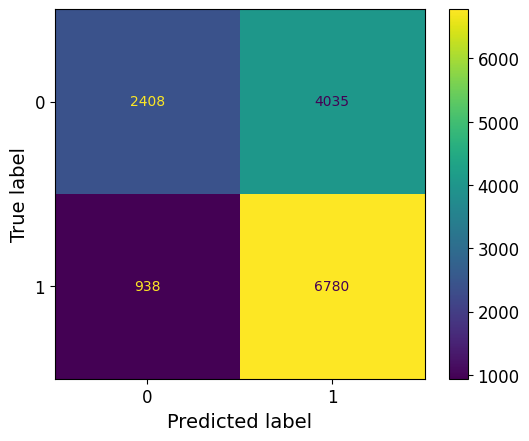

In [ ]:
y_train_pred = cross_val_predict(nbc, X_train, y_train, cv=5)
ConfusionMatrixDisplay(confusion_matrix(y_train, y_train_pred)).plot()

* Cella in alto a sinistra (True Negative - TN): Numero di esempi correttamente classificati come classe 0. Valore: 2408
* Cella in alto a destra (False Positive - FP): Numero di esempi della classe 0 classificati erroneamente come classe 1. Valore: 4035
* Cella in basso a sinistra (False Negative - FN): Numero di esempi della classe 1 classificati erroneamente come classe 0. Valore: 938
* Cella in basso a destra (True Positive - TP): Numero di esempi correttamente classificati come classe 1. Valore: 6780

Il classificatore ha prestazioni leggermente inferiori rispetto al caso precedente, soprattutto nel caso dei TN.
Si procede facendo variare gli iperparametri del classificatore in modo da poter ottenere risultati migliori

In [ ]:
scoring = {"Accuracy": make_scorer(accuracy_score),"F1":make_scorer(f1_score)}
param_grid = {'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1]}

grid_search = GridSearchCV(estimator=GaussianNB(), param_grid=param_grid, cv=10, scoring=scoring, refit= "Accuracy")
grid_search.fit(X_train, y_train)

y_nbc = grid_search.predict(X_test)

print(f'Best parameters found: {grid_search.best_params_}')

Best parameters found: {'var_smoothing': 1e-09}


La Grid Search sul parametro var_smoothing del modello non permette di individuare un classificatore migliore rispetto a quello di default.

### Support Vector Classifier

Il terzo modello che si va a realizzare sfrutta un classificatore SVM (Support Vector Machine) utilizzando il kernel RBF (Radial Basis Function) con un valore di gamma calcolato in base alla varianza dei dati di addestramento.

Questo kernel mappa i dati in uno spazio delle feature di dimensioni superiori in cui la separazione lineare delle classi può essere più semplice.



In [ ]:
svc = SVC(kernel='rbf', gamma='scale')
svc.fit(X_train, y_train)
y_svc = svc.predict(X_test)
print(classification_report(y_test, y_svc))
print(f'Accuracy: {accuracy_score(y_test, y_svc)}')
print(f'F1-score: {f1_score(y_test, y_svc)}')

              precision    recall  f1-score   support

           0       0.68      0.17      0.28      2725
           1       0.58      0.94      0.72      3345

    accuracy                           0.59      6070
   macro avg       0.63      0.55      0.50      6070
weighted avg       0.63      0.59      0.52      6070

Accuracy: 0.5927512355848434
F1-score: 0.7167736021998167


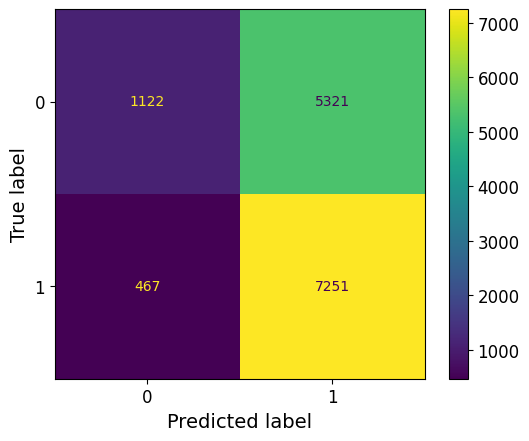

In [ ]:
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=5)
ConfusionMatrixDisplay(confusion_matrix(y_train, y_train_pred)).plot()

Anche in quesyto caso, analizzando la matrice di confusione, la classificazione non sembra ottimale. Per comprendere meglio come variano le prestazioni del classificatore al variare degli iperparametri si effettua una valutazione più approfondita usando una Grid Search.



In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

svc = SVC(kernel='rbf')

param_grid = { 'C': [0.1, 1, 10, 100],'gamma': [1e-3, 'scale', 'auto']}
scoring = {"Accuracy": make_scorer(accuracy_score),"F1":make_scorer(f1_score)}

grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=10, scoring=scoring, refit="Accuracy")
grid_search.fit(X_train, y_train)

y_svc = grid_search.best_estimator_.predict(X_test)

In [ ]:
print(f'Best parameters found: {grid_search.best_params_}')
print(f'Accuracy: {accuracy_score(y_test, y_svc)}')
print(f'F1-score: {f1_score(y_test, y_svc)}')
print(f'Best cross-validation score: {grid_search.best_score_}')
print(classification_report(y_test, y_svc))

Best parameters found: {'C': 100, 'gamma': 0.001}
Accuracy: 0.6986820428336079
F1-score: 0.7556446225784904
Best cross-validation score: 0.6981850232647154
              precision    recall  f1-score   support

           0       0.73      0.52      0.61      2725
           1       0.68      0.85      0.76      3345

    accuracy                           0.70      6070
   macro avg       0.71      0.68      0.68      6070
weighted avg       0.71      0.70      0.69      6070



In [ ]:
svc = SVC(kernel='rbf', gamma=0.001, C=100)
svc.fit(X_train, y_train)
y_svc = svc.predict(X_test)
print(classification_report(y_test, y_svc))
print(f'Accuracy: {accuracy_score(y_test, y_svc)}')
print(f'F1-score: {f1_score(y_test, y_svc)}')

              precision    recall  f1-score   support

           0       0.73      0.52      0.61      2725
           1       0.68      0.85      0.76      3345

    accuracy                           0.70      6070
   macro avg       0.71      0.68      0.68      6070
weighted avg       0.71      0.70      0.69      6070

Accuracy: 0.6986820428336079
F1-score: 0.7556446225784904


Rispetto al primo modello (di default), attraverso la GridSearch, si riesce a determinare un modello che presenta degli iperparametri che permettono di avere prestazioni migliori.

### K-Neighbors Classidier

Il quarto classificatore che si utilizza è un KNeighborsClassifier.

Il principio di base del K-NN è di classificare un punto dati assegnandogli l'etichetta di classe più comune tra i suoi "vicini" più prossimi nel set di addestramento. Durante la fase di addestramento, il KNeighborsClassifier memorizza semplicemente i dati di addestramento.

Non è un modello parametrico ma memorizza tutto il dataset di addestramento. Per classificare un nuovo punto dati, il classificatore trova i "K" punti più vicini nel dataset di addestramento.

La classe del punto dati di test viene determinata tramite voto a maggioranza: cioè, la classe più comune tra i suoi vicini più prossimi determina la classe predetta per il punto di test.


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=100)
knn.fit(X_train, y_train)
y_knn = knn.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_knn)}')
print(classification_report(y_test, y_knn))
print(f'F1-score: {f1_score(y_test, y_knn)}')

Accuracy: 0.6093904448105436
              precision    recall  f1-score   support

           0       0.60      0.39      0.47      2725
           1       0.61      0.79      0.69      3345

    accuracy                           0.61      6070
   macro avg       0.61      0.59      0.58      6070
weighted avg       0.61      0.61      0.59      6070

F1-score: 0.6890491803278689


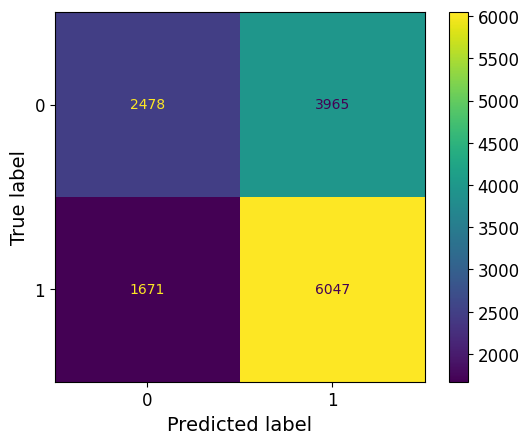

In [ ]:
y_train_pred = cross_val_predict(knn, X_train, y_train, cv=5)
ConfusionMatrixDisplay(confusion_matrix(y_train, y_train_pred)).plot()

Per valutare al meglio il classificatore e individuare gli iperparametri che portano ad ottenere il modello migliore si sfrutta una Grid Search. All’interno della griglia vengono specificati divesri parametri tra cui:
- K: Il numero di vicini più prossimi da considerare durante la classificazione.
- Metrica di Distanza: La funzione di distanza utilizzata per calcolare la vicinanza tra i punti dati.
- Pesi dei Vicini: Opzionalmente, è possibile specificare pesi diversi per i vicini in base alla loro distanza.



In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, f1_score

param_grid = {
    'n_neighbors': [3, 5, 10, 20, 50, 100],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

best_knn = grid_search.best_estimator_
y_knn = best_knn.predict(X_test)

print(f'Best Parameters: {grid_search.best_params_}')
print(f'Accuracy: {accuracy_score(y_test, y_knn)}')
print(classification_report(y_test, y_knn))
print(f'F1-score: {f1_score(y_test, y_knn)}')


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best Parameters: {'metric': 'manhattan', 'n_neighbors': 100, 'weights': 'distance'}
Accuracy: 0.657001647446458
              precision    recall  f1-score   support

           0       0.69      0.43      0.53      2725
           1       0.64      0.84      0.73      3345

    accuracy                           0.66      6070
   macro avg       0.67      0.64      0.63      6070
weighted avg       0.66      0.66      0.64      6070

F1-score: 0.7304505437597101


Attrvaerso la Grid Search si riesce ad ottenere un classificatore che presenta indici di valutazione nettamente migliori, utilizzando la manhattan distance come misura per il calcolo della distanza tra oggetti e un numeor di 100 vicini per effettuare classificazione.

### Logistic Regression Classifier

Il quinto e ultimo classificatore corrisponde ad un LogisticRegression classifier. La LogisticRegression utilizza una funzione logistica (sigmoid) per stimare la probabilità che un dato punto appartenga a una classe specifica.
La funzione sigmoidale è definita come:

$σ(z)= \frac{1}{1 + e^{-z}}$

dove $z= \theta_0 + \theta_1 x_1 + \theta_2 x_2 + \ldots + \theta_n x_n $ è la combinazione lineare dei pesi dei coefficienti $θ$ e delle feature.

Durante la fase di addestramento, la LogisticRegression cerca di ottimizzare i pesi θ in modo da massimizzare la likelihood (massimizzazione della probabilità) dei dati di addestramento.


In [ ]:
from sklearn.linear_model import LogisticRegression

logit = LogisticRegression(max_iter=500,random_state=42)
logit.fit(X_train, y_train)
y_logit = logit.predict(X_test)
print(classification_report(y_test, y_logit))
print(f'Accuracy: {accuracy_score(y_test, y_logit)}')
print(f'F1-score: {f1_score(y_test, y_logit)}')

              precision    recall  f1-score   support

           0       0.70      0.61      0.65      2725
           1       0.71      0.79      0.75      3345

    accuracy                           0.71      6070
   macro avg       0.71      0.70      0.70      6070
weighted avg       0.71      0.71      0.71      6070

Accuracy: 0.7092257001647446
F1-score: 0.7493253799176254


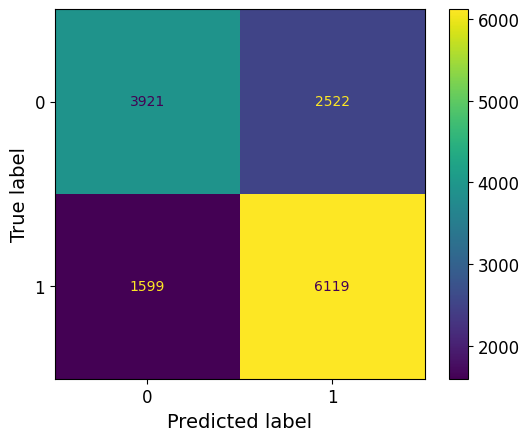

In [ ]:
y_train_pred = cross_val_predict(logit, X_train, y_train, cv=5)
ConfusionMatrixDisplay(confusion_matrix(y_train, y_train_pred)).plot()

Le prestazioni, rispetto agli altri modelli, sono leggermente migliori.

Si procede con la Grid Search.
La Grid Search permette di introdurre anche un parametro di regolarizzazione: la LogisticRegression di solito include un termine di regolarizzazione per controllare la complessità del modello e prevenire l'overfitting. I tipi di regolarizzazione comunemente utilizzati sono L1 (lasso) e L2 (ridge), controllati dal parametro penalty.

In [ ]:
from sklearn.linear_model import LogisticRegression

param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l2'],
    'max_iter': [100, 200, 500, 1000]
}
logit = LogisticRegression(random_state=42)
scoring = {"Accuracy": make_scorer(accuracy_score),"F1":make_scorer(f1_score)}

grid_search = GridSearchCV(logit, param_grid, cv=10, scoring=scoring, refit="Accuracy")
grid_search.fit(X_train, y_train)
y_logit = grid_search.predict(X_test)

In [ ]:
print(f'Best parameters found: {grid_search.best_params_}')
print(f'Accuracy: {accuracy_score(y_test, y_logit)}')
print(f'F1-score: {f1_score(y_test, y_logit)}')
print(f'Best cross-validation score: {grid_search.best_score_}')
print(classification_report(y_test, y_logit))

Best parameters found: {'C': 1, 'max_iter': 500, 'penalty': 'l2'}
Accuracy: 0.6986820428336079
F1-score: 0.7556446225784904
Best cross-validation score: 0.7096943789895898
              precision    recall  f1-score   support

           0       0.73      0.52      0.61      2725
           1       0.68      0.85      0.76      3345

    accuracy                           0.70      6070
   macro avg       0.71      0.68      0.68      6070
weighted avg       0.71      0.70      0.69      6070



### Voting Classifier

L'Ensemble Learning è una tecnica che combina più modelli (chiamati "learners" o "base models") per migliorare le prestazioni predittive rispetto a singoli modelli. Il concetto alla base è che l'aggregazione di più modelli diversi può portare a predizioni più accurate e generalizzabili. Ci sono diversi approcci di ensemble learning, tra cui il Voting Classifier.

Il Voting classifier prevede le seguenti fasi:
-	Selezione di diversi modelli di machine learning (ad esempio SVM, Random Forest, Logistic Regression) con diverse configurazioni di iperparametri.
•	Previsione della classe: durante la fase di predizione, ciascun modello di base fornisce una previsione per un dato punto. Nel caso di classificazione, la previsione può essere fatta utilizzando la maggioranza dei voti tra i modelli di base (votazione rigida) o utilizzando pesi per ciascun modello basati sulla loro performance (votazione morbida).

La differenza principale tra hard voting e soft voting riguarda il modo in cui vengono combinati i risultati predittivi dei modelli di base in un Voting Classifier:
- Nel hard voting, i risultati predittivi di diversi modelli di base vengono semplicemente conteggiati. La classe predetta è quella che riceve la maggioranza assoluta dei voti dai modelli di base.

- Nel soft voting, anziché considerare solo la classe predetta, si considerano anche le probabilità predette dai modelli di base. La classe predetta è quella con la probabilità media più alta tra i modelli di base.



#### Soft Voting

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier


log_best = LogisticRegression(C=1,max_iter=500,penalty='l2', random_state=42)
rnd_best = RandomForestClassifier(max_depth= 20, min_samples_leaf = 1, min_samples_split= 5, n_estimators =200, random_state=42)
svm_best = SVC(C = 100, gamma=0.001,probability=True)
knn_best = KNeighborsClassifier(n_neighbors=100,weights='distance',metric='manhattan')
nbc_best = GaussianNB(var_smoothing = 1e-09)

voting_clf = VotingClassifier(
    estimators=[('logit', log_best), ('rfc', rnd_best), ('svc', svm_best), ('knn',knn_best),('nbc',nbc_best)],
    voting='soft')
voting_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('logit',
                              LogisticRegression(C=1, max_iter=500,
                                                 random_state=42)),
                             ('rfc',
                              RandomForestClassifier(max_depth=20,
                                                     min_samples_split=5,
                                                     n_estimators=200,
                                                     random_state=42)),
                             ('svc', SVC(C=100, gamma=0.001, probability=True)),
                             ('knn',
                              KNeighborsClassifier(metric='manhattan',
                                                   n_neighbors=100,
                                                   weights='distance')),
                             ('nbc', GaussianNB())],
                 voting='soft')

In [ ]:
from sklearn.metrics import accuracy_score

for clf in (log_best, rnd_best, svm_best, knn_best,nbc_best,voting_clf):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(clf.__class__.__name__, f"Accuracy: {accuracy_score(y_test, y_pred)}")

LogisticRegression Accuracy: 0.7092257001647446
LogisticRegression F1: 0.7493253799176254
RandomForestClassifier Accuracy: 0.757166392092257
RandomForestClassifier F1: 0.7866242038216561
SVC Accuracy: 0.7174629324546952
SVC F1: 0.7636113025499656
KNeighborsClassifier Accuracy: 0.6701812191103789
KNeighborsClassifier F1: 0.7342713034244757
GaussianNB Accuracy: 0.643822075782537
GaussianNB F1: 0.7292084168336673
VotingClassifier Accuracy: 0.7248764415156508
VotingClassifier F1: 0.7724175524666121


#### Hard Voting

In [ ]:
log_best = LogisticRegression(C=1,max_iter=500,penalty='l2', random_state=42)
rnd_best = RandomForestClassifier(max_depth= 20, min_samples_leaf = 1, min_samples_split= 5, n_estimators =200, random_state=42)
svm_best = SVC(C = 100, gamma=0.001,probability=True)
knn_best = KNeighborsClassifier(n_neighbors=100,weights='distance',metric='manhattan')
nbc_best = GaussianNB(var_smoothing = 1e-09)

voting_clf = VotingClassifier(
    estimators=[('logit', log_best), ('rfc', rnd_best), ('svc', svm_best), ('knn',knn_best),('nbc',nbc_best)],
    voting='hard')
voting_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('logit',
                              LogisticRegression(C=1, max_iter=500,
                                                 random_state=42)),
                             ('rfc',
                              RandomForestClassifier(max_depth=20,
                                                     min_samples_split=5,
                                                     n_estimators=200,
                                                     random_state=42)),
                             ('svc', SVC(C=100, gamma=0.001, probability=True)),
                             ('knn',
                              KNeighborsClassifier(metric='manhattan',
                                                   n_neighbors=100,
                                                   weights='distance')),
                             ('nbc', GaussianNB())])

In [ ]:
model_scores = {}
model_f1 = {}

for clf in (log_best, rnd_best, svm_best, knn_best,nbc_best,voting_clf):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    if clf != voting_clf:
      model_scores[f"{clf.__class__.__name__}"] = accuracy_score(y_test, y_pred)
      model_f1[f"{clf.__class__.__name__}"] = f1_score(y_test, y_pred)
    print(clf.__class__.__name__, accuracy_score(y_test, y_pred))

LogisticRegression 0.7092257001647446
RandomForestClassifier 0.757166392092257
SVC 0.7174629324546952
KNeighborsClassifier 0.6701812191103789
GaussianNB 0.643822075782537
VotingClassifier 0.7248764415156508


I risultati prodotti dai due algoritmi di Voting sembrano concordi a livello di prestazioni. Ciò è indice di alta conformità tra modelli per cui i modelli di base hanno raggiunto un alto grado di concordanza nella loro capacità di classificare i dati e inoltre garantisce stabilità delle predizioni che risultano essere robuste e coerenti per quel particolare punto dati, poiché tutti i modelli concordano sulla stessa etichetta di classe.


### XGBOOST

XGBoost utilizza il concetto di boosting, un metodo di ensemble learning in cui i modelli (detti weak learners) vengono addestrati in sequenza, ciascuno dei quali cerca di correggere gli errori dei modelli precedenti.

XGBoost è basato su gradient boosting, dove il modello viene addestrato aggiungendo iterativamente nuovi modelli per ridurre il valore della funzione obiettivo (loss function). Si utilizza il gradient descent per minimizzare la funzione di perdita, migliorando così gradualmente le prestazioni del modello.


In [ ]:
try:
    import xgboost
except ImportError as ex:
    print("Error: the xgboost library is not installed.")
    xgboost = None

In [ ]:
if xgboost is not None:
    xgb_reg = xgboost.XGBClassifier(random_state=42)
    xgb_reg.fit(X_train, y_train)
    y_pred = xgb_reg.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy)
    f1 = f1_score(y_test, y_pred)
    print("F1 Score:", f1)

Accuracy: 0.7405271828665568
F1 Score: 0.7688921496698459


### Modello Migliore

Note le prestazioni dei vari classificatori è possibile stabilire quale dei classificatori risulta il migliore. Basandosi sui valori di accuracy, ma tenendo conto anche dell'F-Score, il randomForestClassifier risulta essere il classificatore migliore. Anche riconsiderando tutte i plot delle matrici di confusione, il modello basato su RFC comunque aveva indici di prestazione migliori.

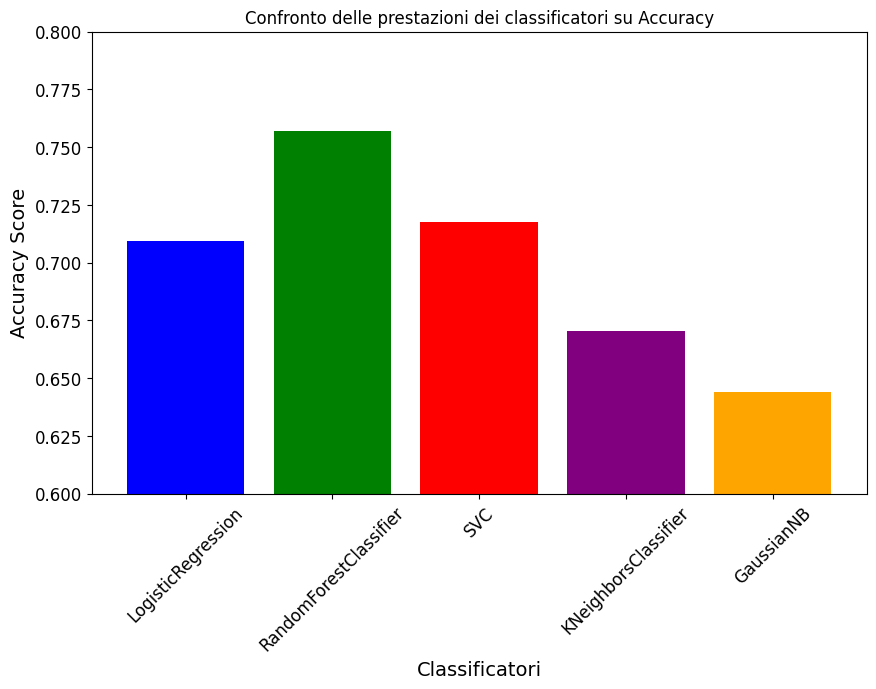

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar( list(model_scores.keys()), [model_scores[model] for model in list(model_scores.keys()) ], color=['blue', 'green', 'red', 'purple', 'orange'])
plt.xlabel('Classificatori')
plt.ylabel('Accuracy Score')
plt.title('Confronto delle prestazioni dei classificatori su Accuracy')
plt.ylim(0.6, 0.8)
plt.xticks(rotation=45)
plt.show()

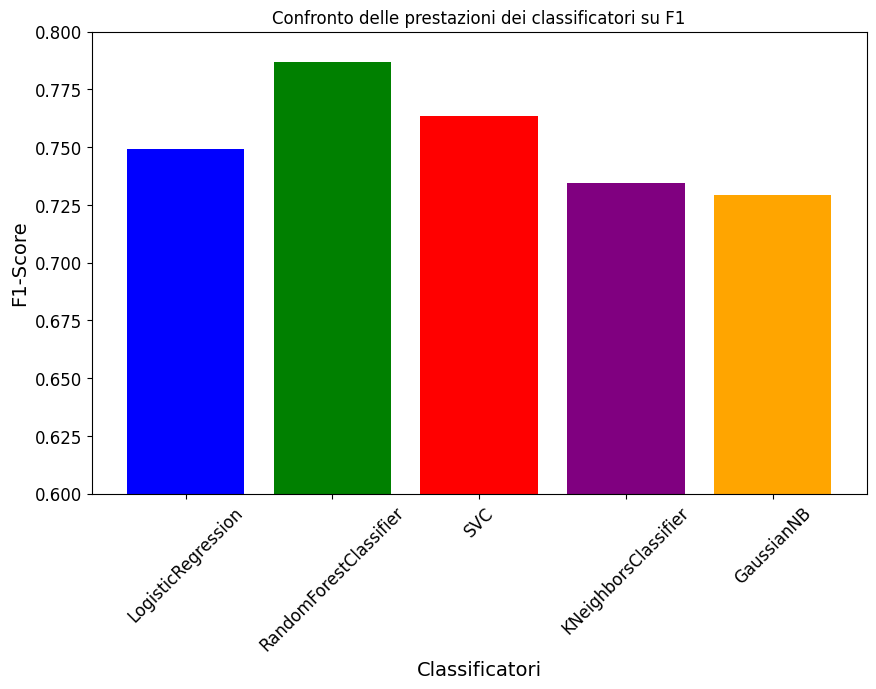

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar( list(model_f1.keys()), [model_f1[model] for model in list(model_f1.keys()) ], color=['blue', 'green', 'red', 'purple', 'orange'])
plt.xlabel('Classificatori')
plt.ylabel('F1-Score')
plt.title('Confronto delle prestazioni dei classificatori su F1')
plt.ylim(0.6, 0.8)
plt.xticks(rotation=45)
plt.show()

## Task 3 Regressione

Fare regressione sul numero di stream di una canzone serve a prevedere il successo futuro di un brano musicale e identificare tendenze e fattori di successo. Queste previsioni aiutano le case discografiche e le piattaforme di streaming a prendere decisioni informate e strategiche.

In questo caso la variabile 'Stream' presente nel dataset fa riferimento al numero di riproduzioni di una canzone sulla piattaforma Spotify.

Prima di procedere con la regressione dunque modellare e analizzare le relazioni tra la variabile target e le features  di interesse si effettua uno studio più approfondito della variabile target per comprendere come si distribuiscono i valori e soprattutto verificare la presenza di eventuali outliers che potrebbero comporomettere le stime.

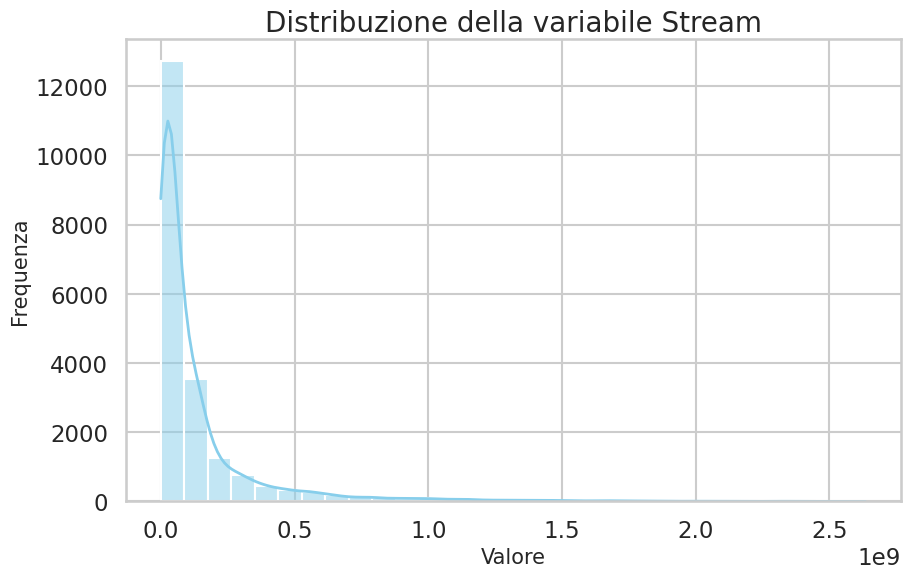

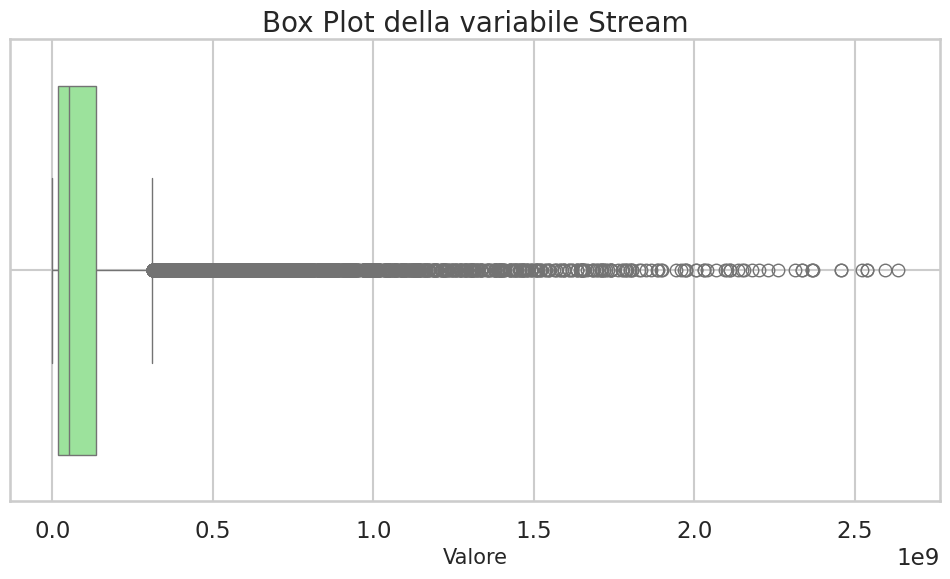

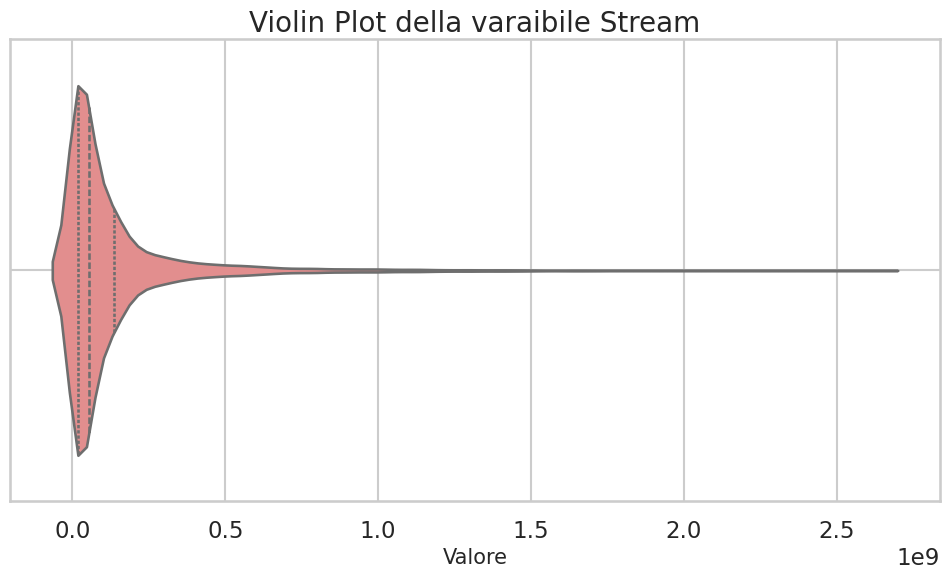

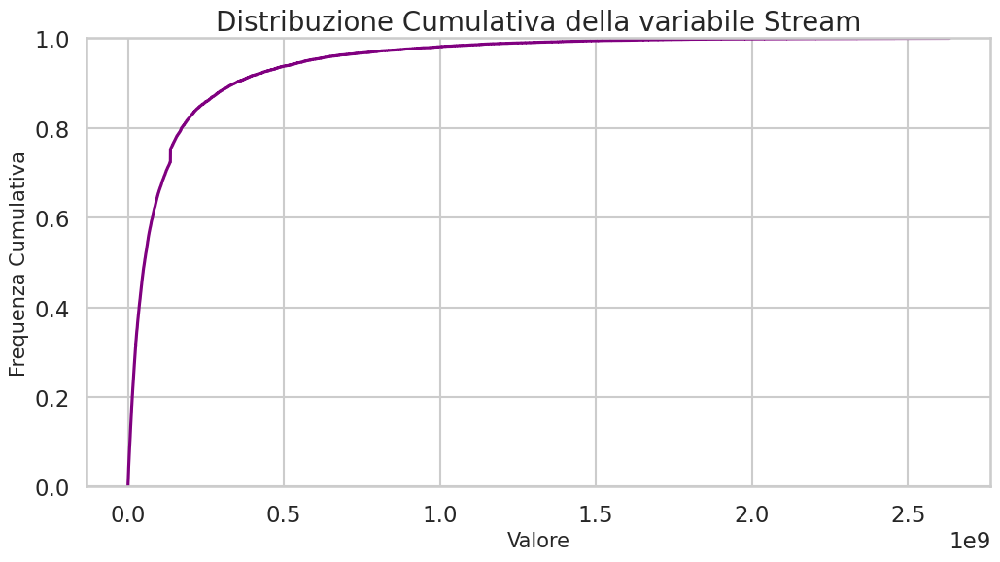

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', context='talk', palette='pastel')

plt.figure(figsize=(10, 6))
sns.histplot(ds_fin_regre['Stream'], bins=30, kde=True, color='skyblue', line_kws={'linewidth': 2})
plt.title('Distribuzione della variabile Stream', fontsize=20)
plt.xlabel('Valore', fontsize=15)
plt.ylabel('Frequenza', fontsize=15)
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x=ds_fin_regre['Stream'], color='lightgreen')
plt.title('Box Plot della variabile Stream', fontsize=20)
plt.xlabel('Valore', fontsize=15)
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
sns.violinplot(x=ds_fin_regre['Stream'], inner='quartile', color='lightcoral')
plt.title('Violin Plot della varaibile Stream', fontsize=20)
plt.xlabel('Valore', fontsize=15)
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
sns.ecdfplot(ds_fin_regre['Stream'], color='purple')
plt.title('Distribuzione Cumulativa della variabile Stream', fontsize=20)
plt.xlabel('Valore', fontsize=15)
plt.ylabel('Frequenza Cumulativa', fontsize=15)
plt.grid(True)
plt.show()


Dai grafici prodotti, si osserva che la distribuzione dei valori è fortemente asimmetrica verso destra. Questo suggerisce che la maggior parte delle canzoni ha un numero relativamente basso di stream, mentre poche canzoni hanno un numero molto alto di stream.
Questo è tipico di molte distribuzioni di popolarità, dove poche entità ottengono una grande quantità di risorse.

Nello specifico, il Box Plot risulta particolarmente indicativo e suggerisce la presenza di valori outlier che potrebbero compromettere la regressione.
Si procede dunque andando ad analizzare il valore massimo che assume la varaibile rispetto al valore medio.

In [ ]:
ds_fin_regre['Stream'].max()

2634013335.0

In [ ]:
ds_fin_regre['Stream'].mean()

136571081.0974807

Rispetto alla media, il valore massimo risulta particolarmente elevato (da 9 cifre si passa a ben 10 cifre!). La presenza di tuple con valori numerici così alti potrebbe essere un rumore e compormettere i risultati dell'algoirmo di regressione.
Si decide dunque di rimuovere le tuple con un elevato numero di riproduzioni.

In [ ]:
ds_fin_regre = ds_regre[ds_regre["Stream"]<=3e+09]

In [ ]:
ds_fin_regre.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20229 entries, 0 to 20230
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20229 non-null  object 
 1   Track             20229 non-null  object 
 2   Album             20229 non-null  object 
 3   Danceability      20229 non-null  float64
 4   Energy            20229 non-null  float64
 5   Key               20229 non-null  float64
 6   Loudness          20229 non-null  float64
 7   Speechiness       20229 non-null  float64
 8   Acousticness      20229 non-null  float64
 9   Instrumentalness  20229 non-null  float64
 10  Liveness          20229 non-null  float64
 11  Valence           20229 non-null  float64
 12  Tempo             20229 non-null  float64
 13  Duration_ms       20229 non-null  float64
 14  Views             20229 non-null  float64
 15  Likes             20229 non-null  float64
 16  Comments          20229 non-null  float64
 17

Effettuando questa operazione, sono state rimosse dal dataset 2 tuple che corrispondono alle seguenti:

In [ ]:
ds_regre[ds_regre["Stream"]>3e+09]

,Artist,Track,Album,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,...,Tempo,Duration_ms,Views,Likes,Comments,Licensed,Stream,AlbumC,CompilationC,SingleC
12177,Ed Sheeran,Shape of You,÷ (Deluxe),0.825,0.652,1.0,-3.183,0.0802,0.58100,0.000000,...,95.977,233713.0,5.908398e+09,31047780.0,1130327.0,True,3.362005e+09,1.0,0.0,0.0
14881,The Weeknd,Blinding Lights,After Hours,0.514,0.730,1.0,-5.934,0.0598,0.00146,0.000095,...,171.005,200040.0,6.741645e+08,8817927.0,282589.0,True,3.386520e+09,1.0,0.0,0.0


A questo punto si procede rimuovendo dal dataset le features che non si ritiene siano esplicative nel modellare il fenomeno di interesse. In particolare si decide di rimuovere 'Artist', 'Track' e 'Album' in quanto identificativi della canzone e non influenti sulle caratteristiche musicali mentre 'Licensed' è un attributo che fa riferimento al video clip su youtube e non alla popolarità.

Infine si decide di non considerare l'attributo 'Key' in quanto la chiave potrebbe essere un dettaglio tecnico meno percepito dalla maggioranza degli ascoltatori. A differenza della chiave musicale, invece, gli altri attributi che caratterizzano le emozioni trasmesse attraverso la melodia, l'arrangiamento e il testo possono avere un impatto più forte sulla popolarità di una canzone. Proprio per questo motivo si decide di mantenere solo queste features come variabili indipendneti esplicative del fenomeno.


In [ ]:
X = ds_fin_regre.copy()
X.reset_index(inplace=True)
X = ds_fin_regre.drop(columns=["Artist","Track","Album","Licensed","Key"],inplace=False)
X.reset_index(inplace=True)
X.drop(columns="index",inplace=True)

Dopo aver selezionato le features di interesse si procede con la rimozione di eventuali duplicati.

In [ ]:
X.drop_duplicates(keep='first',inplace=True)

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19975 entries, 0 to 20228
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Danceability      19975 non-null  float64
 1   Energy            19975 non-null  float64
 2   Loudness          19975 non-null  float64
 3   Speechiness       19975 non-null  float64
 4   Acousticness      19975 non-null  float64
 5   Instrumentalness  19975 non-null  float64
 6   Liveness          19975 non-null  float64
 7   Valence           19975 non-null  float64
 8   Tempo             19975 non-null  float64
 9   Duration_ms       19975 non-null  float64
 10  Views             19975 non-null  float64
 11  Likes             19975 non-null  float64
 12  Comments          19975 non-null  float64
 13  Stream            19975 non-null  float64
 14  AlbumC            19975 non-null  float64
 15  CompilationC      19975 non-null  float64
 16  SingleC           19975 non-null  float64
dty

Dagli output si evince come siano stati rimosse 254 tuple. Questo perchè esistono diverse canzoni a cui hanno collaborato più artisti (featuring) e in cui l'unico attributo che varia è proprio l'artista.
Avendo rimosso la feature 'Artist' alcune tuple risultano dunque duplicate.
Rimuovere i duplicati nella regressione è importante per diversi motivi tra cui:
- Evitare la distorsione del modello: i duplicati possono distorcere le stime dei coefficienti di regressione, rendendo il modello meno accurato. Se un'osservazione è ripetuta più volte, il modello può sovrastimare la sua importanza.
- Bassa generalizzazione: i duplicati possono portare a un modello che si adatta troppo ai dati di training, riducendo la capacità del modello di
generalizzare i dati ricandendo in situazioni di overfitting.

Una volta effettuate queste operazioni preliminari si procede nel separare la matrice dei dati X dalla variabile target e nella divisione del dataset in training set e test set.

Il primo modello che si va ad utilizzare è il `RandomForestRegressor`

In [ ]:
y = X['Stream']
X.drop(columns="Stream",inplace=True)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
random_regressor = RandomForestRegressor(random_state=42)
random_regressor.fit(X_train, y_train)
y_pred = random_regressor.predict(X_test)

print(np.sqrt(mean_squared_error(y_test, y_pred)))
print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

150046798.29536647
2.2514041678690388e+16
0.6060963108777413


Per valutare il modello si utilizzano i seguenti parametri:

### **1. Root Mean Squared Error (RMSE):**


${RMSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}$

Tale indicatore corrisponde alla radice quadrata dell'errore quadratico medio. È una misura della differenza media tra i valori predetti dal modello e i valori reali.
Un valore RMSE più basso indica una migliore performance del modello. È utile perché esprime l'errore medio in unità della variabile target.


### **2. Mean Squared Error (MSE)**:

${MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$

L'errore quadratico medio è la media dei quadrati degli errori, ovvero la media dei quadrati delle differenze tra i valori reali e quelli predetti.
Un valore MSE più basso indica una migliore performance del modello. Tuttavia, poiché è in unità al quadrato della variabile target, può essere meno intuitivo da interpretare rispetto al RMSE.

### **3. R-squared (R2 Score):**

$
R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}
$

L'R^2 score, noto anche come coefficiente di determinazione, è una misura statistica che valuta la bontà di adattamento di un modello di regressione. Indica quanto bene le variazioni nei dati di input spiegano le variazioni nel target. È una metrica molto utilizzata per valutare le prestazioni dei modelli di regressione.

Rispetto al modello che è stato predetto, il valore di R2 ottenuto è indicativo di un buon modello anche se i valori degli altri indici di prestazione risultano elevati.

Si procede, a questo punto, utilizzando lo stesso algoritmo ma effettuando delle modifiche sul dataset.
Una possibile alternativa potrebbe essere quella di standardizzare la matrice in input.

In [ ]:
X2 = X.copy()

In [ ]:
X2

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,AlbumC,CompilationC,SingleC
0,0.818,0.705,-6.679,0.1770,0.008360,0.002330,0.6130,0.7720,138.559,222640.0,693555221.0,6220896.0,169907.0,1.0,0.0,0.0
1,0.676,0.703,-5.815,0.0302,0.086900,0.000687,0.0463,0.8520,92.761,200173.0,72011645.0,1079128.0,31003.0,1.0,0.0,0.0
2,0.695,0.923,-3.930,0.0522,0.042500,0.046900,0.1160,0.5510,108.014,215150.0,8435055.0,282142.0,7399.0,0.0,0.0,1.0
3,0.689,0.739,-5.810,0.0260,0.000015,0.509000,0.0640,0.5780,120.423,233867.0,211754952.0,1788577.0,55229.0,1.0,0.0,0.0
4,0.663,0.694,-8.627,0.1710,0.025300,0.000000,0.0698,0.5250,167.953,340920.0,618480958.0,6197318.0,155930.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20224,0.582,0.926,-6.344,0.0328,0.448000,0.000000,0.0839,0.6580,90.002,94667.0,71678.0,1113.0,0.0,0.0,0.0,1.0
20225,0.531,0.936,-1.786,0.1370,0.028000,0.000000,0.0923,0.6570,174.869,150857.0,164741.0,2019.0,0.0,0.0,0.0,1.0
20226,0.443,0.830,-4.679,0.0647,0.024300,0.000000,0.1540,0.4190,168.388,136842.0,35646.0,329.0,0.0,0.0,0.0,1.0
20227,0.417,0.767,-4.004,0.4190,0.356000,0.018400,0.1080,0.5390,155.378,108387.0,6533.0,88.0,0.0,0.0,0.0,1.0


In [ ]:
X2['Duration_sec'] = X2['Duration_ms'] / 1000
X2 = X2.drop(columns=['Duration_ms'])

features_to_standardize = [ 'Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness','Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Views', 'Likes', 'Comments']

scaler = StandardScaler()
X2[features_to_standardize] = scaler.fit_transform(X2[features_to_standardize])

X_train, X_test, y_train, y_test = train_test_split(X2, y, test_size=0.3, random_state=42)

Dopo aver standardizzato le feature numeriche si procede nel rieseguire l'algorimo.

In [ ]:
random_regressor = RandomForestRegressor(random_state=42)
random_regressor.fit(X_train, y_train)
y_pred = random_regressor.predict(X_test)

print(np.sqrt(mean_squared_error(y_test, y_pred)))
print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

149757640.65318373
2.2427350934008104e+16
0.6076130445069337


Osserviamo un miglioramento negli indici di valutazione per cui si decide che nel corso della trattazione successiva di utilizzare il dataset standardizzato.

Per valutare che le feature selezionate siano effettivamente significative nello spiegare la variabile target si analizza l'importance ad esse associata dal `RandomForestRegressor`

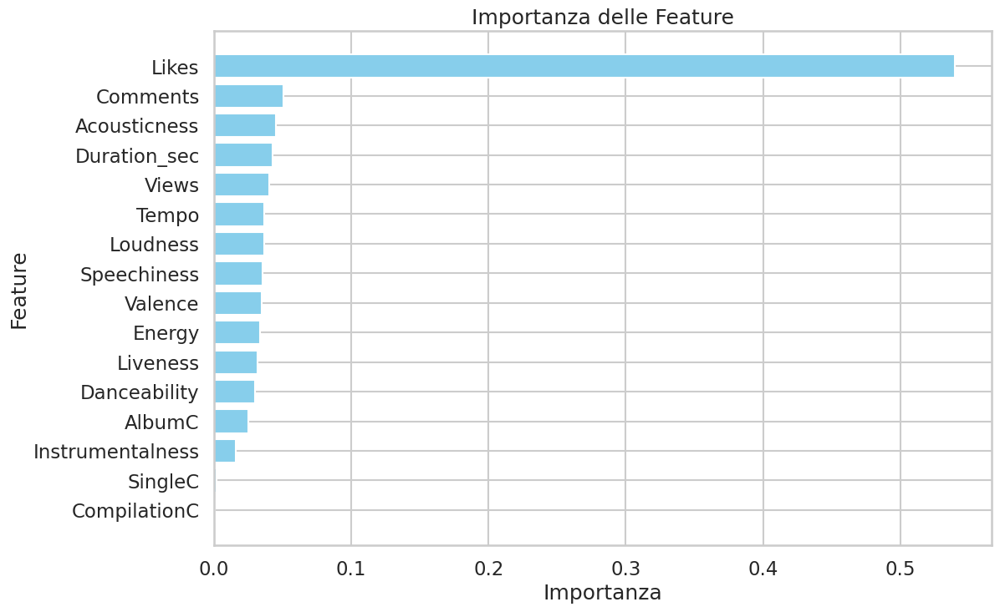

In [ ]:
importances = random_regressor.feature_importances_

features = [
    'Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness',
    'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Views', 'Likes',
    'Comments', 'AlbumC', 'CompilationC', 'SingleC', 'Duration_sec'
]

feature_importances = pd.DataFrame({'Feature': features, 'Importance': importances})

feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 8))
plt.barh(feature_importances['Feature'], feature_importances['Importance'], color='skyblue')
plt.xlabel('Importanza')
plt.ylabel('Feature')
plt.title('Importanza delle Feature')
plt.gca().invert_yaxis()
plt.show()


Il grafico, associato all'importance delle feature, evidenzia come la variabile Likes sia la feature più rilevante, con una grande differenza di impatto rispetto alle altre. Le altre features si mantengono, tuttavia, abbastanza singificative.

Rispetto al tipo di album, solo la variabile AlbumC risulta rilevante. Tuttavia si decide comunque di mantenere le altre 2 categorie proprio per riuscire a discernere tra i tipi.

Si decide di utilizzare il KNeighborsRegressor e valutare quale tra le due strategie risulta migliore per effettuare classificazione.
L'algoritmo KNN di regressione non ha una fase di addestramento vera e propria come i modelli parametrici. Invece, memorizza semplicemente l'intero set di dati di addestramento.
Per fare una predizione su un nuovo punto dati, l'algoritmo segue questi passaggi:
1. Calcola la distanza tra il nuovo punto e tutti i punti nel set di addestramento. La distanza può essere calcolata usando varie metriche, come la distanza euclidea, manhattan, ecc.
2. Seleziona i k punti di addestramento più vicini al nuovo punto  basandosi sulle distanze calcolate.
3. La predizione per il nuovo punto è la media dei valori target (valori di uscita) dei k-vicini selezionati.

L'algoritmo è facile da capire e implementare e non fa assunzioni forti sulla distribuzione dei dati.
Poichè la scelta della metrica di distanza può essere influenzata dalla scala delle caratteristiche si decide di utilizzare una Grid Search.

La regressione K-Nearest Neighbors (KNN) con Grid Search consiste nel trovare i migliori iperparametri per il modello KNN. La Grid Search esegue una ricerca esaustiva sui valori specificati degli iperparametri (come il numero di vicini, la distanza utilizzata e il metodo di pesatura), valutando ogni combinazione tramite validazione incrociata per identificare quella che ottimizza la prestazione del modello, misurata tipicamente con la Mean Squared Error (MSE).

In [ ]:
kn_regressor = KNeighborsRegressor().fit(X_train,y_train)

param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski'] }
kn_grid_search = GridSearchCV(kn_regressor, param_grid, cv=3, scoring='neg_mean_squared_error', return_train_score=True,n_jobs=-1).fit(X_train, y_train)

y_pred = kn_grid_search.best_estimator_.predict(X_test)
print(np.sqrt(mean_squared_error(y_test, y_pred)))
print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

168067057.42756143
2.8246535792359236e+16
0.5058010990507575


In [ ]:
kn_grid_search.best_params_

{'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}

I valori migliori individuati sono associati agli iperparametri evidenziati. Si sceglie dunque 9 come valore di k-vicini da considerare e la distanza di manhattan per individuare la distanza stra due tuple.

Per concludere la fase di regressione e decidere la strategia migliore per effettuare classificazione si decide di utilizzare XGBRegressor.

L'algoritmo addestra una serie di alberi di decisione in modo sequenziale. Ogni albero successivo viene addestrato per correggere gli errori commessi dagli alberi precedenti.Ogni nuovo albero viene addestrato sui residui (ossia gli errori) dell'addestramento precedente, migliorando così la capacità del modello di catturare le relazioni complesse nei dati.
L'algoritmo ottimizza una funzione di costo (come il Mean Squared Error) utilizzando il gradiente discendente. Ogni iterazione aggiunge un albero che cerca di ridurre il valore della funzione di costo.
XGBRegressor incorpora tecniche di regularizzazione (come L1 e L2) per prevenire l'overfitting, rendendo il modello più robusto.


In [ ]:
xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2]}

grid_search = GridSearchCV(estimator=xgb_regressor, param_grid=param_grid, scoring='neg_mean_squared_error', cv=10, verbose=1)
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None,...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'n_estimators': [100, 200, 300]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

y_pred_best = best_model.predict(X_test)
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))
mse_best = mean_squared_error(y_test, y_pred_best)
r2_best = r2_score(y_test, y_pred_best)

print("Best parameters:", best_params)
print("Best RMSE:", rmse_best)
print("Best MSE:", mse_best)
print("Best R^2 Score:", r2_best)

Best parameters: {'learning_rate': 0.1, 'n_estimators': 300}
Best RMSE: 153042574.31514743
Best MSE: 2.342202955300742e+16
Best R^2 Score: 0.5902102350466619


I risultati rispetto ai diversi modelli e strategie portano ad indicare il RandomForestRegressor come il miglior modello per effettuare regressione.

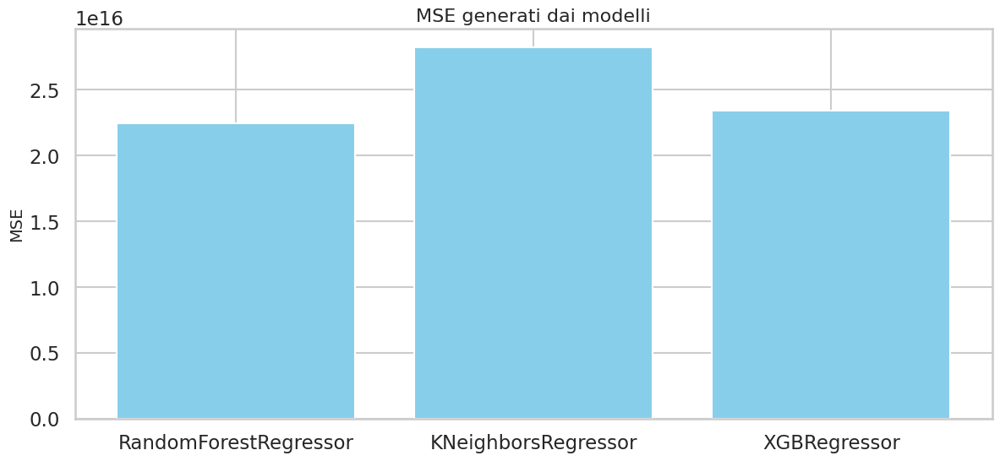

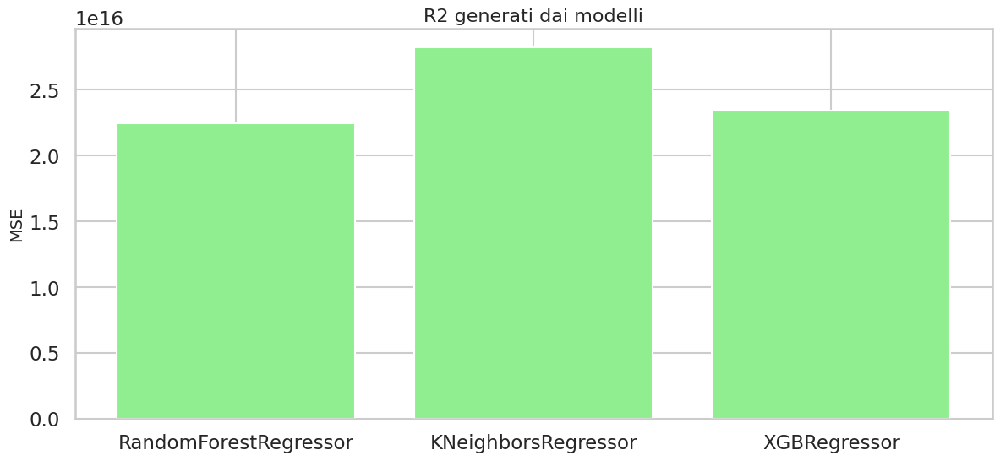

In [ ]:
ascisse = ['RandomForestRegressor', 'KNeighborsRegressor', 'XGBRegressor']
MSE = [2.2427350934008104e+16, 2.8246535792359236e+16, 2.342202955300742e+16]

plt.figure(figsize=(14, 6))
plt.bar(ascisse, MSE, color='skyblue')

plt.title('MSE generati dai modelli', fontsize=16)
plt.ylabel('MSE', fontsize=14)
plt.show()

R2 = [0.6076130445069337, 0.5058010990507575, 0.5902102350466619]

plt.figure(figsize=(14, 6))
plt.bar(ascisse, ordinate, color='lightgreen')

plt.title('R2 generati dai modelli', fontsize=16)
plt.ylabel('MSE', fontsize=14)
plt.show()

## Task 4 Rete Neurale

Per quanto riguarda la struttura della rete, sia per la regressione che per la classificazione è stata usata una struttura più o meno simile, in particolare:

In [ ]:
from google.colab import files
from IPython.display import Image

In [ ]:
image = files.upload()

Saving ANN.png to ANN (1).png


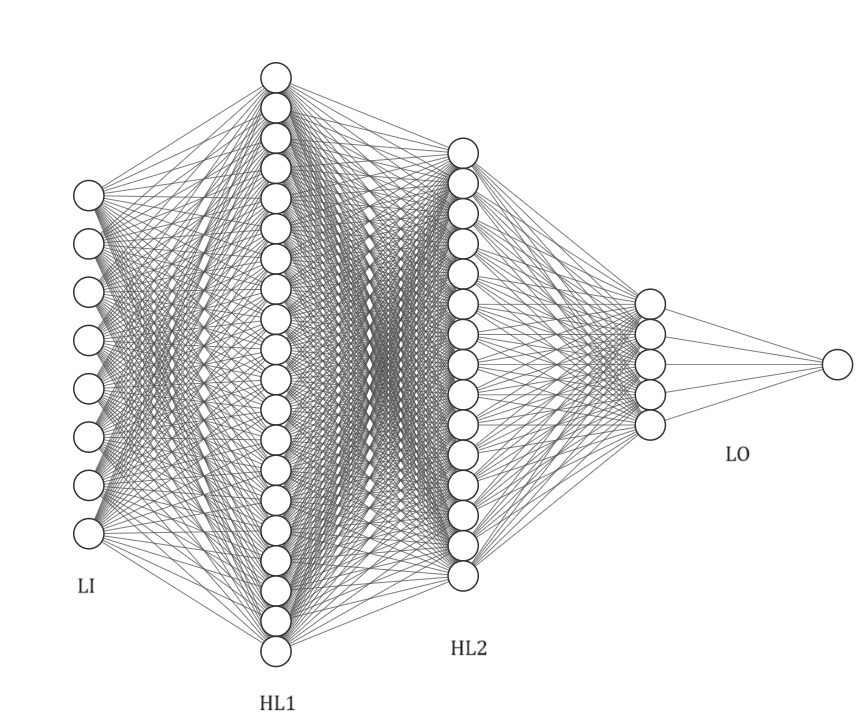

In [ ]:
Image('ANN.png',width=1000)

Avremo che la rete è costituia da 4 livelli:

* Livello di Input costituito da un neurone per ogni features;
* 1 Livello Nascoto costituito da 64 neuroni;
* 2 Livello Nascosto costituito da 32 neuroni;
* Livello di output costituito da un solo neurone;

In [ ]:
image = files.upload()

Saving ANN2.png to ANN2.png


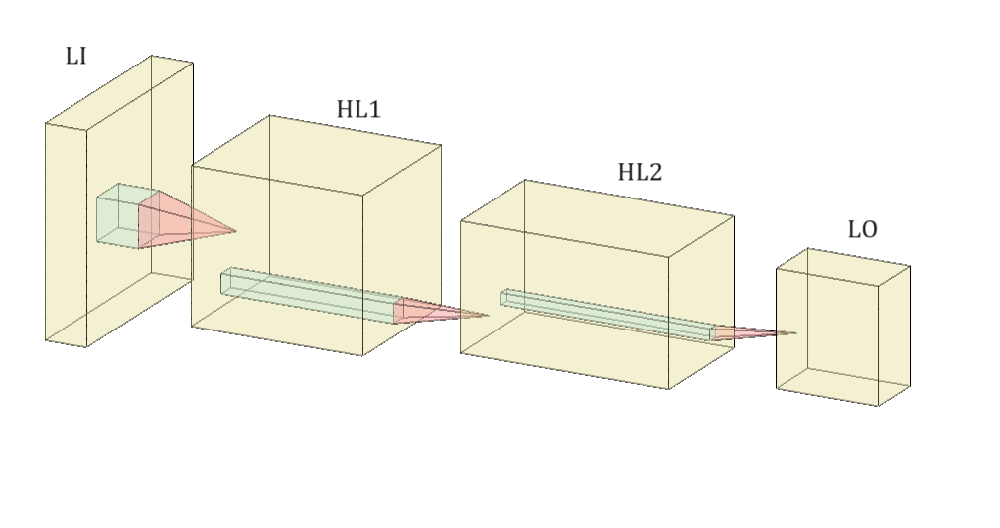

In [ ]:
Image('ANN2.png',width=1000)

Le funzioni di attivazioni usata nella regressione è la ReLU, in quanto introduce una non linearità importante nella rete neurale, permettendo di modellare relazioni complesse tra le variabili di input e l'output.

Inoltre è molto usata per la sua semplicità ed efficienza computazionale.

$ReLU(x) = max\{0,x\}$

Per quanto riguarda la classificazione, si usa sempre la ReLU nei livelli intermedi e in quello di input, ma essendo che dobbiamo restituire una percentuale di propabilità d'appartenenza ad una classe, come livello di output si utilizza una funzione di attivazione Sigmoide.

La Sigmoide trasforma qualsiasi valore in ingresso in un valore compreso tra 0 e 1. Questo la rende utile per compiti di classificazione binaria, dove l'output desiderato è un valore binario (ad esempio, 0 o 1) che rappresenta la probabilità che un dato appartenga a una specifica classe.

$σ(x) = \frac{1}{1 + e^{-x}}
$

### Regressione

In [ ]:
class NeuralNRegressione(nn.Module):

    def __init__(self,input_size):

        super(NeuralNRegressione, self).__init__()

        self.input_level = nn.Linear(input_size,64)
        self.relu_input = nn.ReLU()

        self.hidden_level1 = nn.Linear(64, 32)
        self.relu_h_level_1 = nn.ReLU()

        self.hidden_level2 = nn.Linear(32, 16)
        self.relu_h_level_2 = nn.ReLU()

        self.output_level = nn.Linear(16, 1)

    def forward(self, x):

        out = self.input_level(x)
        out = self.relu_input(out)

        out = self.hidden_level1(out)
        out = self.relu_h_level_1(out)

        out = self.hidden_level2(out)
        out = self.relu_h_level_2(out)

        out = self.output_level(out)

        return out


model = NeuralNRegressione(X_train.shape[1])

loss_fun = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
X_train_np = X_train.values
y_train_np = y_train.values
X_test_np = X_test.values
y_test_np = y_test.values

X_train_t = torch.tensor(X_train_np, dtype=torch.float32)
y_train_t = torch.tensor(y_train_np, dtype=torch.float32)
X_test_t = torch.tensor(X_test_np, dtype=torch.float32)
y_test_t = torch.tensor(y_test_np, dtype=torch.float32)

y_train_t = y_train_t.view(-1, 1)
y_test_t = y_test_t.view(-1, 1)

num_epochs = 1000
for epoch in range(num_epochs):
    model.train()

    outputs = model(X_train_t)
    loss = loss_fun(outputs, y_train_t)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if (epoch+1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

model.eval()
with torch.no_grad():
    predicted = model(X_test_t)

Epoch [100/1000], Loss: 45287973415026688.0000
Epoch [200/1000], Loss: 44693253588516864.0000
Epoch [300/1000], Loss: 43031401892675584.0000
Epoch [400/1000], Loss: 37979120193241088.0000
Epoch [500/1000], Loss: 34635047919157248.0000
Epoch [600/1000], Loss: 33640516029513728.0000
Epoch [700/1000], Loss: 33147855363375104.0000
Epoch [800/1000], Loss: 32897372870672384.0000
Epoch [900/1000], Loss: 32734110426333184.0000
Epoch [1000/1000], Loss: 32444902361006080.0000


In [ ]:
mse = mean_squared_error(y_test, predicted)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, predicted)
r2 = r2_score(y_test, predicted)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R-squared (R²): {r2:.4f}')

Mean Squared Error (MSE): 30939291258114204.0000
Root Mean Squared Error (RMSE): 175895682.8865
Mean Absolute Error (MAE): 96787231.7239
R-squared (R²): 0.4587


### Classificazione


In [ ]:
class NeuralClassifier(nn.Module):

    def __init__(self,input_size):

        super(NeuralClassifier, self).__init__()

        self.input_level = nn.Linear(input_size,64)
        self.relu_input = nn.ReLU()

        self.hidden_level1 = nn.Linear(64, 32)
        self.relu_h_level_1 = nn.ReLU()

        self.hidden_level2 = nn.Linear(32, 16)
        self.relu_h_level_2 = nn.ReLU()

        self.output_level = nn.Linear(16, 1)
        self.sig_output = nn.Sigmoid()

    def forward(self, x):

        out = self.input_level(x)
        out = self.relu_input(out)

        out = self.hidden_level1(out)
        out = self.relu_h_level_1(out)

        out = self.hidden_level2(out)
        out = self.relu_h_level_2(out)

        out = self.output_level(out)
        out = self.sig_output(out)

        return out


model = NeuralClassifier(X_train.shape[1])

loss_fun = nn.BCELoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001)

In [ ]:
X_train_np = X_train.values
y_train_np = y_train.values
X_test_np = X_test.values
y_test_np = y_test.values

X_train_t = torch.tensor(X_train_np, dtype=torch.float32)
y_train_t = torch.tensor(y_train_np, dtype=torch.float32)
X_test_t = torch.tensor(X_test_np, dtype=torch.float32)
y_test_t = torch.tensor(y_test_np, dtype=torch.float32)

y_train_t = y_train_t.view(-1, 1)
y_test_t = y_test_t.view(-1, 1)

num_epochs = 1000
for epoch in range(num_epochs):
    model.train()

    outputs = model(X_train_t)
    loss = loss_fun(outputs, y_train_t)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if (epoch+1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

model.eval()
with torch.no_grad():
    outputs = model(X_test_t)
    predicted = (outputs > 0.5).float()

Epoch [100/1000], Loss: 0.6734
Epoch [200/1000], Loss: 0.6537
Epoch [300/1000], Loss: 0.6423
Epoch [400/1000], Loss: 0.6255
Epoch [500/1000], Loss: 0.6129
Epoch [600/1000], Loss: 0.6047
Epoch [700/1000], Loss: 0.5977
Epoch [800/1000], Loss: 0.5916
Epoch [900/1000], Loss: 0.5856
Epoch [1000/1000], Loss: 0.5912


In [ ]:
accuracy = accuracy_score(y_test, predicted)
f1 = f1_score(y_test,predicted)
print(f'Accuracy: {accuracy:.4f}')
print(f'F1: {f1:.4f}')

Accuracy: 0.6787
F1: 0.7559
